COMPLETE ENTERPRISE INDUSTRY DATASET EDA PIPELINE

Dataset Loaded Successfully!

HEAD

   id  company_name       industry  country  employee_count  annual_revenue_million  profit_margin_percent  founded_year  customer_count  market_rating created_date         region
0   1    FinTrust_1        Finance    India             535                  539.38                  40.42          2010           81191            0.7   13-10-2025           Asia
1   2    TechNova_2     Technology  Germany            3806                  852.42                  39.55          2010           92162            3.4   01-12-2025         Europe
2   3   RetailHub_3         Retail   Canada            2779                  257.11                  23.68          1996           27532            2.9   04-05-2025  North America
3   4  BuildWorks_4  Manufacturing      USA             835                  309.14                  31.31          1993           90815            0.9   01-02-2026  North America
4   5    Medi

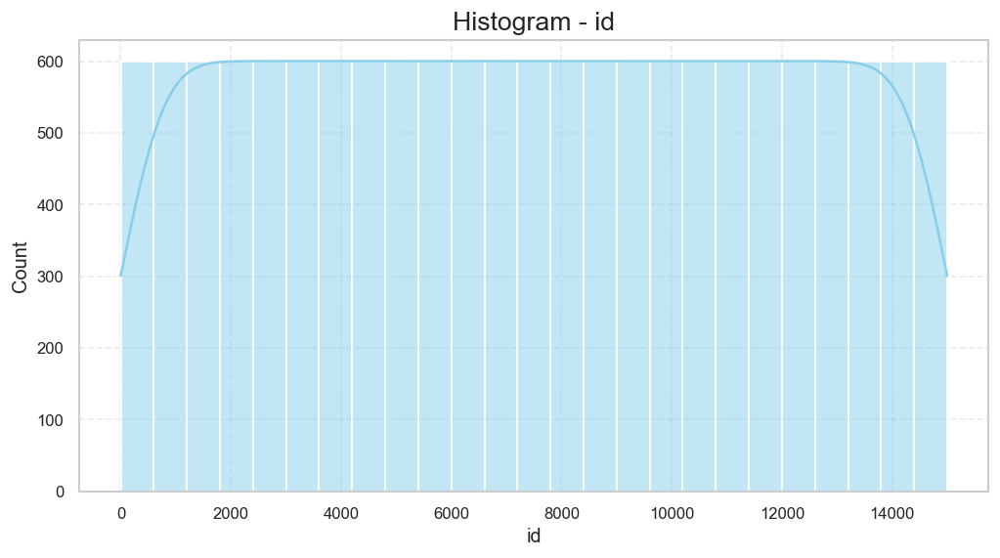


------------------------------------------------------------
INSIGHTS FOR ID
------------------------------------------------------------
Average Value : 7500.5
Median Value : 7500.5
Minimum Value : 1
Maximum Value : 15000
Standard Deviation : 4330.27
Skewness : 0.0
Kurtosis : -1.2
Reading : Distribution appears balanced.


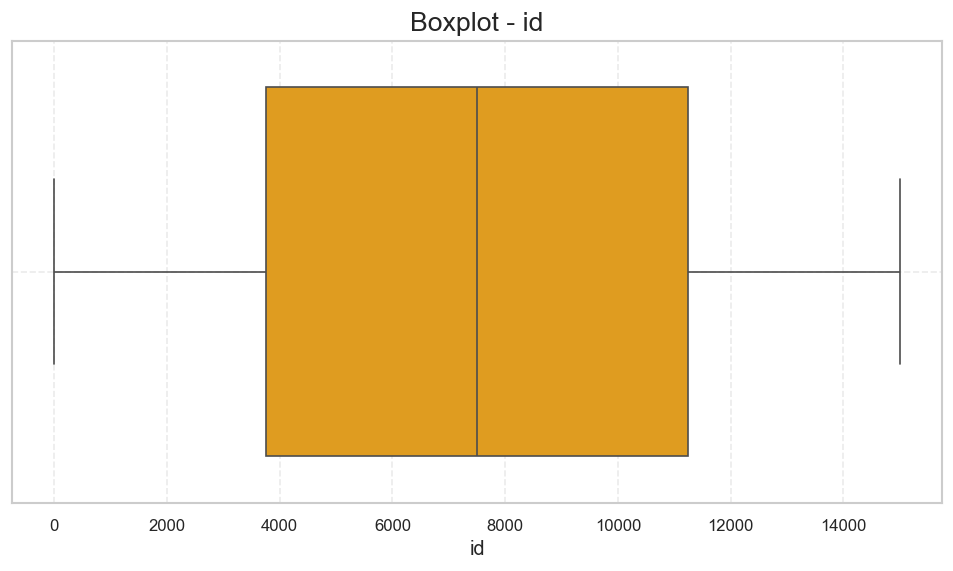

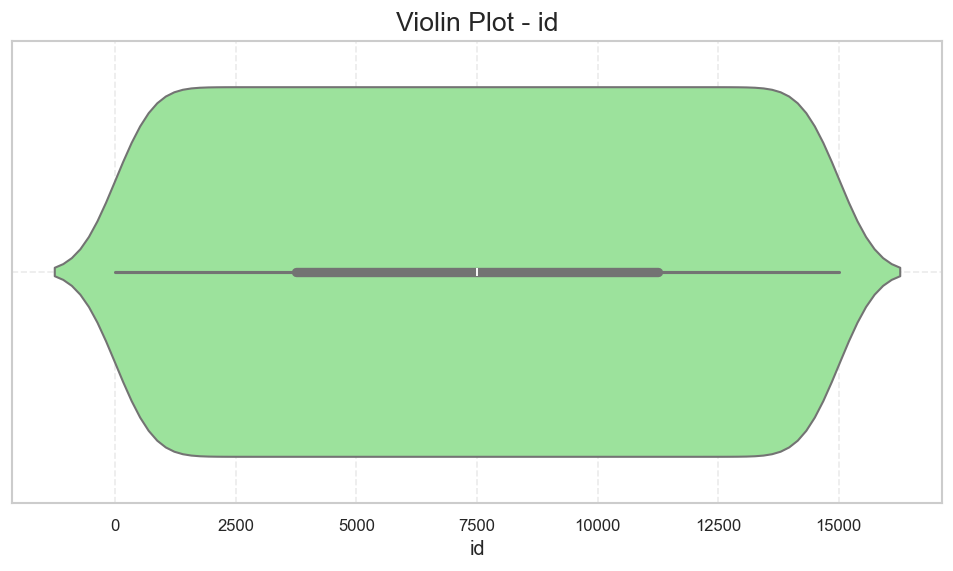

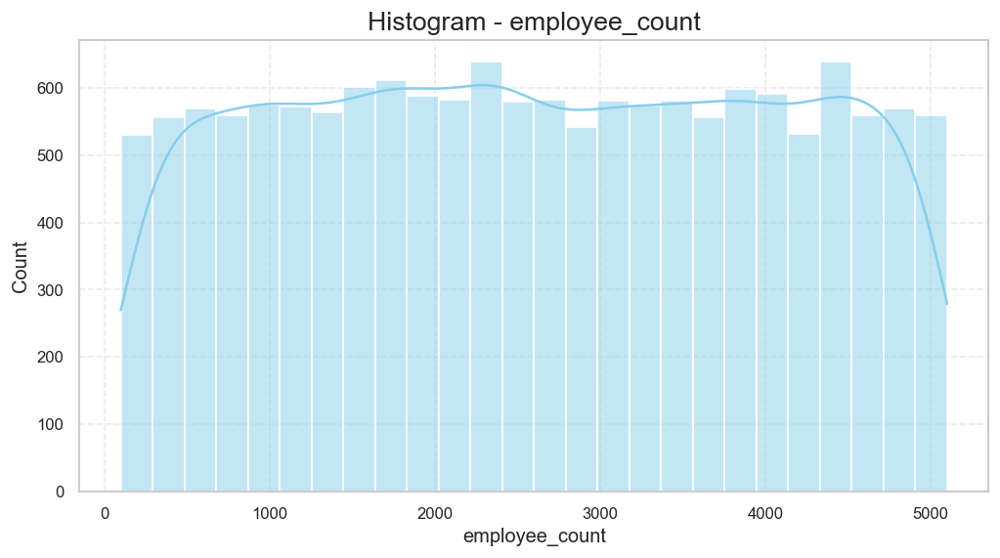


------------------------------------------------------------
INSIGHTS FOR EMPLOYEE_COUNT
------------------------------------------------------------
Average Value : 2606.86
Median Value : 2587.0
Minimum Value : 100
Maximum Value : 5099
Standard Deviation : 1430.56
Skewness : 0.0
Kurtosis : -1.19
Reading : Distribution is positively skewed.


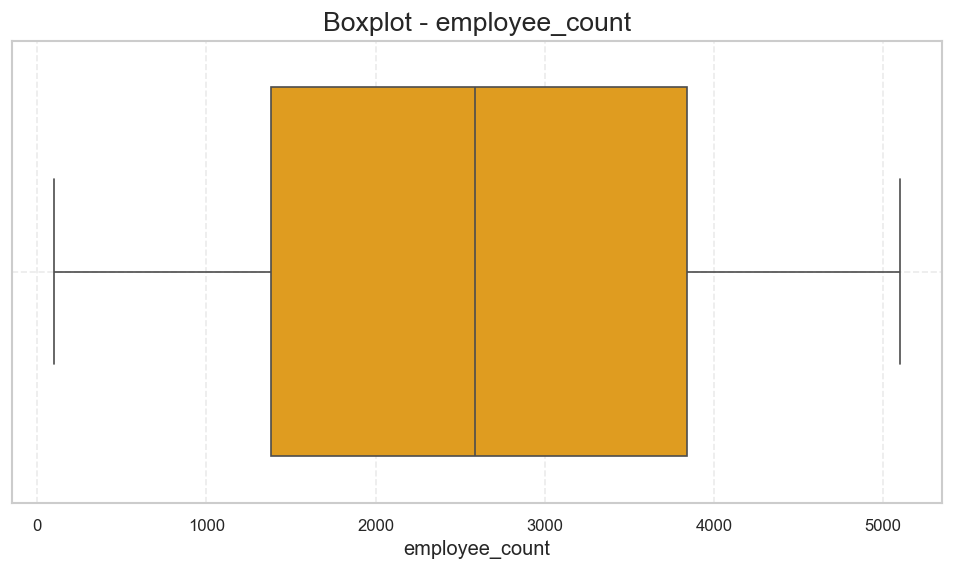

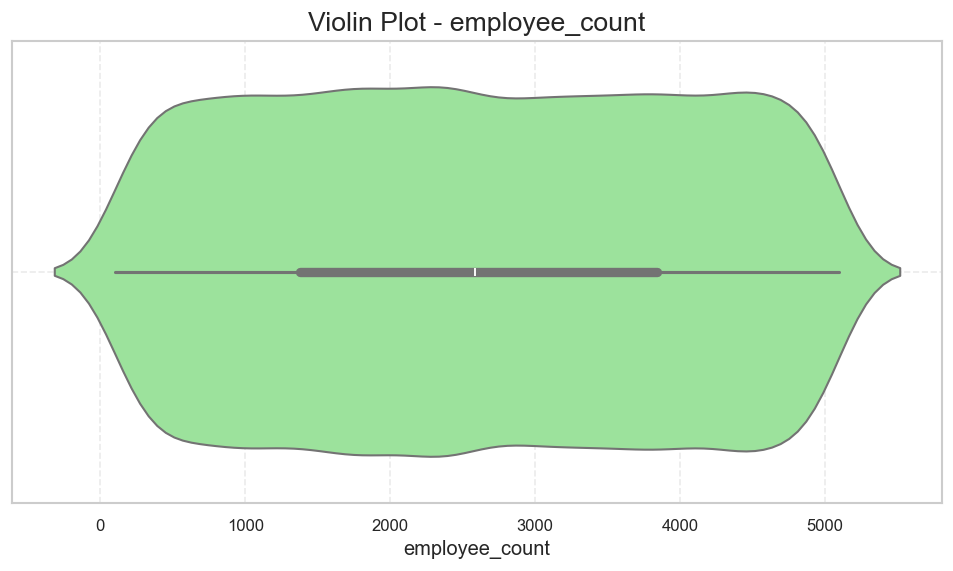

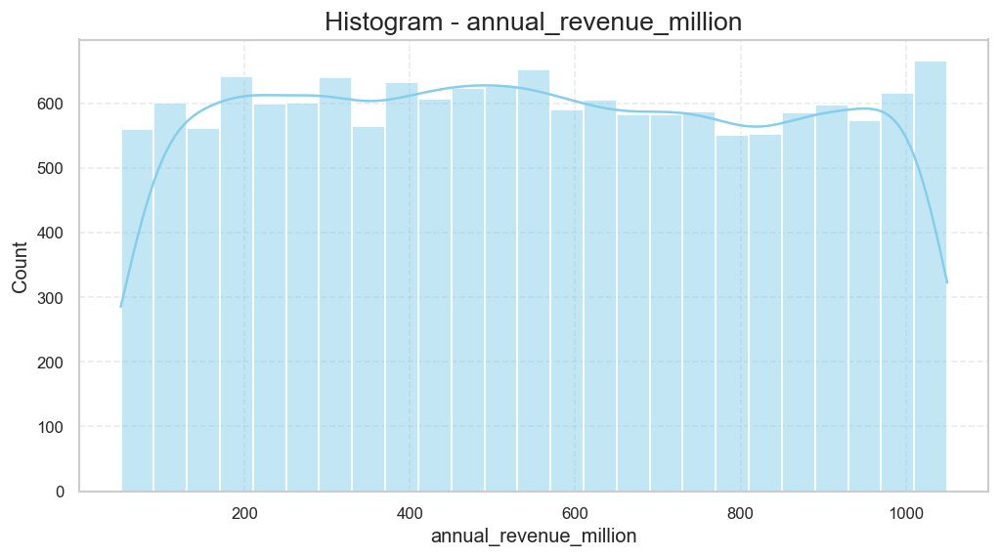


------------------------------------------------------------
INSIGHTS FOR ANNUAL_REVENUE_MILLION
------------------------------------------------------------
Average Value : 549.73
Median Value : 543.92
Minimum Value : 50.16
Maximum Value : 1049.96
Standard Deviation : 288.24
Skewness : 0.03
Kurtosis : -1.19
Reading : Distribution is positively skewed.


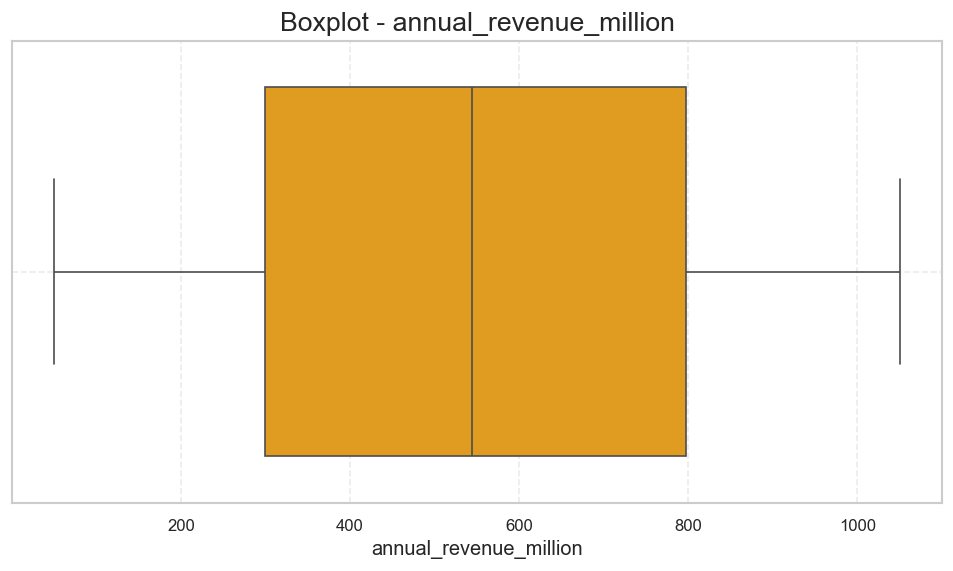

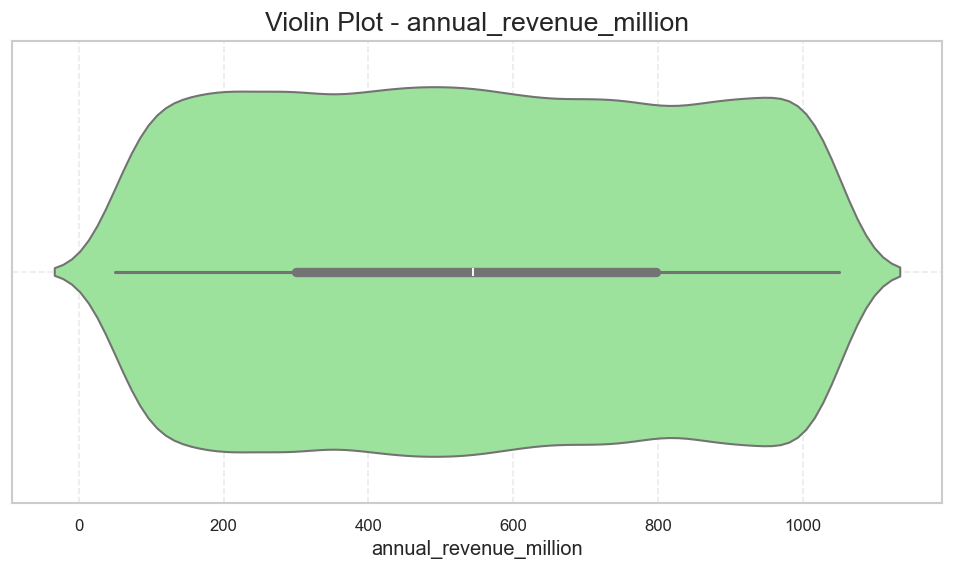

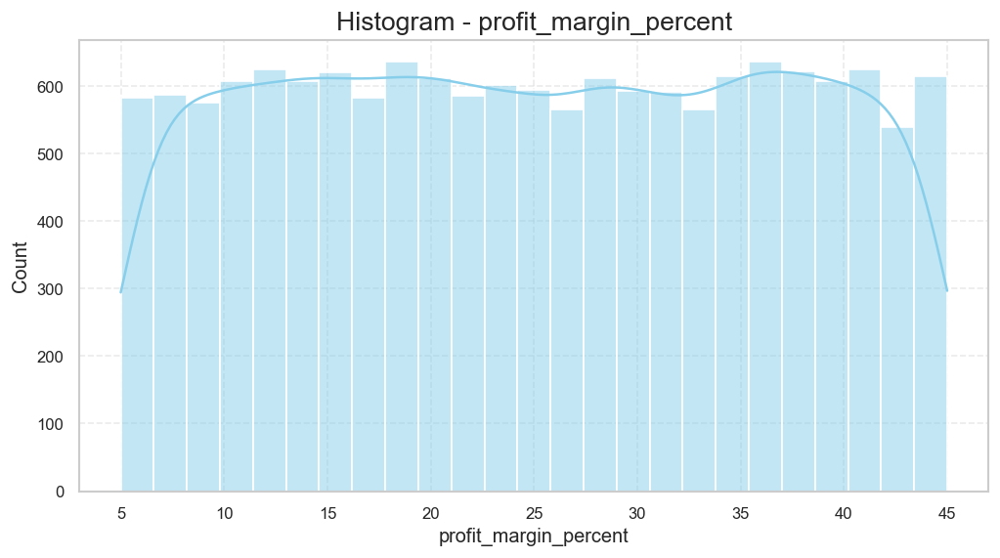


------------------------------------------------------------
INSIGHTS FOR PROFIT_MARGIN_PERCENT
------------------------------------------------------------
Average Value : 25.01
Median Value : 24.91
Minimum Value : 5.0
Maximum Value : 45.0
Standard Deviation : 11.53
Skewness : 0.0
Kurtosis : -1.2
Reading : Distribution is positively skewed.


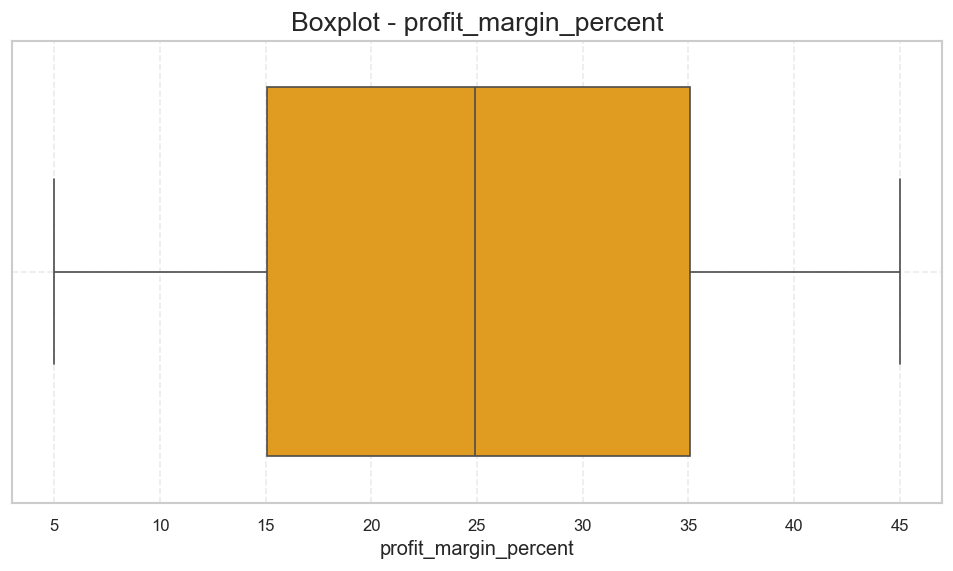

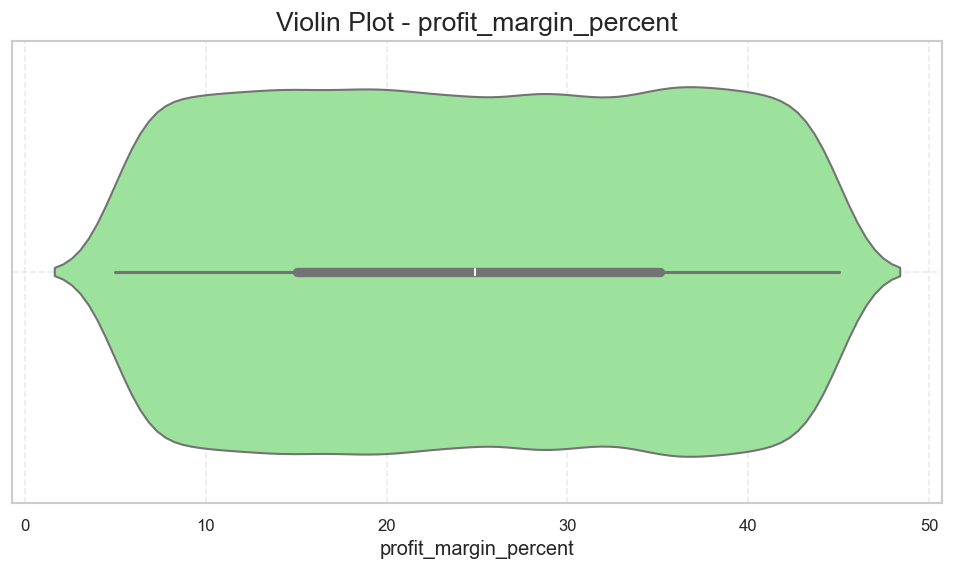

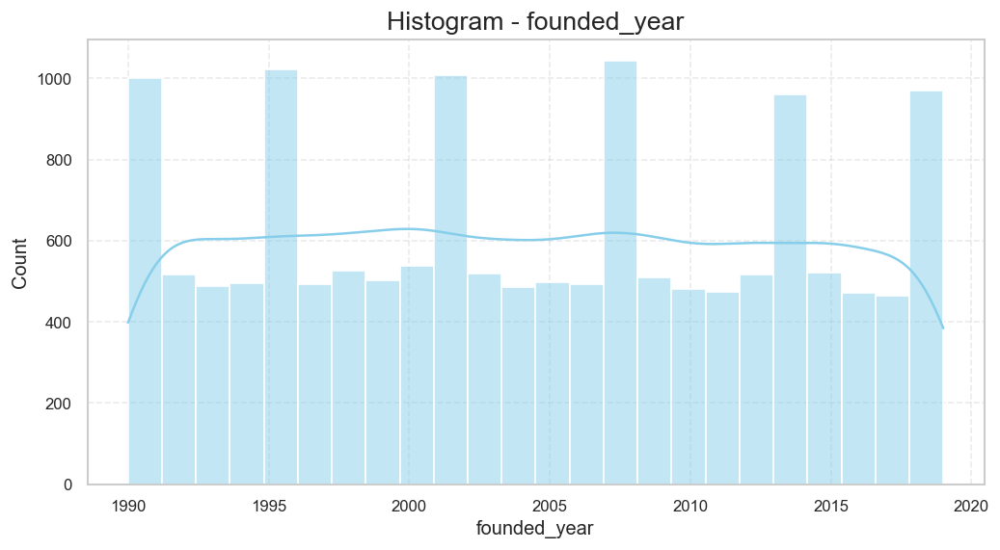


------------------------------------------------------------
INSIGHTS FOR FOUNDED_YEAR
------------------------------------------------------------
Average Value : 2004.37
Median Value : 2004.0
Minimum Value : 1990
Maximum Value : 2019
Standard Deviation : 8.61
Skewness : 0.02
Kurtosis : -1.19
Reading : Distribution is positively skewed.


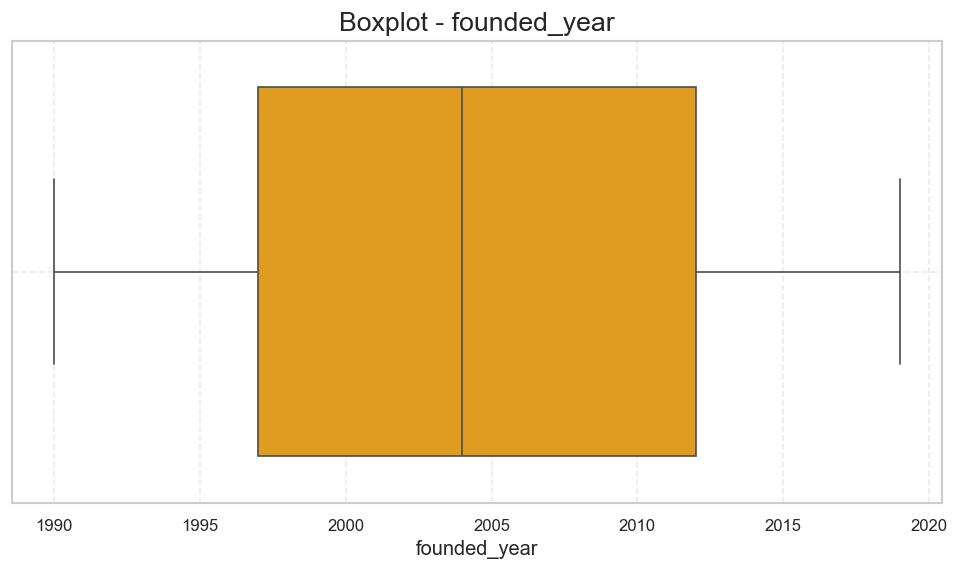

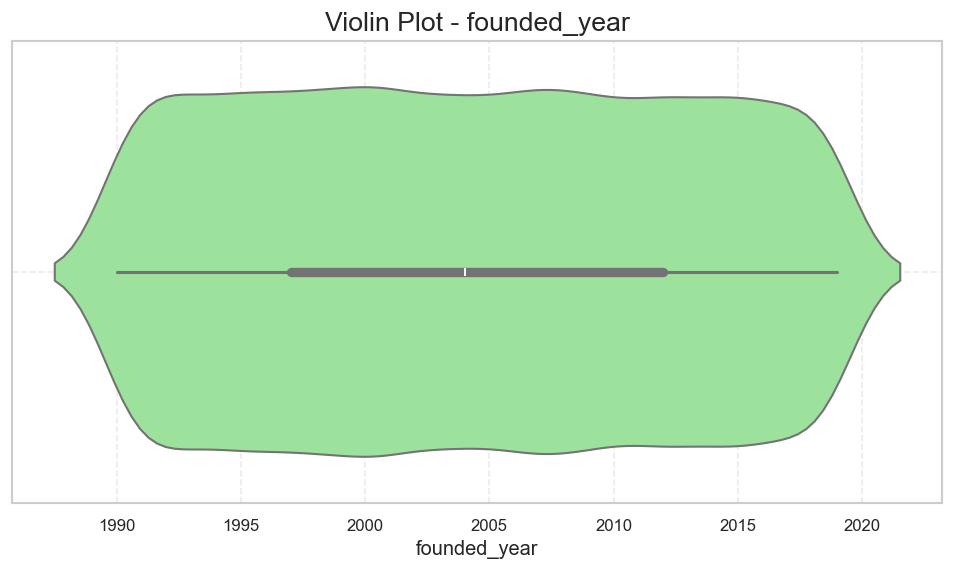

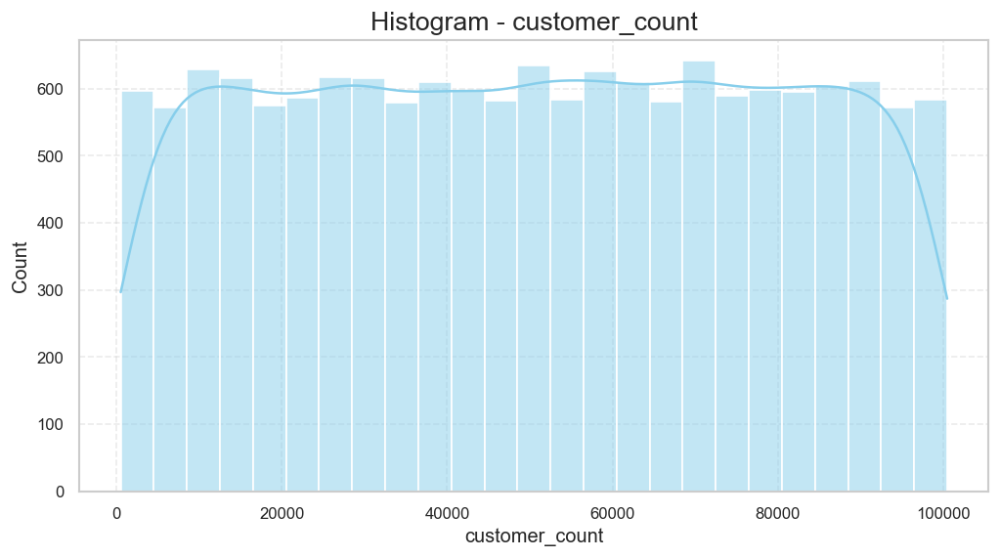


------------------------------------------------------------
INSIGHTS FOR CUSTOMER_COUNT
------------------------------------------------------------
Average Value : 50449.25
Median Value : 50726.5
Minimum Value : 500
Maximum Value : 100495
Standard Deviation : 28744.64
Skewness : -0.0
Kurtosis : -1.19
Reading : Distribution is negatively skewed.


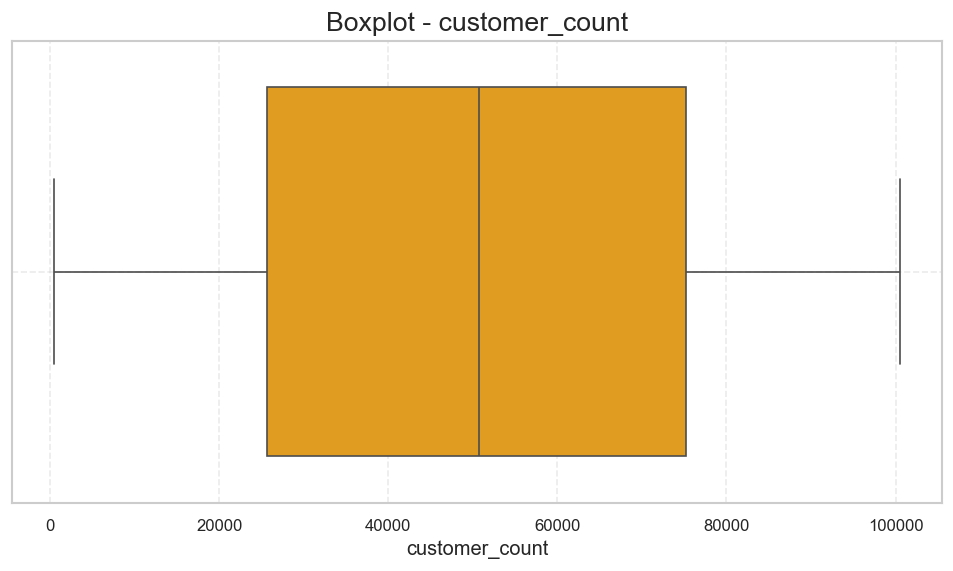

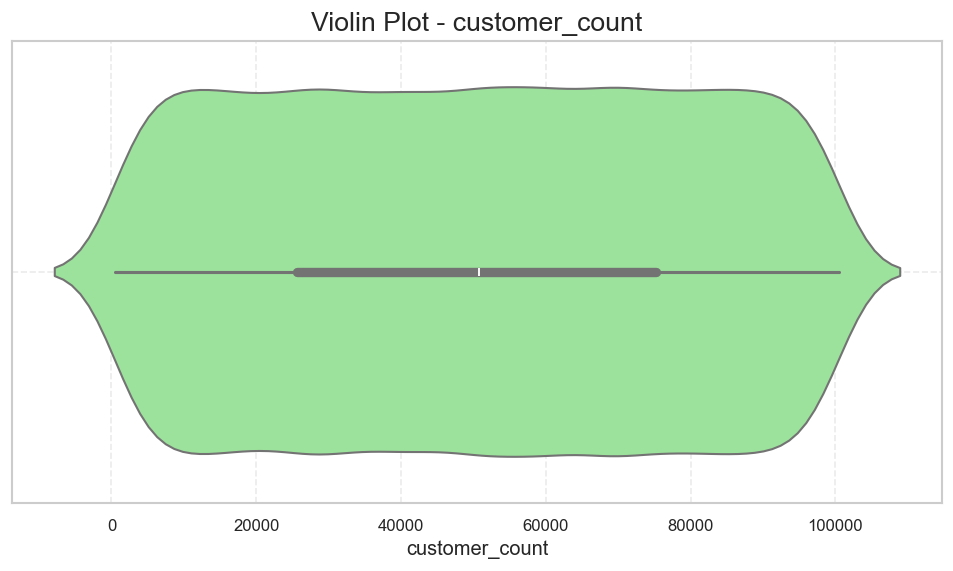

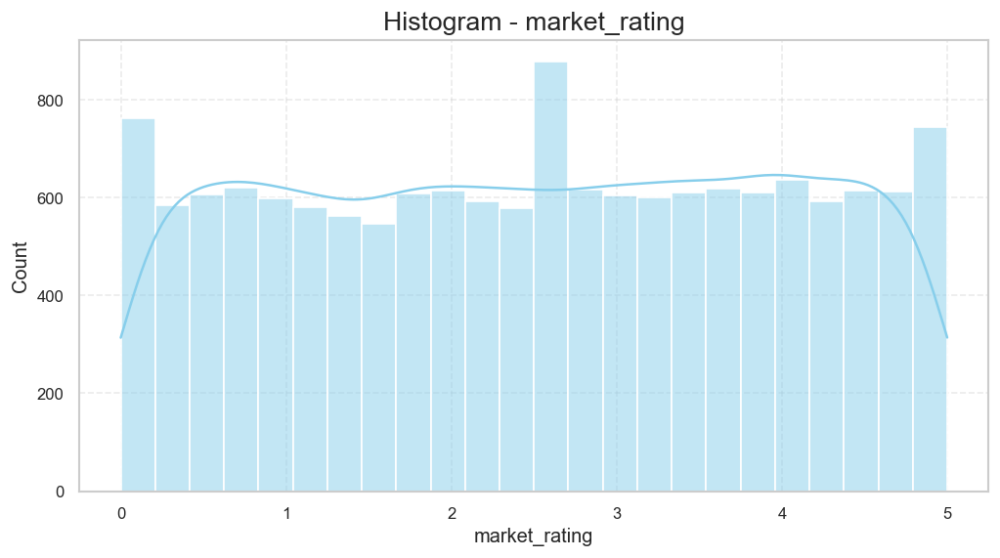


------------------------------------------------------------
INSIGHTS FOR MARKET_RATING
------------------------------------------------------------
Average Value : 2.51
Median Value : 2.5
Minimum Value : 0.0
Maximum Value : 5.0
Standard Deviation : 1.45
Skewness : -0.02
Kurtosis : -1.21
Reading : Distribution is positively skewed.


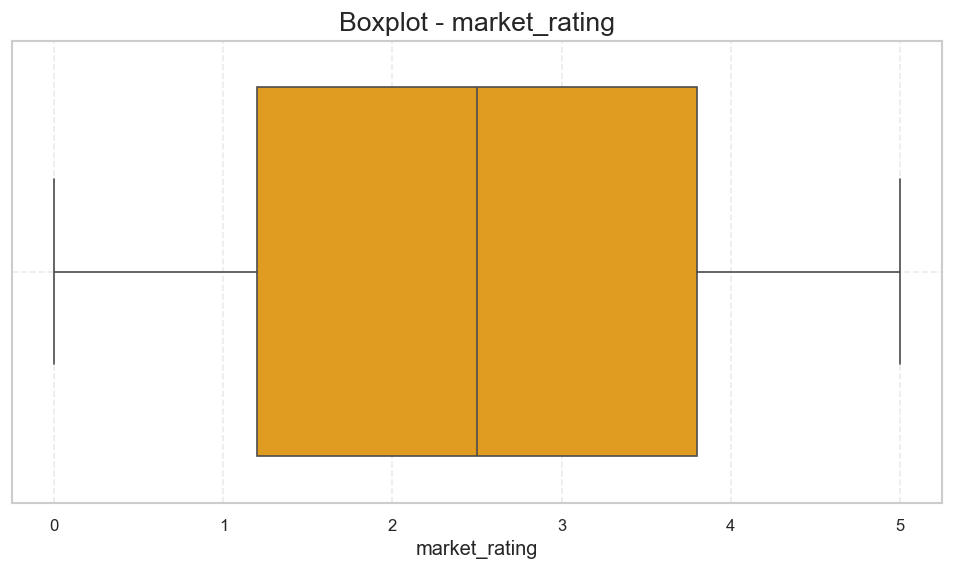

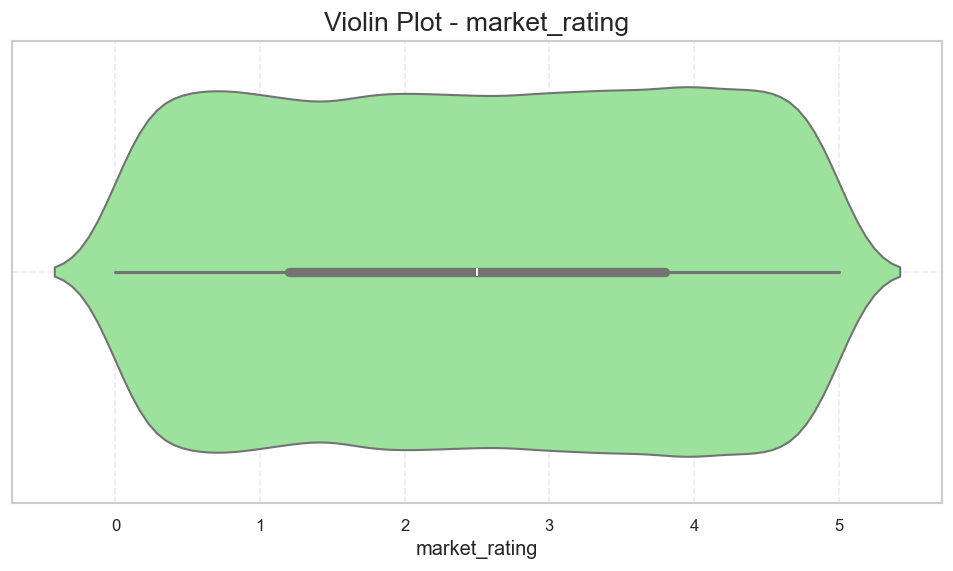

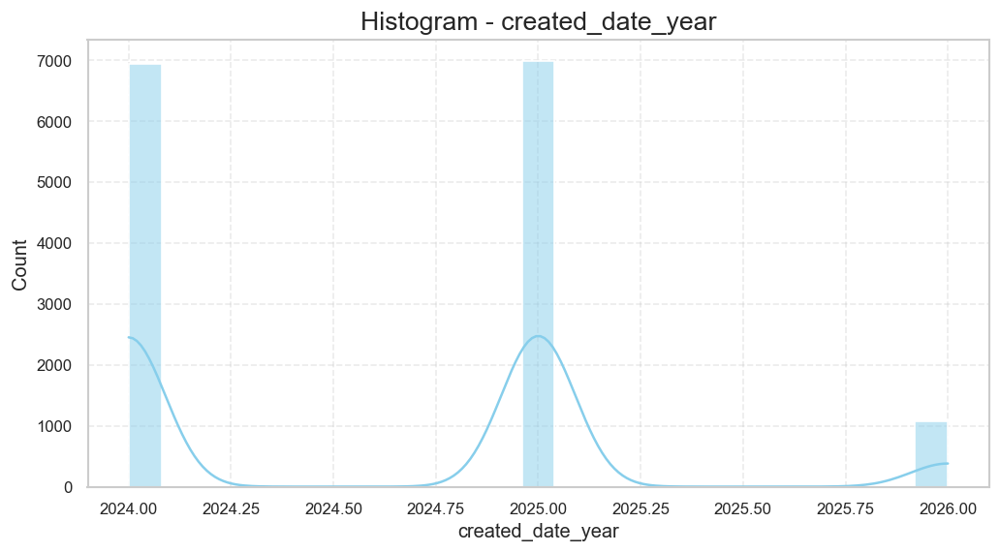


------------------------------------------------------------
INSIGHTS FOR CREATED_DATE_YEAR
------------------------------------------------------------
Average Value : 2024.61
Median Value : 2025.0
Minimum Value : 2024
Maximum Value : 2026
Standard Deviation : 0.62
Skewness : 0.49
Kurtosis : -0.64
Reading : Distribution is negatively skewed.


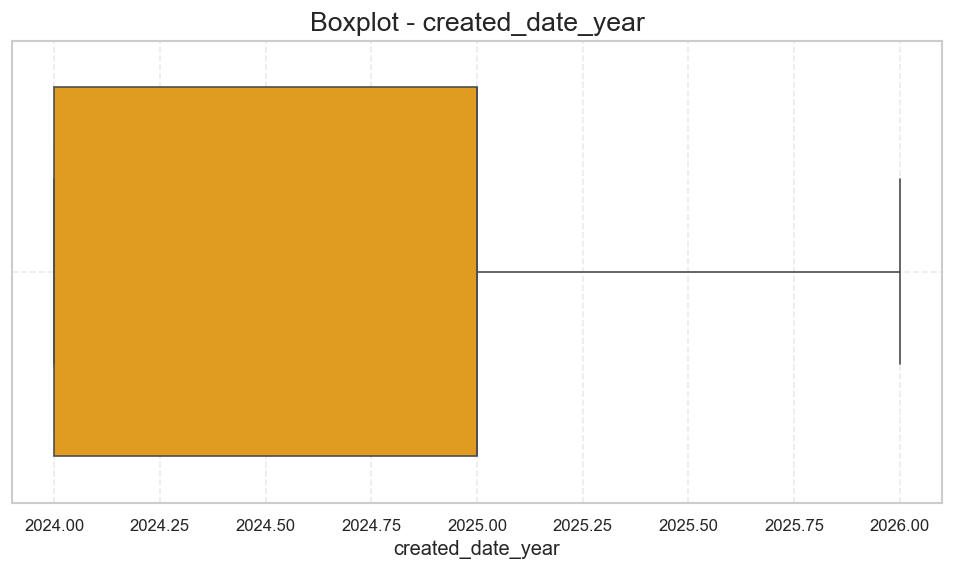

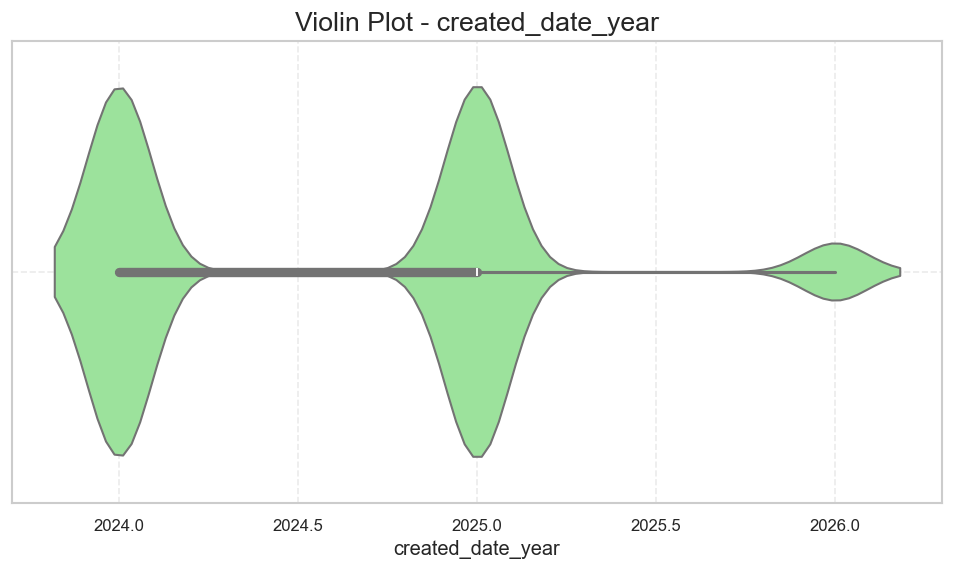

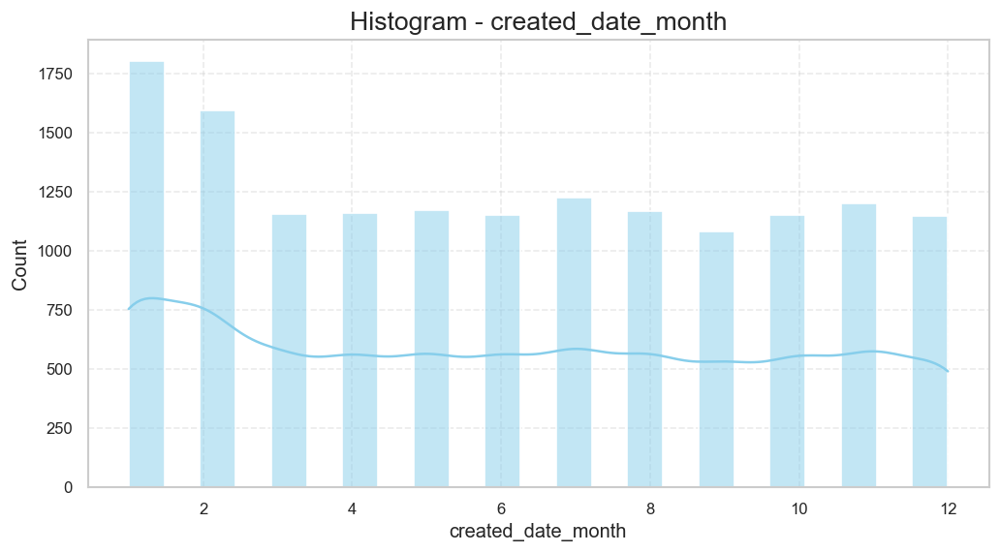


------------------------------------------------------------
INSIGHTS FOR CREATED_DATE_MONTH
------------------------------------------------------------
Average Value : 6.13
Median Value : 6.0
Minimum Value : 1
Maximum Value : 12
Standard Deviation : 3.58
Skewness : 0.1
Kurtosis : -1.28
Reading : Distribution is positively skewed.


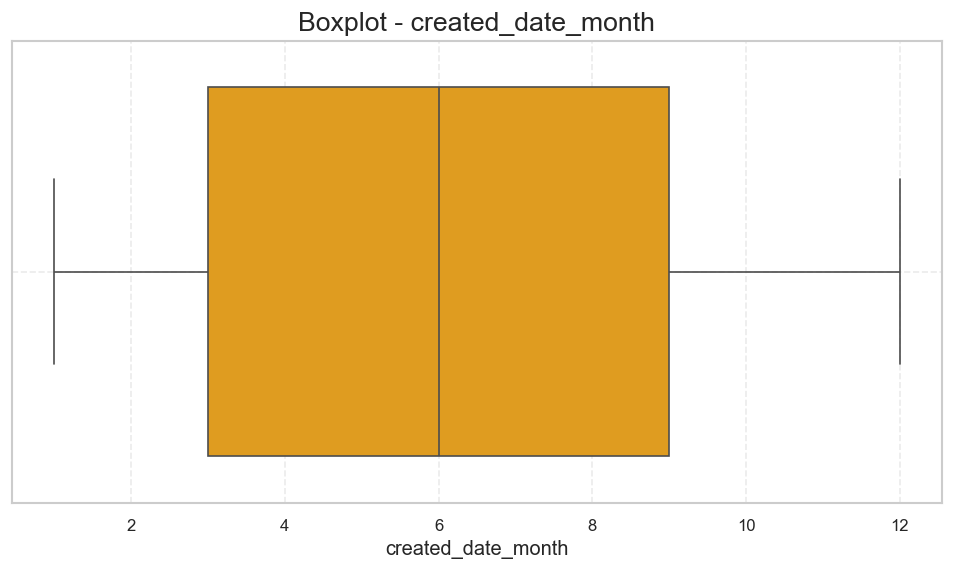

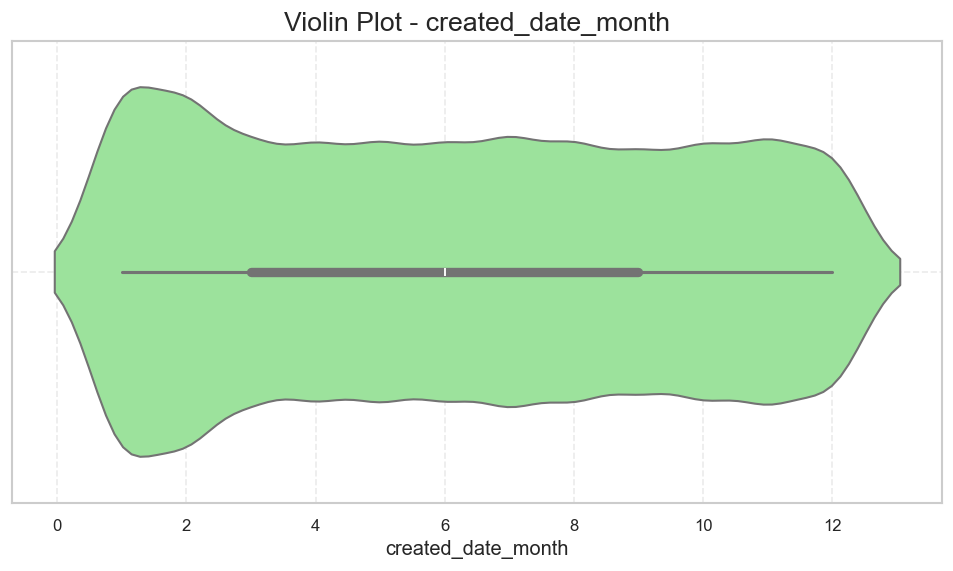

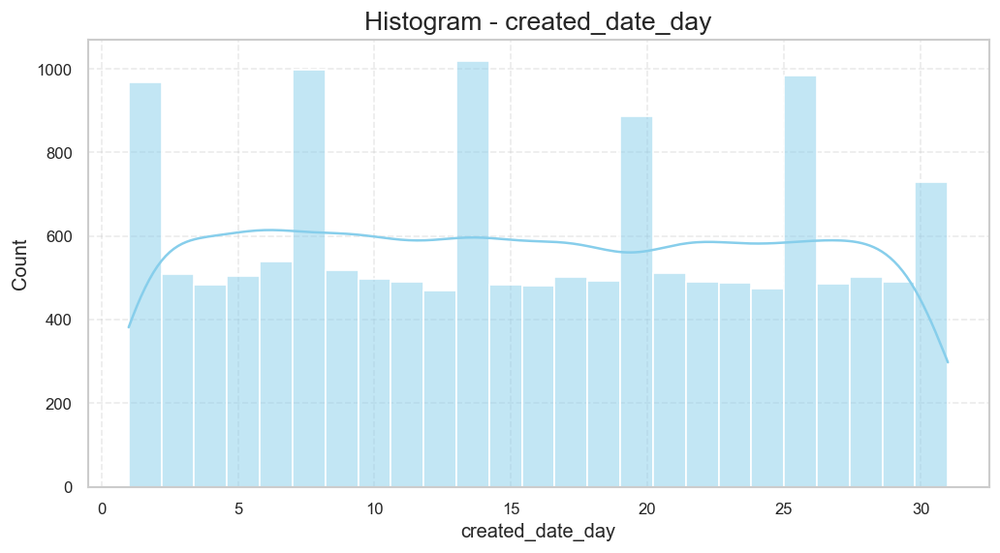


------------------------------------------------------------
INSIGHTS FOR CREATED_DATE_DAY
------------------------------------------------------------
Average Value : 15.67
Median Value : 16.0
Minimum Value : 1
Maximum Value : 31
Standard Deviation : 8.82
Skewness : 0.03
Kurtosis : -1.21
Reading : Distribution is negatively skewed.


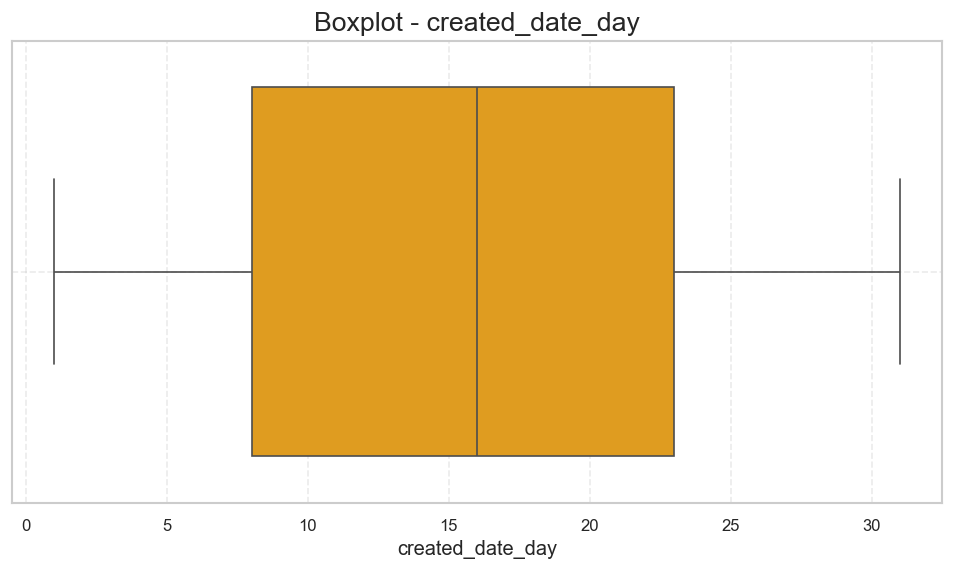

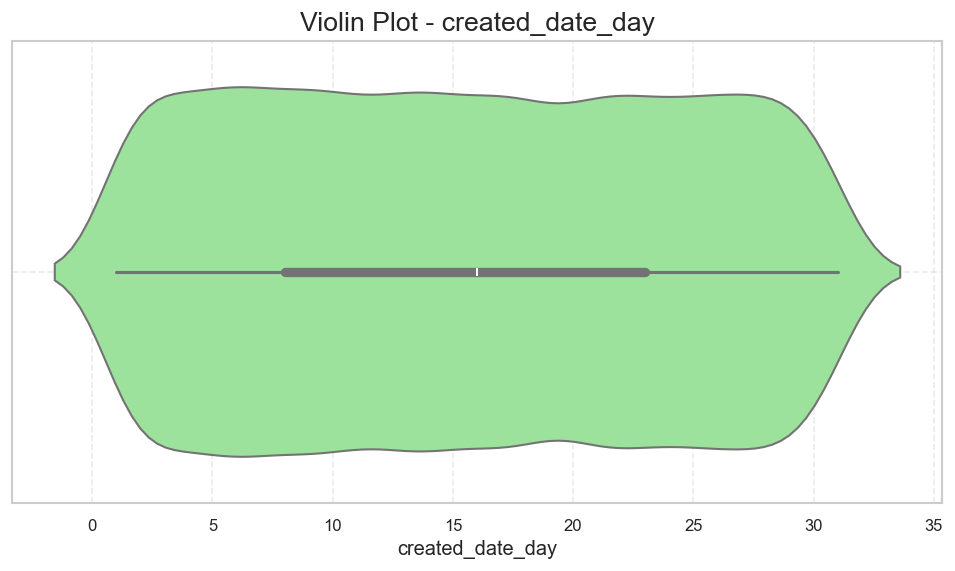

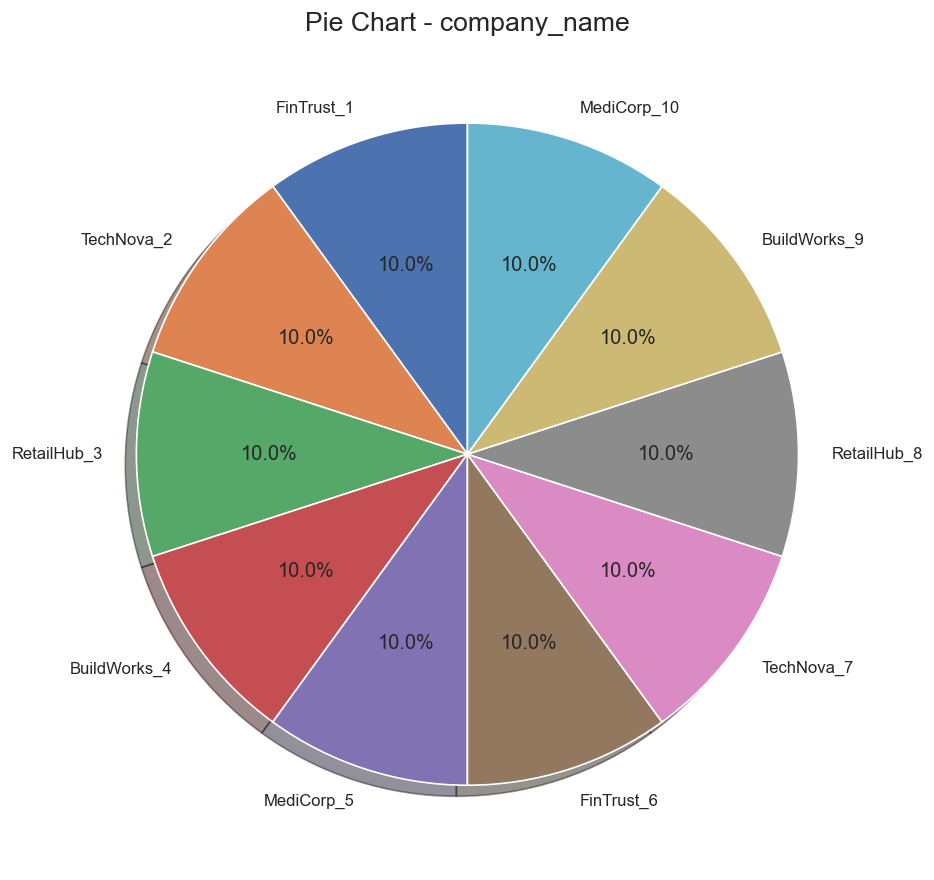

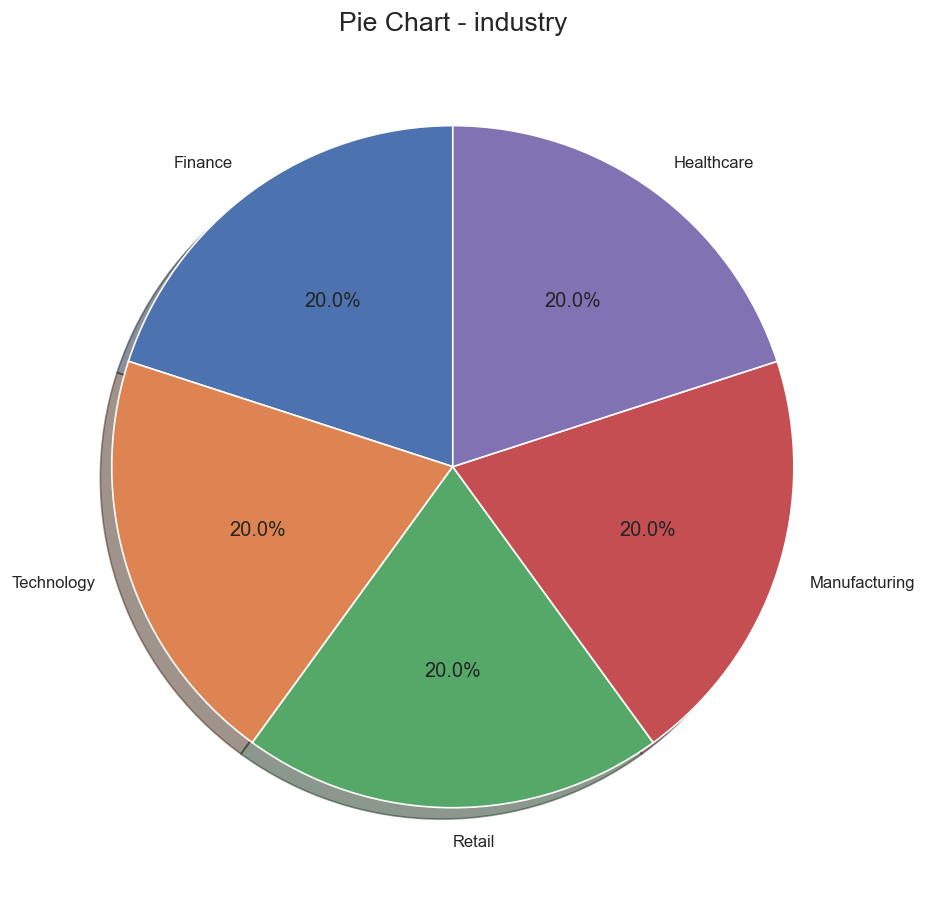

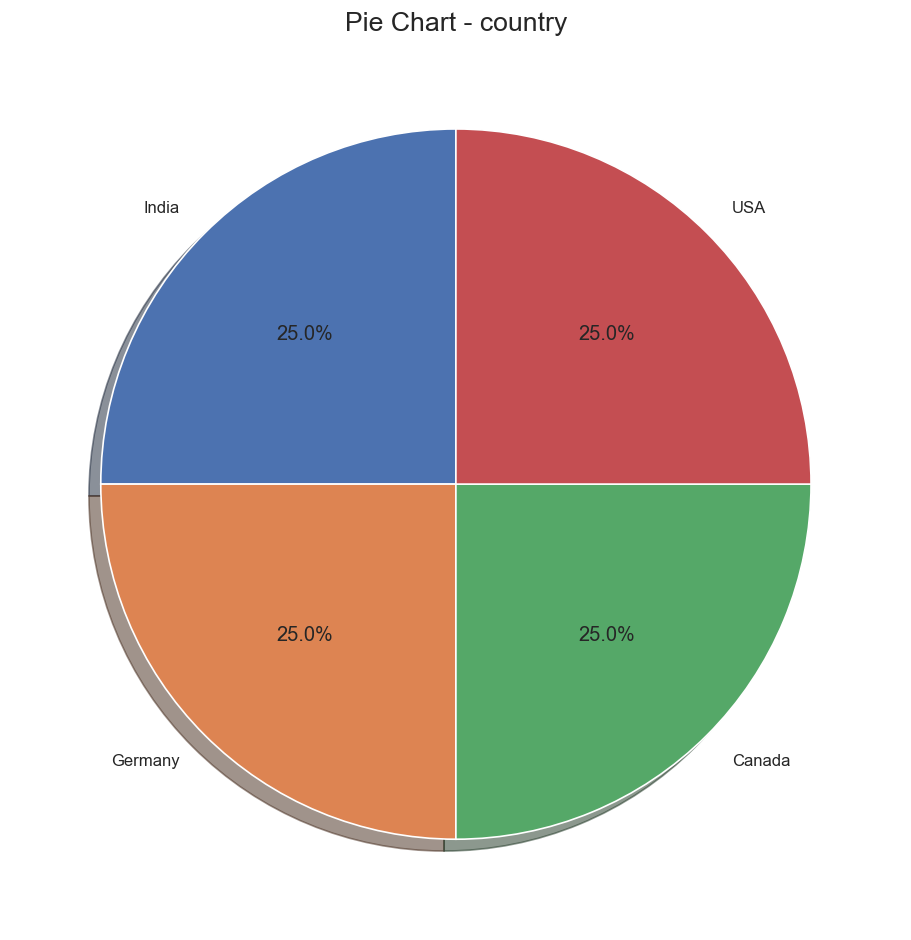

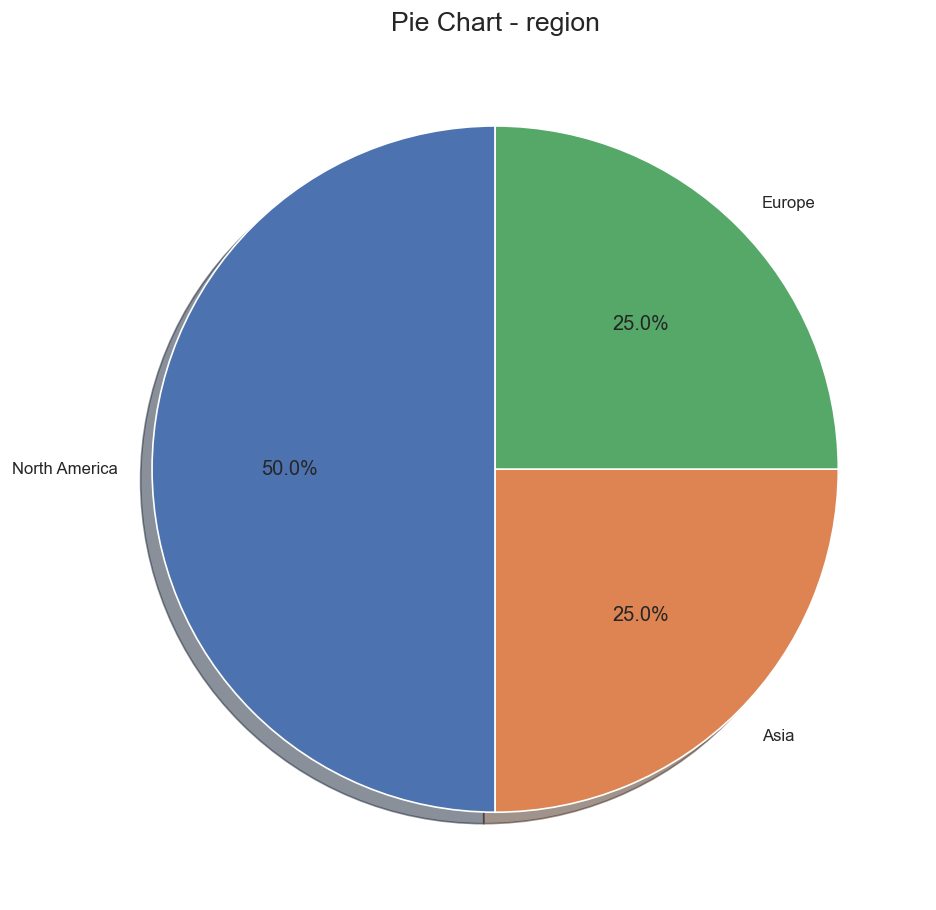

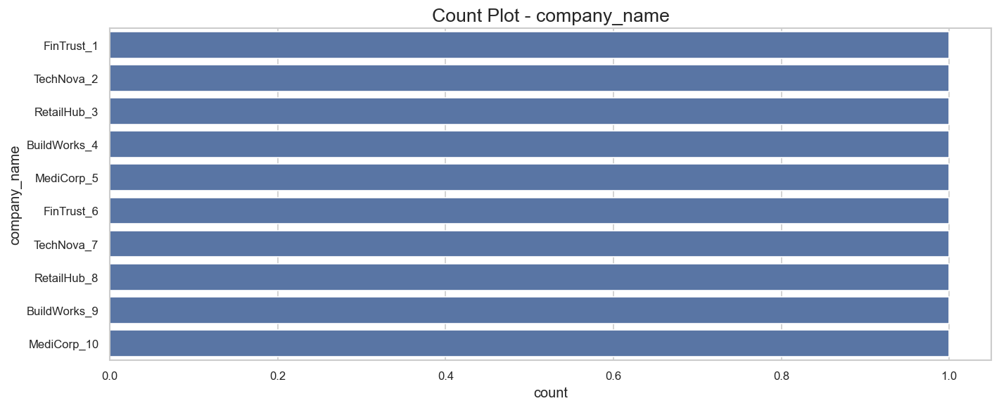

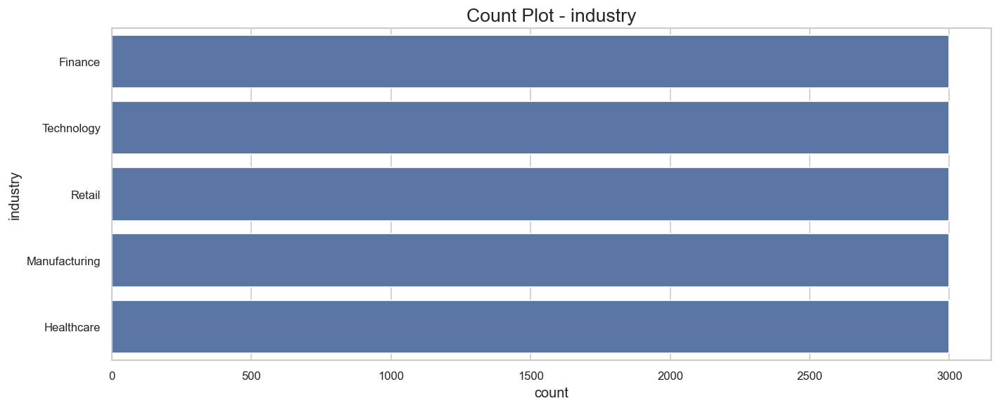

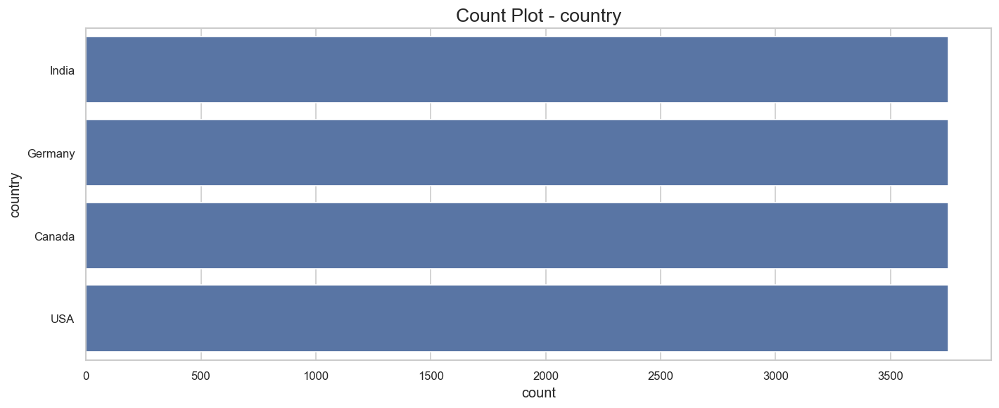

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import (
    zscore,
    shapiro,
    skew,
    kurtosis
)

from pandas.plotting import (
    lag_plot,
    autocorrelation_plot,
    parallel_coordinates
)

from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor

from sklearn.ensemble import (
    RandomForestRegressor,
    GradientBoostingRegressor,
    IsolationForest
)

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

from sklearn.preprocessing import (
    StandardScaler,
    PolynomialFeatures
)

from sklearn.model_selection import train_test_split

from sklearn.metrics import (
    mean_absolute_error,
    mean_squared_error,
    r2_score,
    silhouette_score
)

from statsmodels.stats.outliers_influence import (
    variance_inflation_factor
)

import warnings
warnings.filterwarnings("ignore")

# =========================================================
# SETTINGS
# =========================================================

pd.set_option('display.max_columns', None)
pd.set_option('display.width', 300)

sns.set_theme(
    style="whitegrid",
    palette="deep"
)

plt.rcParams['figure.figsize'] = (10,5)
plt.rcParams['figure.dpi'] = 120
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10

print("="*70)
print("COMPLETE ENTERPRISE INDUSTRY DATASET EDA PIPELINE")
print("="*70)

# =========================================================
# LOAD DATASET
# =========================================================

df = pd.read_csv("INDUSTRY.csv")

print("\nDataset Loaded Successfully!")

# =========================================================
# BASIC UNDERSTANDING
# =========================================================

print("\nHEAD\n")
print(df.head())

print("\nSHAPE\n")
print(df.shape)

print("\nINFO\n")
print(df.info())

print("\nDATA TYPES\n")
print(df.dtypes)

print("\nDESCRIPTIVE STATS\n")
print(df.describe(include='all'))

# =========================================================
# MISSING VALUES
# =========================================================

missing_df = pd.DataFrame({

    'Missing Values': df.isnull().sum(),

    'Percentage': (
        df.isnull().sum() / len(df)
    ) * 100

})

print("\nMISSING VALUES\n")
print(missing_df)

# =========================================================
# DUPLICATES
# =========================================================

print("\nDUPLICATES\n")
print(df.duplicated().sum())

# =========================================================
# DATE DETECTION
# =========================================================

possible_date_cols = []

for col in df.columns:

    if 'date' in col.lower() or 'time' in col.lower():

        possible_date_cols.append(col)

for col in possible_date_cols:

    try:

        df[col] = pd.to_datetime(
            df[col],
            errors='coerce'
        )

        df[f'{col}_year'] = df[col].dt.year
        df[f'{col}_month'] = df[col].dt.month
        df[f'{col}_day'] = df[col].dt.day

    except:
        pass

# =========================================================
# COLUMN TYPES
# =========================================================

numerical_cols = df.select_dtypes(
    include=[np.number]
).columns.tolist()

categorical_cols = df.select_dtypes(
    include=['object', 'category']
).columns.tolist()

datetime_cols = df.select_dtypes(
    include=['datetime64']
).columns.tolist()

# =========================================================
# GRAPH INSIGHTS FUNCTION
# =========================================================

def graph_insights(series, col_name):

    try:

        print("\n" + "-"*60)
        print(f"INSIGHTS FOR {col_name.upper()}")
        print("-"*60)

        print(f"Average Value : {round(series.mean(),2)}")
        print(f"Median Value : {round(series.median(),2)}")
        print(f"Minimum Value : {round(series.min(),2)}")
        print(f"Maximum Value : {round(series.max(),2)}")
        print(f"Standard Deviation : {round(series.std(),2)}")

        print(f"Skewness : {round(skew(series.dropna()),2)}")
        print(f"Kurtosis : {round(kurtosis(series.dropna()),2)}")

        if series.mean() > series.median():

            print(
                "Reading : Distribution is positively skewed."
            )

        elif series.mean() < series.median():

            print(
                "Reading : Distribution is negatively skewed."
            )

        else:

            print(
                "Reading : Distribution appears balanced."
            )

        if skew(series.dropna()) > 1:

            print(
                "Business Insight : Few extremely large values dominate this feature."
            )

        if kurtosis(series.dropna()) > 3:

            print(
                "Business Insight : Presence of extreme enterprise-level observations."
            )

    except:
        pass

# =========================================================
# UNIVARIATE ANALYSIS
# =========================================================

print("\n" + "="*70)
print("UNIVARIATE ANALYSIS")
print("="*70)

for col in numerical_cols:

    try:

        if df[col].nunique() <= 1:
            continue

        # HISTOGRAM

        plt.figure()

        sns.histplot(
            df[col].dropna(),
            kde=True,
            color='skyblue'
        )

        plt.title(f'Histogram - {col}')

        plt.grid(
            True,
            linestyle='--',
            alpha=0.4
        )

        plt.show()

        graph_insights(
            df[col].dropna(),
            col
        )

        # BOXPLOT

        plt.figure()

        sns.boxplot(
            x=df[col],
            color='orange'
        )

        plt.title(f'Boxplot - {col}')

        plt.grid(
            True,
            linestyle='--',
            alpha=0.4
        )

        plt.show()

        # VIOLIN PLOT

        plt.figure()

        sns.violinplot(
            x=df[col],
            color='lightgreen'
        )

        plt.title(f'Violin Plot - {col}')

        plt.grid(
            True,
            linestyle='--',
            alpha=0.4
        )

        plt.show()

    except:
        continue

# =========================================================
# PIE CHARTS
# =========================================================

for col in categorical_cols:

    try:

        top_values = df[col].value_counts().head(10)

        plt.figure(figsize=(8,8))

        top_values.plot.pie(
            autopct='%1.1f%%',
            shadow=True,
            startangle=90
        )

        plt.title(f'Pie Chart - {col}')

        plt.ylabel("")

        plt.tight_layout()

        plt.show()

    except:
        continue

# =========================================================
# BAR CHARTS
# =========================================================

for col in categorical_cols:

    try:

        plt.figure(figsize=(12,5))

        sns.countplot(
            y=df[col],
            order=df[col].value_counts().index[:10]
        )

        plt.title(f'Count Plot - {col}')

        plt.tight_layout()

        plt.show()

    except:
        continue

# =========================================================
# CORRELATION ANALYSIS
# =========================================================

print("\n" + "="*70)
print("CORRELATION ANALYSIS")
print("="*70)

if len(numerical_cols) >= 2:

    correlation_matrix = df[
        numerical_cols
    ].corr()

    plt.figure(figsize=(16,10))

    sns.heatmap(
        correlation_matrix,
        annot=True,
        cmap='RdYlBu',
        fmt='.2f',
        linewidths=0.5,
        square=True
    )

    plt.title("Correlation Heatmap")

    plt.show()

# =========================================================
# SCATTERPLOTS
# =========================================================

if len(numerical_cols) >= 2:

    for i in range(min(5, len(numerical_cols)-1)):

        try:

            plt.figure(figsize=(8,5))

            sns.scatterplot(
                x=numerical_cols[i],
                y=numerical_cols[i+1],
                data=df
            )

            plt.title(
                f"{numerical_cols[i]} vs {numerical_cols[i+1]}"
            )

            plt.grid(
                True,
                linestyle='--',
                alpha=0.4
            )

            plt.show()

        except:
            continue

# =========================================================
# BUBBLE CHARTS
# =========================================================

try:

    if len(numerical_cols) >= 3:

        plt.figure(figsize=(12,6))

        bubble_size = (
            df[numerical_cols[2]].fillna(0)
        )

        plt.scatter(
            df[numerical_cols[0]],
            df[numerical_cols[1]],
            s=bubble_size * 2,
            alpha=0.5
        )

        plt.xlabel(numerical_cols[0])
        plt.ylabel(numerical_cols[1])

        plt.title(
            f'Bubble Chart: {numerical_cols[0]} vs {numerical_cols[1]}'
        )

        plt.grid(
            True,
            linestyle='--',
            alpha=0.4
        )

        plt.show()

except:
    pass

# =========================================================
# NUMERICAL VS CATEGORICAL ANALYSIS
# =========================================================

for cat_col in categorical_cols:

    for num_col in numerical_cols:

        try:

            if df[cat_col].nunique() > 15:
                continue

            plt.figure(figsize=(14,6))

            sns.barplot(
                x=cat_col,
                y=num_col,
                data=df
            )

            plt.xticks(rotation=45)

            plt.title(f'{cat_col} vs {num_col}')

            plt.tight_layout()

            plt.show()

            grouped = df.groupby(cat_col)[num_col].mean()

            print(f"\nTOP {cat_col} BASED ON {num_col}\n")

            print(
                grouped.sort_values(
                    ascending=False
                ).head()
            )

        except:
            continue

# =========================================================
# PAIRPLOT
# =========================================================

try:

    sns.pairplot(
        df[numerical_cols[:5]].dropna()
    )

    plt.show()

except:
    pass

# =========================================================
# LAG PLOTS
# =========================================================

try:

    for col in numerical_cols[:3]:

        plt.figure(figsize=(6,6))

        lag_plot(
            df[col].dropna()
        )

        plt.title(f'Lag Plot - {col}')

        plt.grid(
            True,
            linestyle='--',
            alpha=0.4
        )

        plt.show()

except:
    pass

# =========================================================
# AUTOCORRELATION PLOTS
# =========================================================

try:

    for col in numerical_cols[:3]:

        plt.figure(figsize=(10,5))

        autocorrelation_plot(
            df[col].dropna()
        )

        plt.title(f'Autocorrelation Plot - {col}')

        plt.grid(
            True,
            linestyle='--',
            alpha=0.4
        )

        plt.show()

except:
    pass

# =========================================================
# TIME SERIES TREND ANALYSIS
# =========================================================

try:

    if len(datetime_cols) > 0 and len(numerical_cols) > 0:

        for date_col in datetime_cols:

            for num_col in numerical_cols[:3]:

                try:

                    temp_df = df[
                        [date_col, num_col]
                    ].dropna()

                    temp_df = temp_df.sort_values(
                        by=date_col
                    )

                    plt.figure(figsize=(14,6))

                    plt.plot(
                        temp_df[date_col],
                        temp_df[num_col]
                    )

                    plt.title(
                        f"Time Trend: {num_col} over {date_col}"
                    )

                    plt.xlabel(date_col)
                    plt.ylabel(num_col)

                    plt.xticks(rotation=45)

                    plt.grid(
                        True,
                        linestyle='--',
                        alpha=0.4
                    )

                    plt.show()

                except:
                    continue

except:
    pass

# =========================================================
# OUTLIER ANALYSIS
# =========================================================

print("\n" + "="*70)
print("OUTLIER ANALYSIS")
print("="*70)

for col in numerical_cols:

    try:

        z_scores = np.abs(
            zscore(df[col].dropna())
        )

        outlier_count = len(
            z_scores[z_scores > 3]
        )

        print(f"{col} -> Z-Score Outliers : {outlier_count}")

        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)

        IQR = Q3 - Q1

        lower = Q1 - 1.5 * IQR
        upper = Q3 + 1.5 * IQR

        iqr_outliers = df[
            (df[col] < lower) |
            (df[col] > upper)
        ]

        print(
            f"{col} -> IQR Outliers : {len(iqr_outliers)}"
        )

    except:
        pass

# =========================================================
# FEATURE ENGINEERING
# =========================================================

scaler = StandardScaler()

scaled_features = scaler.fit_transform(
    df[numerical_cols].fillna(0)
)

# =========================================================
# MULTICOLLINEARITY CHECK
# =========================================================

try:

    vif_data = pd.DataFrame()

    vif_data["Feature"] = numerical_cols

    vif_data["VIF"] = [

        variance_inflation_factor(
            df[numerical_cols].fillna(0).values,
            i
        )

        for i in range(len(numerical_cols))
    ]

    print("\nMULTICOLLINEARITY CHECK (VIF)\n")

    print(vif_data)

except:
    pass

# =========================================================
# TARGET DETECTION
# =========================================================

possible_targets = [
    'sales',
    'revenue',
    'profit',
    'customer_count',
    'annual_revenue_million',
    'profit_margin_percent'
]

target_col = None

for col in numerical_cols:

    if col.lower() in possible_targets:

        target_col = col
        break

if target_col is None and len(numerical_cols) > 0:

    target_col = numerical_cols[-1]

print(f"\nSelected Target Column : {target_col}")

# =========================================================
# MACHINE LEARNING
# =========================================================

print("\n" + "="*70)
print("MACHINE LEARNING")
print("="*70)

if target_col is not None:

    feature_cols = [

        col for col in numerical_cols

        if col != target_col
    ]

    model_df = df[
        feature_cols + [target_col]
    ].dropna()

    X = model_df[feature_cols]
    y = model_df[target_col]

    X_train, X_test, y_train, y_test = train_test_split(
        X,
        y,
        test_size=0.2,
        random_state=42
    )

    models = {

        "Linear Regression":
        LinearRegression(),

        "Decision Tree":
        DecisionTreeRegressor(),

        "Random Forest":
        RandomForestRegressor(),

        "Gradient Boosting":
        GradientBoostingRegressor()

    }

    model_results = []

    for model_name, model_obj in models.items():

        try:

            model_obj.fit(X_train, y_train)

            preds = model_obj.predict(X_test)

            r2 = r2_score(
                y_test,
                preds
            )

            rmse = np.sqrt(
                mean_squared_error(
                    y_test,
                    preds
                )
            )

            model_results.append([
                model_name,
                round(r2,2),
                round(rmse,2)
            ])

        except:
            continue

    results_df = pd.DataFrame(
        model_results,
        columns=[
            'Model',
            'R2 Score',
            'RMSE'
        ]
    )

    print("\nMODEL COMPARISON\n")
    print(results_df)

    plt.figure(figsize=(10,5))

    sns.barplot(
        x='Model',
        y='R2 Score',
        data=results_df
    )

    plt.title("Model Performance Comparison")

    plt.grid(
        True,
        linestyle='--',
        alpha=0.4
    )

    plt.show()

    # FUTURE FORECASTING

    best_model = RandomForestRegressor()

    best_model.fit(X_train, y_train)

    future_predictions = best_model.predict(
        X.tail(10)
    )

    prediction_df = pd.DataFrame({

        'Prediction_Number': range(
            1,
            len(future_predictions) + 1
        ),

        f'Predicted_{target_col}': np.round(
            future_predictions,
            2
        )

    })

    print("\nFUTURE PREDICTIONS\n")
    print(prediction_df)

    # FORECAST VISUALIZATION

    plt.figure(figsize=(10,5))

    plt.plot(
        prediction_df['Prediction_Number'],
        prediction_df[f'Predicted_{target_col}'],
        marker='o'
    )

    plt.title("Future Forecast Trend")

    plt.xlabel("Prediction Number")
    plt.ylabel(target_col)

    plt.grid(
        True,
        linestyle='--',
        alpha=0.4
    )

    plt.show()

    # FEATURE IMPORTANCE

    try:

        feature_importance = pd.DataFrame({

            'Feature': feature_cols,

            'Importance':
            best_model.feature_importances_

        }).sort_values(
            by='Importance',
            ascending=False
        )

        plt.figure(figsize=(12,6))

        sns.barplot(
            x='Importance',
            y='Feature',
            data=feature_importance
        )

        plt.title("Feature Importance")

        plt.grid(
            True,
            linestyle='--',
            alpha=0.4
        )

        plt.show()

    except:
        pass

# =========================================================
# CLUSTERING
# =========================================================

print("\n" + "="*70)
print("CLUSTERING ANALYSIS")
print("="*70)

try:

    clustering_df = df[
        numerical_cols
    ].dropna()

    kmeans = KMeans(
        n_clusters=3,
        random_state=42
    )

    clusters = kmeans.fit_predict(
        clustering_df
    )

    clustering_df['Cluster'] = clusters

    pca = PCA(n_components=2)

    pca_data = pca.fit_transform(
        clustering_df[numerical_cols]
    )

    plt.figure(figsize=(10,6))

    plt.scatter(
        pca_data[:,0],
        pca_data[:,1],
        c=clusters
    )

    plt.title("Cluster Visualization")

    plt.grid(
        True,
        linestyle='--',
        alpha=0.4
    )

    plt.show()

    score = silhouette_score(
        clustering_df[numerical_cols],
        clusters
    )

    print(f"\nSilhouette Score : {round(score,2)}")

except:
    pass

# =========================================================
# ANOMALY DETECTION
# =========================================================

try:

    anomaly_df = df[
        numerical_cols
    ].dropna()

    iso = IsolationForest(
        contamination=0.05,
        random_state=42
    )

    anomaly_labels = iso.fit_predict(
        anomaly_df
    )

    anomalies = anomaly_df[
        anomaly_labels == -1
    ]

    print(
        f"Anomalies Detected : {len(anomalies)}"
    )

except:
    pass

# =========================================================
# ADVANCED MULTIVARIATE ANALYSIS
# =========================================================

try:

    if len(categorical_cols) > 0:

        sample_df = df[
            numerical_cols[:4] + [categorical_cols[0]]
        ].dropna().head(200)

        plt.figure(figsize=(12,6))

        parallel_coordinates(
            sample_df,
            categorical_cols[0]
        )

        plt.title("Parallel Coordinates Plot")

        plt.grid(
            True,
            linestyle='--',
            alpha=0.4
        )

        plt.show()

except:
    pass

# =========================================================
# KPI DASHBOARD
# =========================================================

print("\n" + "="*70)
print("KPI DASHBOARD")
print("="*70)

try:

    kpi_df = pd.DataFrame({

        'Total': df[numerical_cols].sum(),

        'Average': df[numerical_cols].mean(),

        'Maximum': df[numerical_cols].max(),

        'Minimum': df[numerical_cols].min()

    })

    print("\nKPI DASHBOARD TABLE\n")

    print(kpi_df)

except:
    pass

# =========================================================
# BUSINESS RECOMMENDATIONS
# =========================================================

print("\nBUSINESS RECOMMENDATIONS\n")

print("""
1. Focus on high-performing industries generating maximum revenue.

2. Increase customer acquisition strategies in low-performing regions.

3. Monitor extreme outlier companies separately as they heavily influence revenue patterns.

4. Companies with high employee counts generally produce higher revenue.

5. Market ratings moderately influence profit margins and business growth.

6. Revenue distributions indicate market dominance by a few large enterprises.

7. Strong clustering patterns suggest clear business segmentation opportunities.

8. Anomaly detection identified unusual operational patterns requiring further investigation.

9. Technology and retail sectors should receive strategic investment focus.

10. Predictive models indicate strong forecasting potential using operational metrics.
""")



COMPLETE ENTERPRISE INDUSTRY DATASET EDA PIPELINE

Dataset Loaded Successfully!

HEAD

   id  company_name       industry  country  employee_count  annual_revenue_million  profit_margin_percent  founded_year  customer_count  market_rating created_date         region
0   1    FinTrust_1        Finance    India             535                  539.38                  40.42          2010           81191            0.7   13-10-2025           Asia
1   2    TechNova_2     Technology  Germany            3806                  852.42                  39.55          2010           92162            3.4   01-12-2025         Europe
2   3   RetailHub_3         Retail   Canada            2779                  257.11                  23.68          1996           27532            2.9   04-05-2025  North America
3   4  BuildWorks_4  Manufacturing      USA             835                  309.14                  31.31          1993           90815            0.9   01-02-2026  North America
4   5    Medi

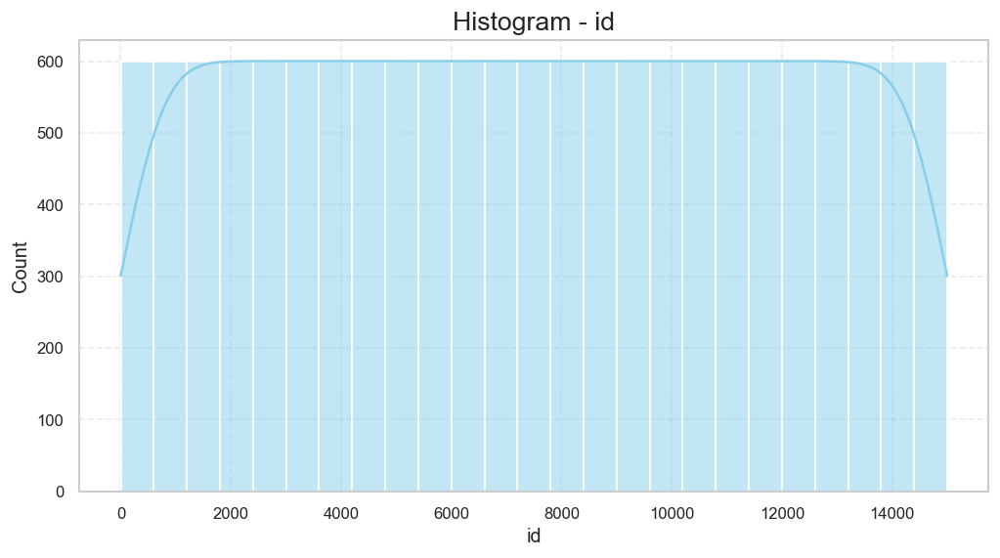


------------------------------------------------------------
INSIGHTS FOR ID
------------------------------------------------------------
Average Value : 7500.5
Median Value : 7500.5
Minimum Value : 1
Maximum Value : 15000
Standard Deviation : 4330.27
Skewness : 0.0
Kurtosis : -1.2
Reading : Distribution appears balanced.


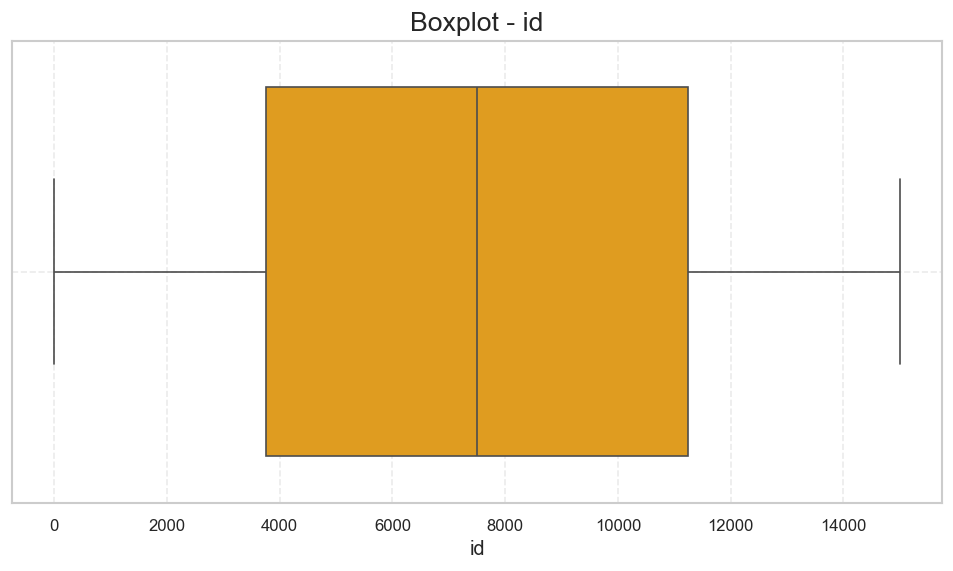

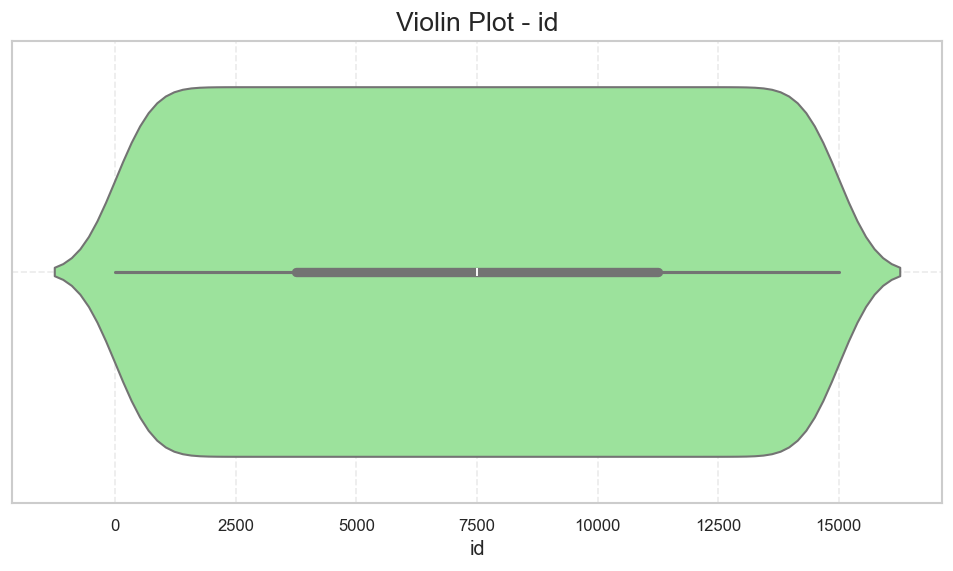

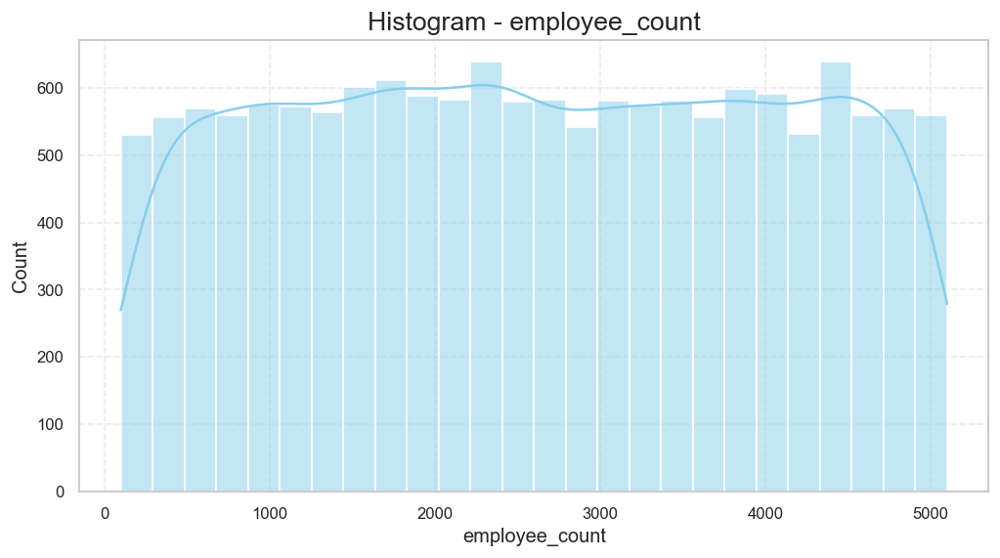


------------------------------------------------------------
INSIGHTS FOR EMPLOYEE_COUNT
------------------------------------------------------------
Average Value : 2606.86
Median Value : 2587.0
Minimum Value : 100
Maximum Value : 5099
Standard Deviation : 1430.56
Skewness : 0.0
Kurtosis : -1.19
Reading : Distribution is positively skewed.


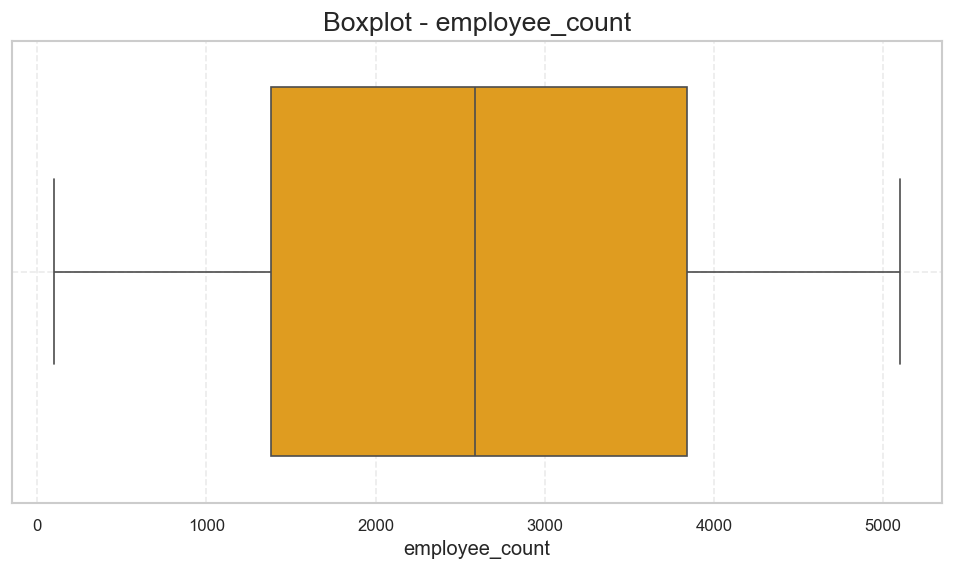

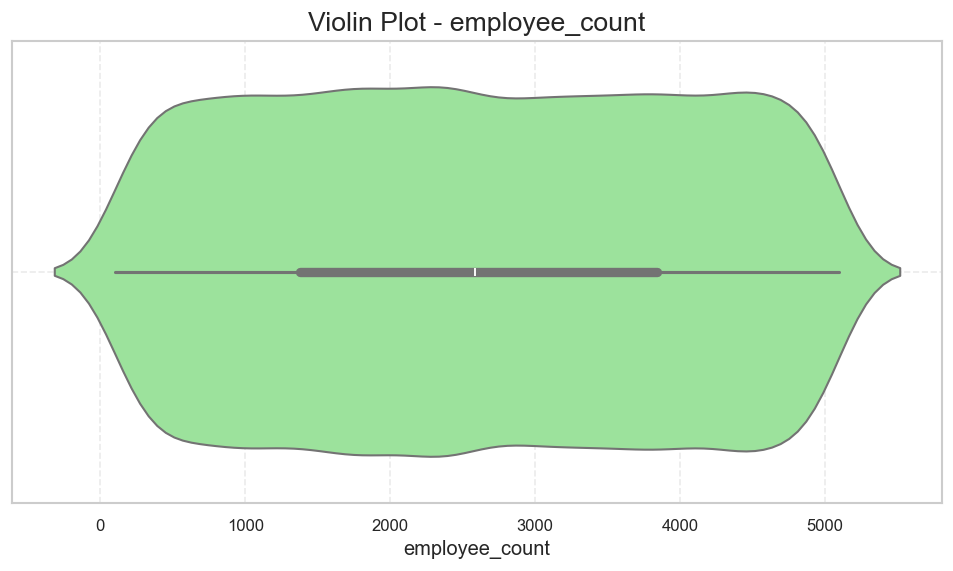

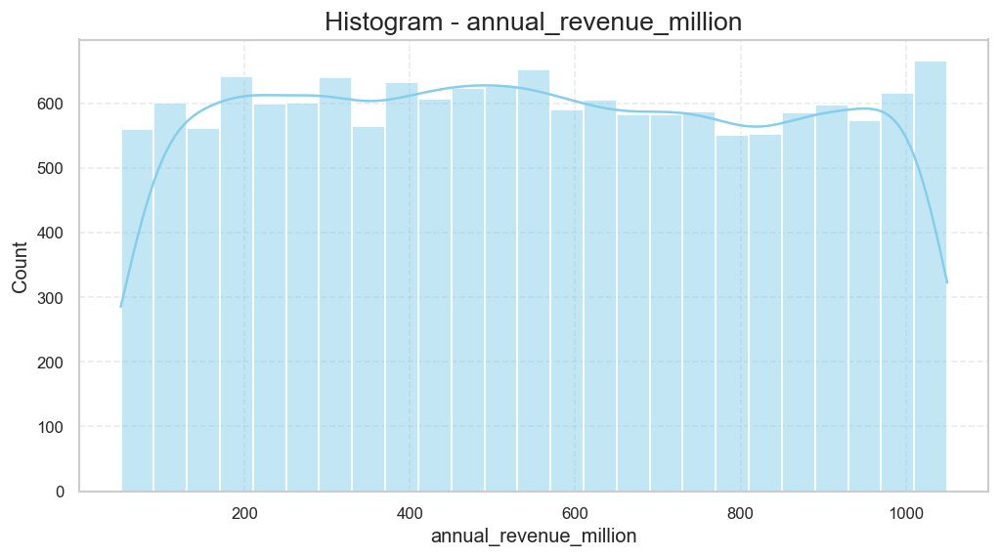


------------------------------------------------------------
INSIGHTS FOR ANNUAL_REVENUE_MILLION
------------------------------------------------------------
Average Value : 549.73
Median Value : 543.92
Minimum Value : 50.16
Maximum Value : 1049.96
Standard Deviation : 288.24
Skewness : 0.03
Kurtosis : -1.19
Reading : Distribution is positively skewed.


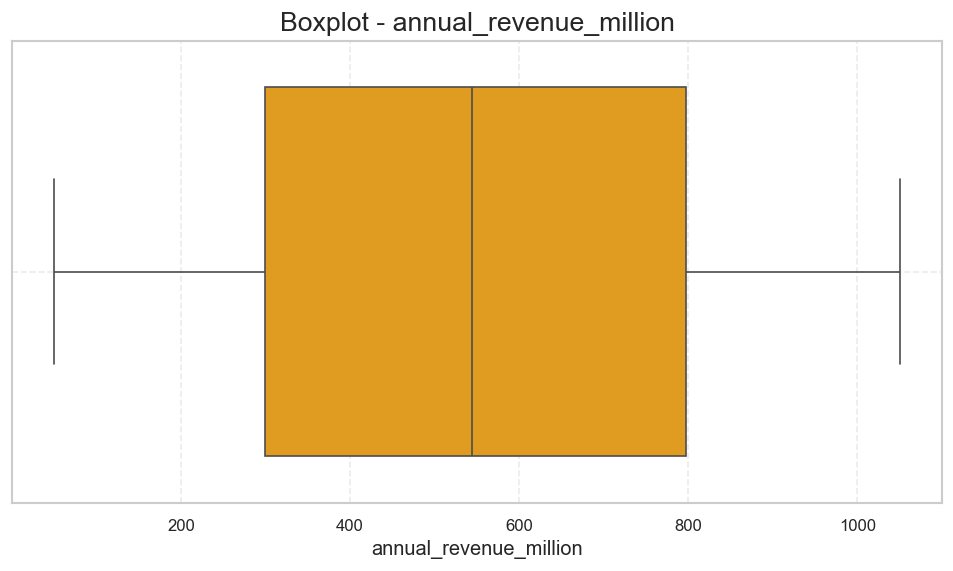

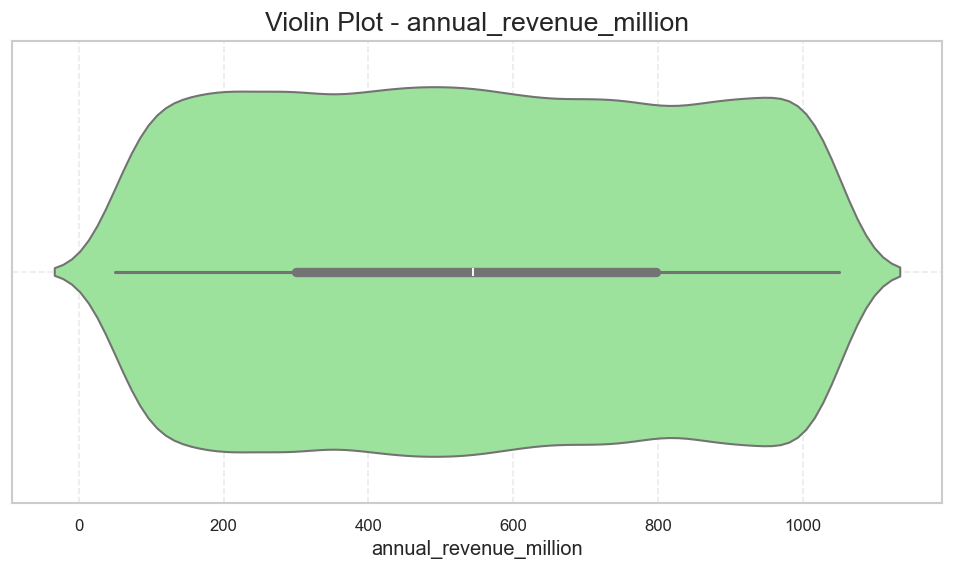

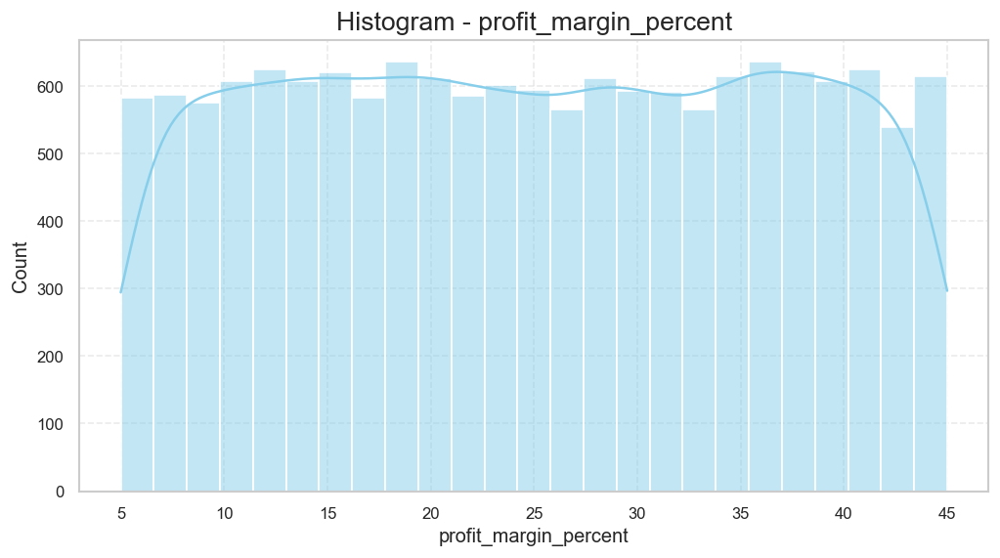


------------------------------------------------------------
INSIGHTS FOR PROFIT_MARGIN_PERCENT
------------------------------------------------------------
Average Value : 25.01
Median Value : 24.91
Minimum Value : 5.0
Maximum Value : 45.0
Standard Deviation : 11.53
Skewness : 0.0
Kurtosis : -1.2
Reading : Distribution is positively skewed.


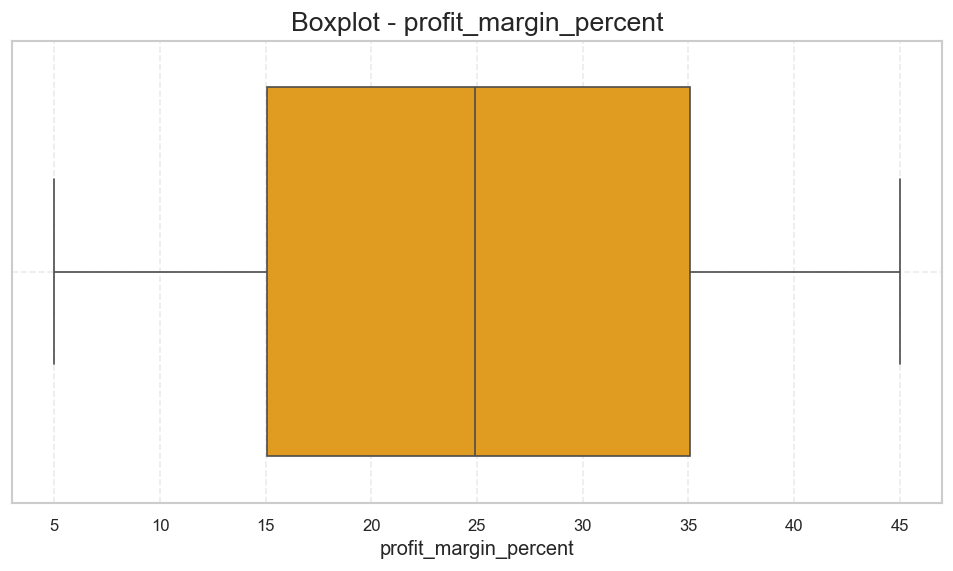

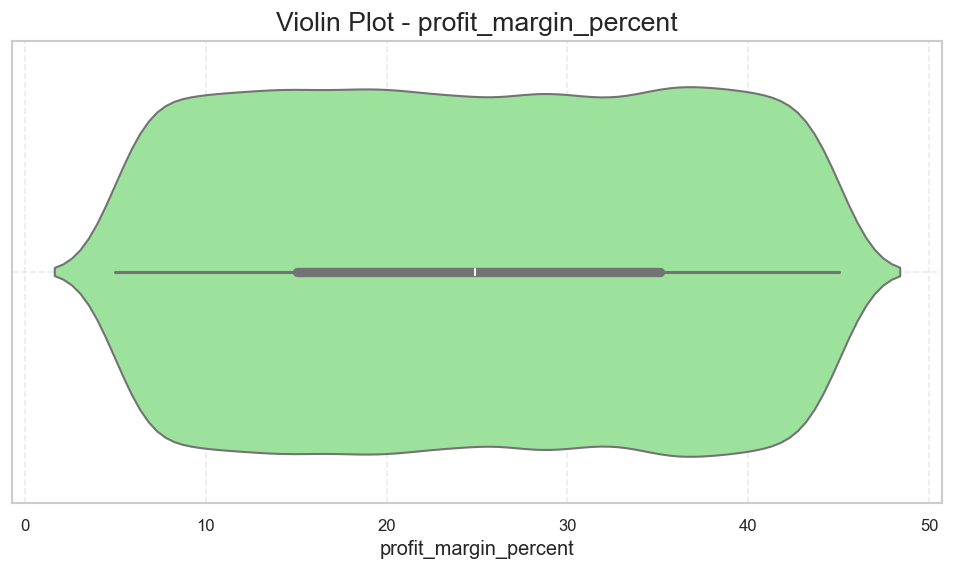

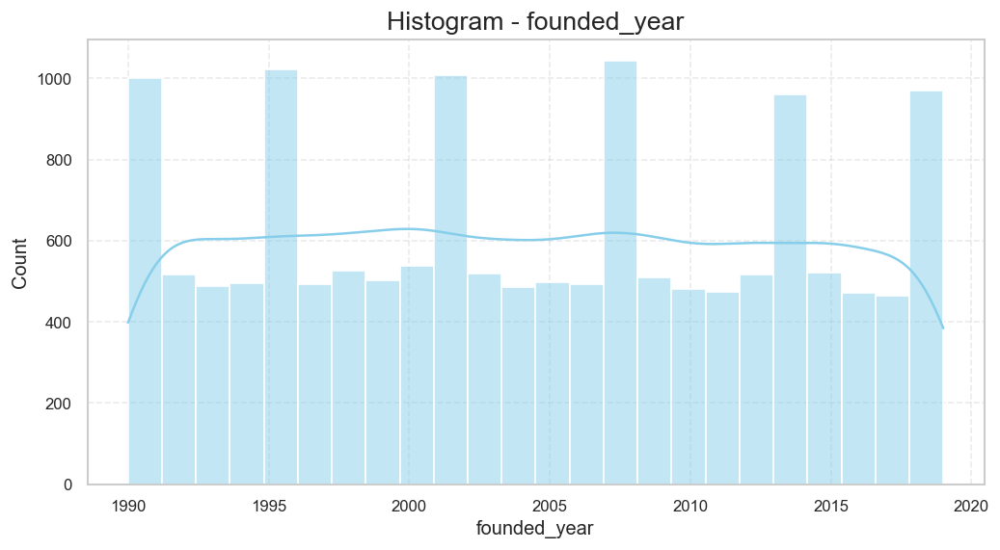


------------------------------------------------------------
INSIGHTS FOR FOUNDED_YEAR
------------------------------------------------------------
Average Value : 2004.37
Median Value : 2004.0
Minimum Value : 1990
Maximum Value : 2019
Standard Deviation : 8.61
Skewness : 0.02
Kurtosis : -1.19
Reading : Distribution is positively skewed.


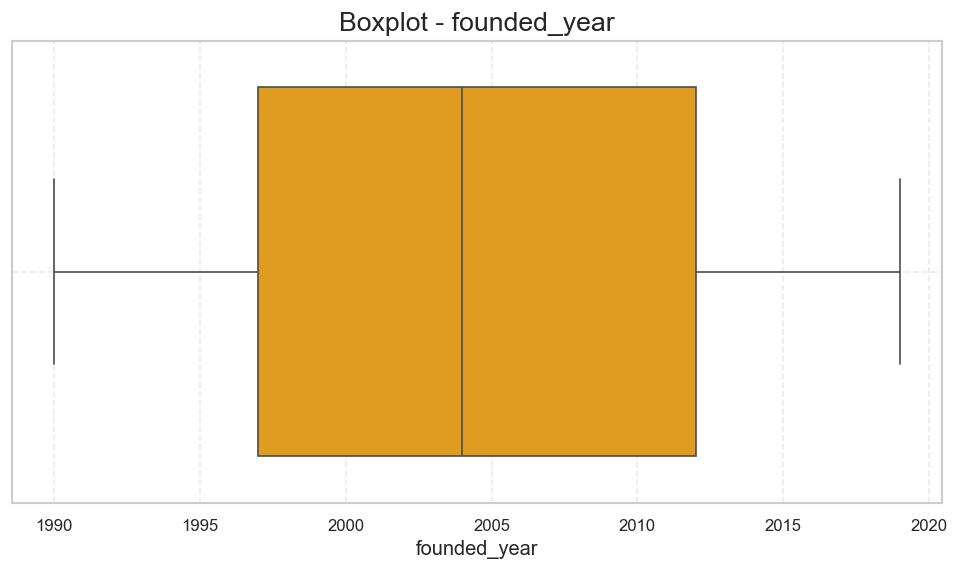

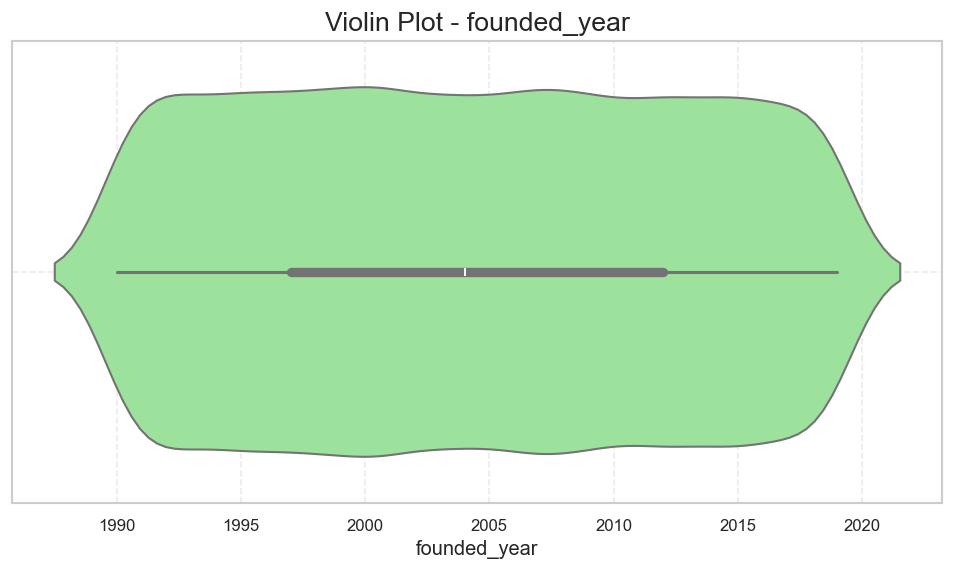

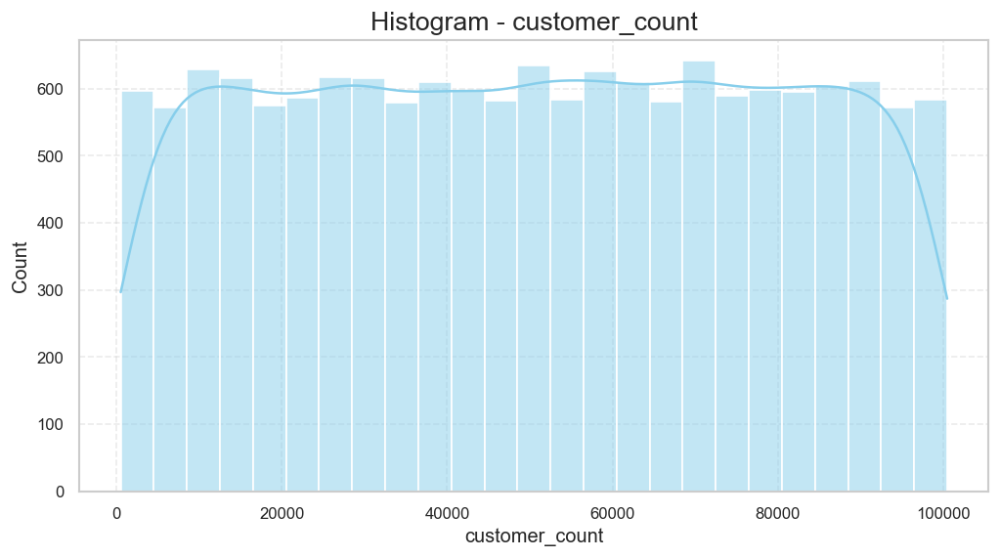


------------------------------------------------------------
INSIGHTS FOR CUSTOMER_COUNT
------------------------------------------------------------
Average Value : 50449.25
Median Value : 50726.5
Minimum Value : 500
Maximum Value : 100495
Standard Deviation : 28744.64
Skewness : -0.0
Kurtosis : -1.19
Reading : Distribution is negatively skewed.


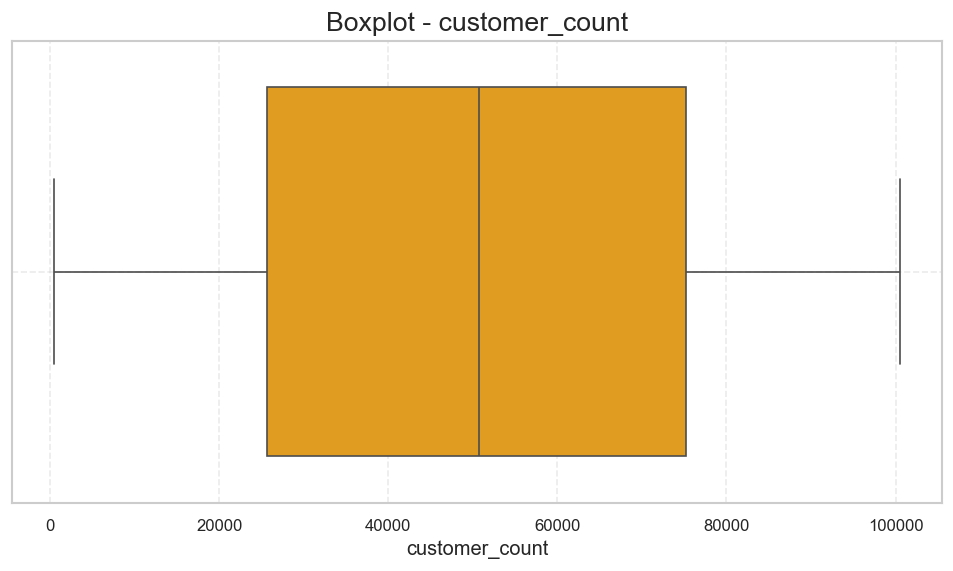

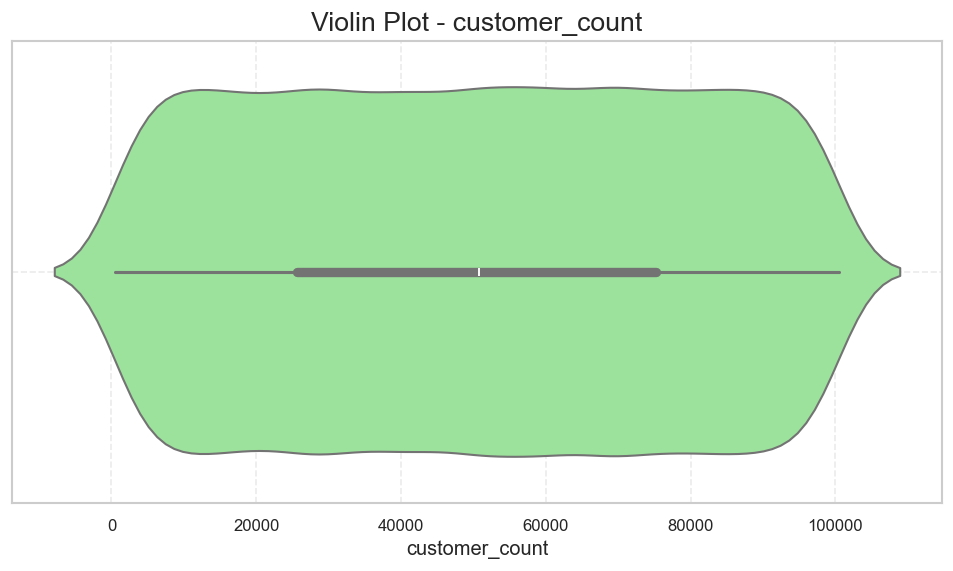

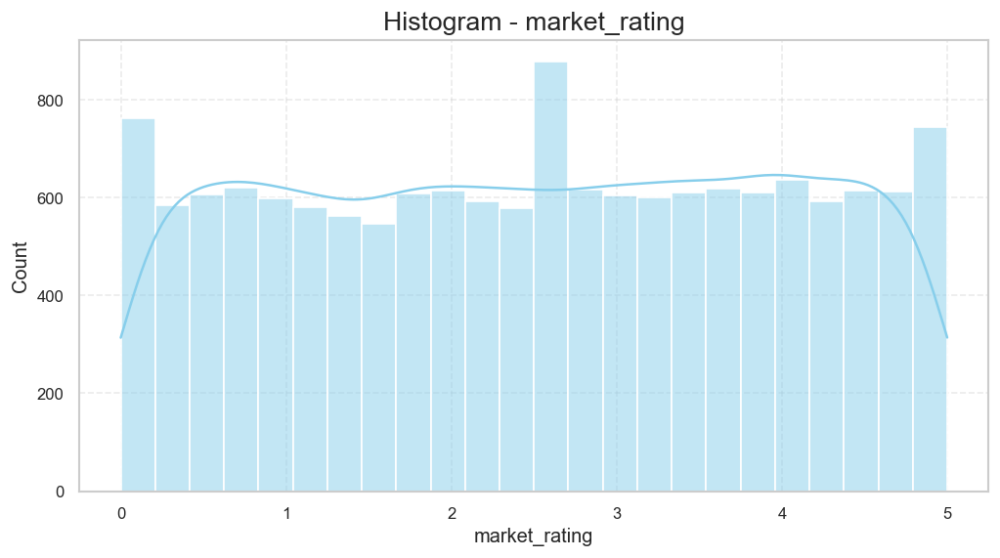


------------------------------------------------------------
INSIGHTS FOR MARKET_RATING
------------------------------------------------------------
Average Value : 2.51
Median Value : 2.5
Minimum Value : 0.0
Maximum Value : 5.0
Standard Deviation : 1.45
Skewness : -0.02
Kurtosis : -1.21
Reading : Distribution is positively skewed.


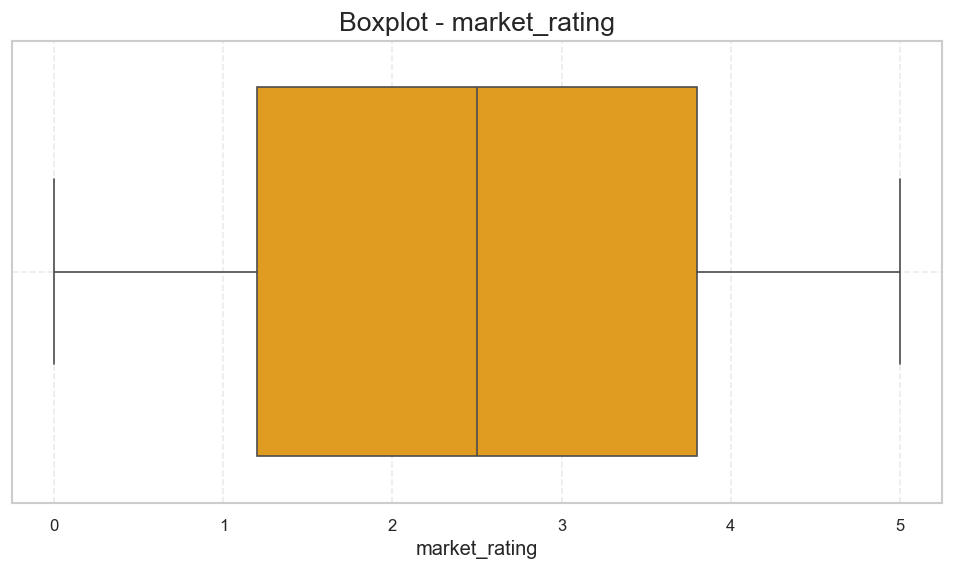

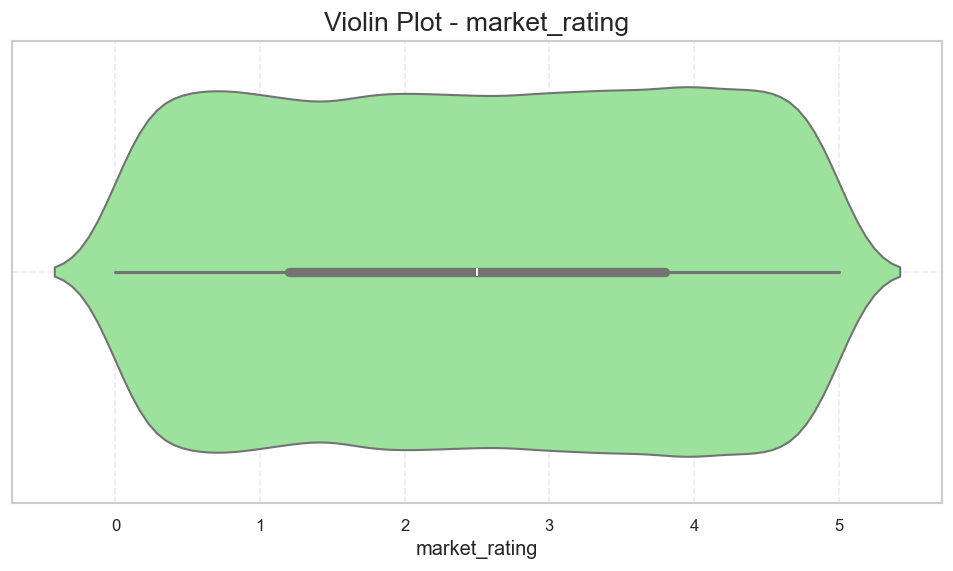

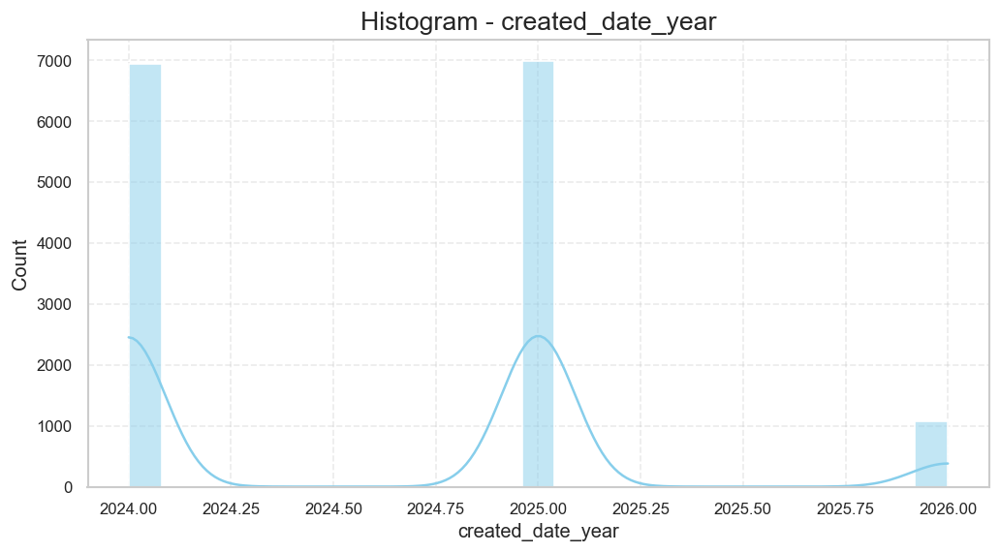


------------------------------------------------------------
INSIGHTS FOR CREATED_DATE_YEAR
------------------------------------------------------------
Average Value : 2024.61
Median Value : 2025.0
Minimum Value : 2024
Maximum Value : 2026
Standard Deviation : 0.62
Skewness : 0.49
Kurtosis : -0.64
Reading : Distribution is negatively skewed.


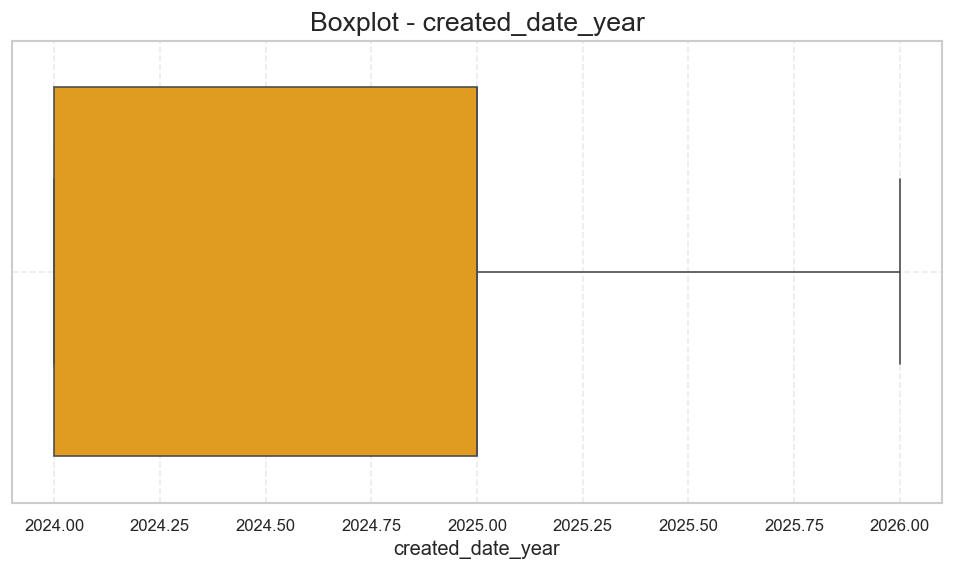

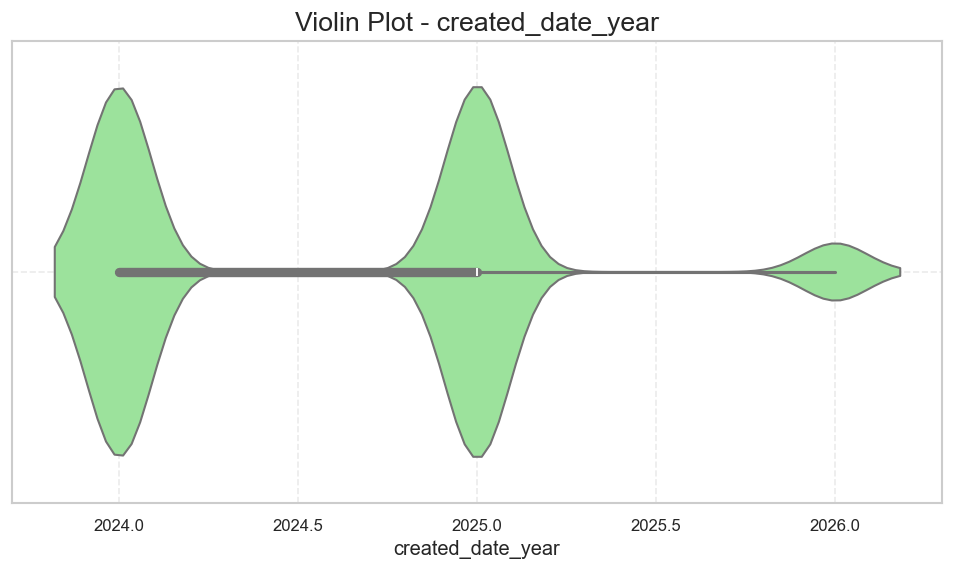

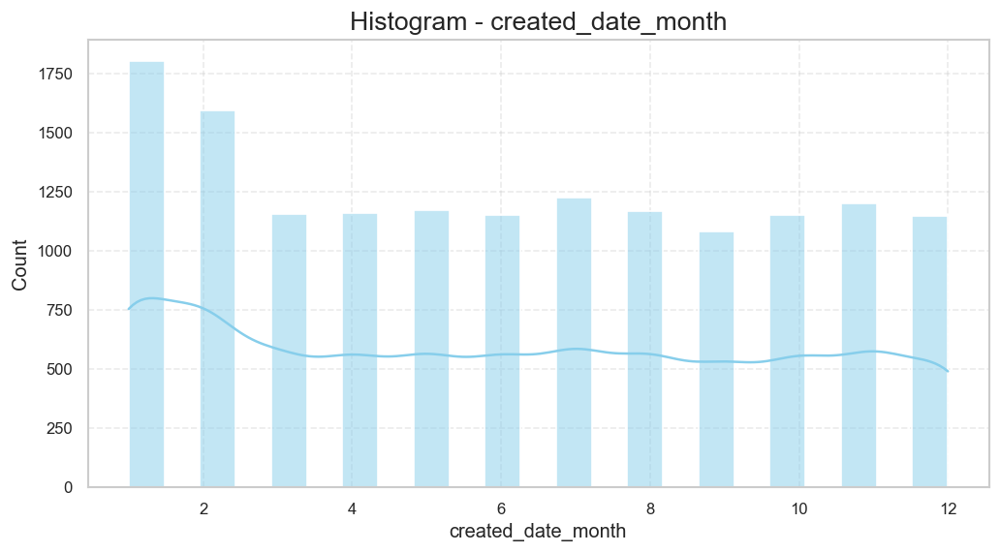


------------------------------------------------------------
INSIGHTS FOR CREATED_DATE_MONTH
------------------------------------------------------------
Average Value : 6.13
Median Value : 6.0
Minimum Value : 1
Maximum Value : 12
Standard Deviation : 3.58
Skewness : 0.1
Kurtosis : -1.28
Reading : Distribution is positively skewed.


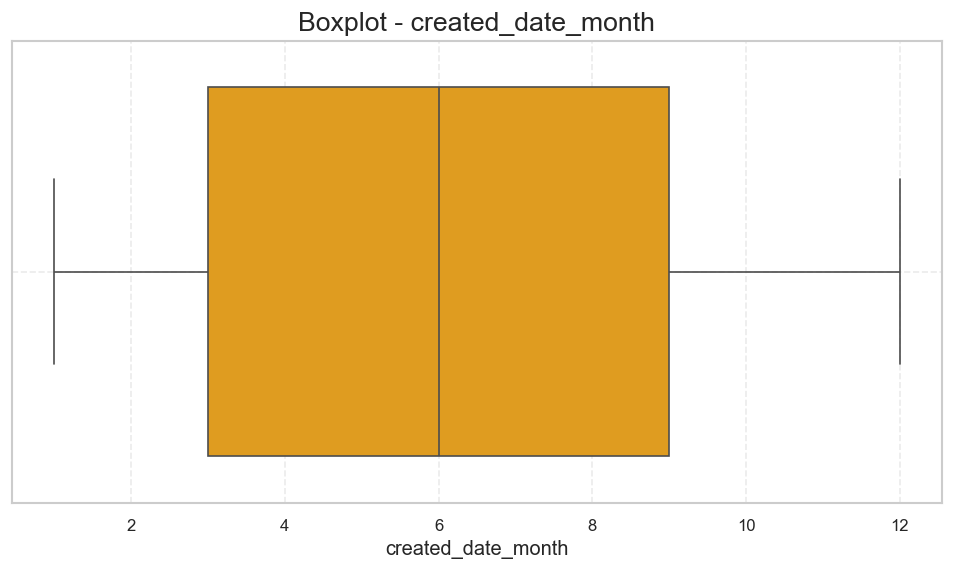

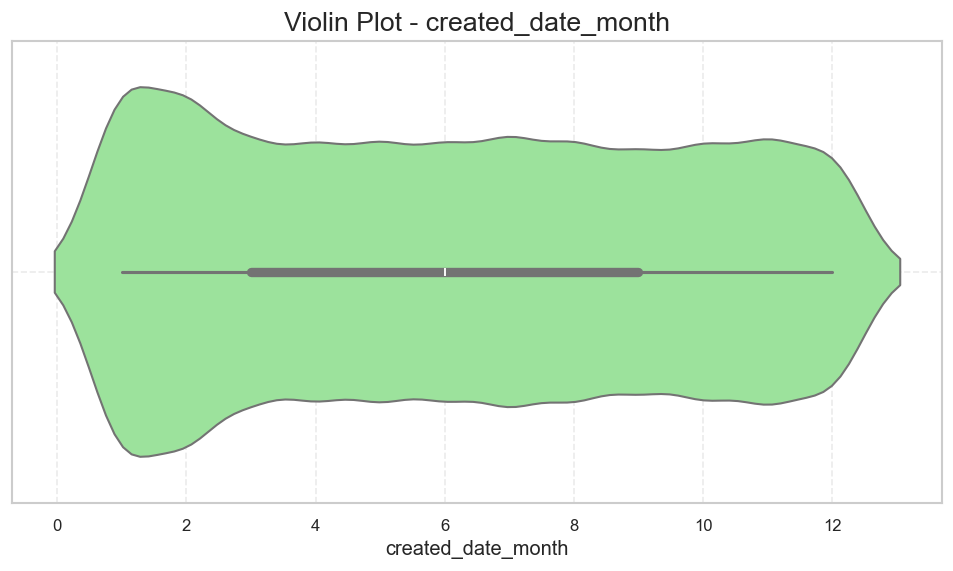

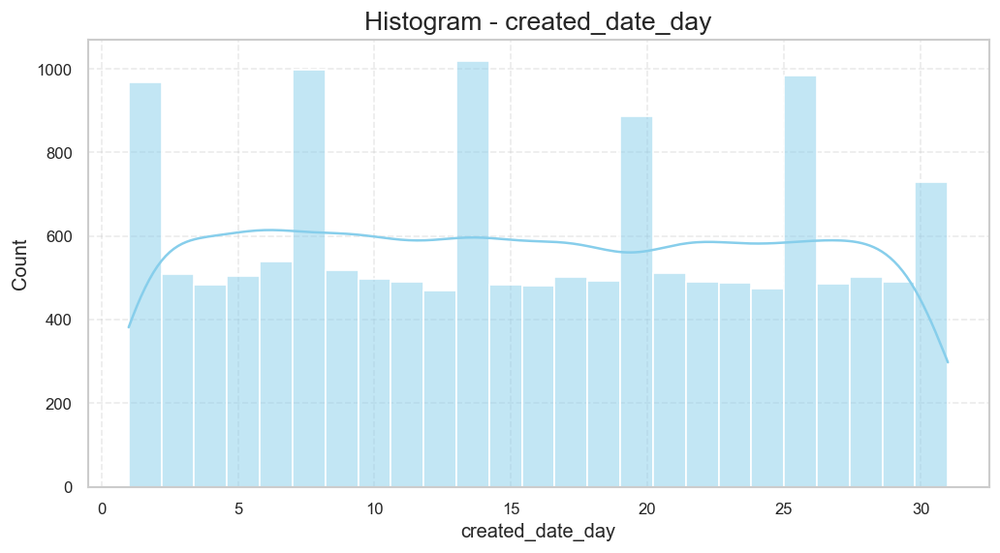


------------------------------------------------------------
INSIGHTS FOR CREATED_DATE_DAY
------------------------------------------------------------
Average Value : 15.67
Median Value : 16.0
Minimum Value : 1
Maximum Value : 31
Standard Deviation : 8.82
Skewness : 0.03
Kurtosis : -1.21
Reading : Distribution is negatively skewed.


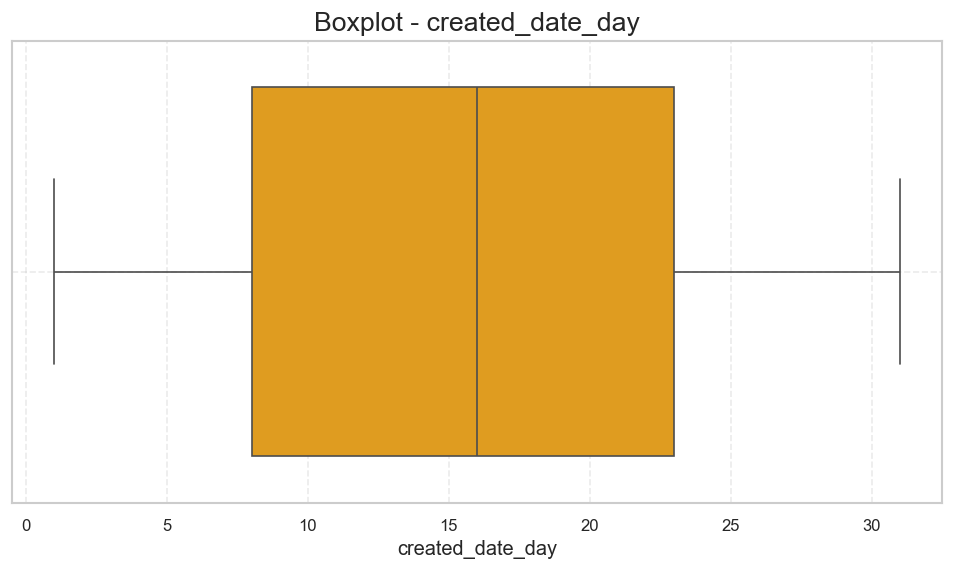

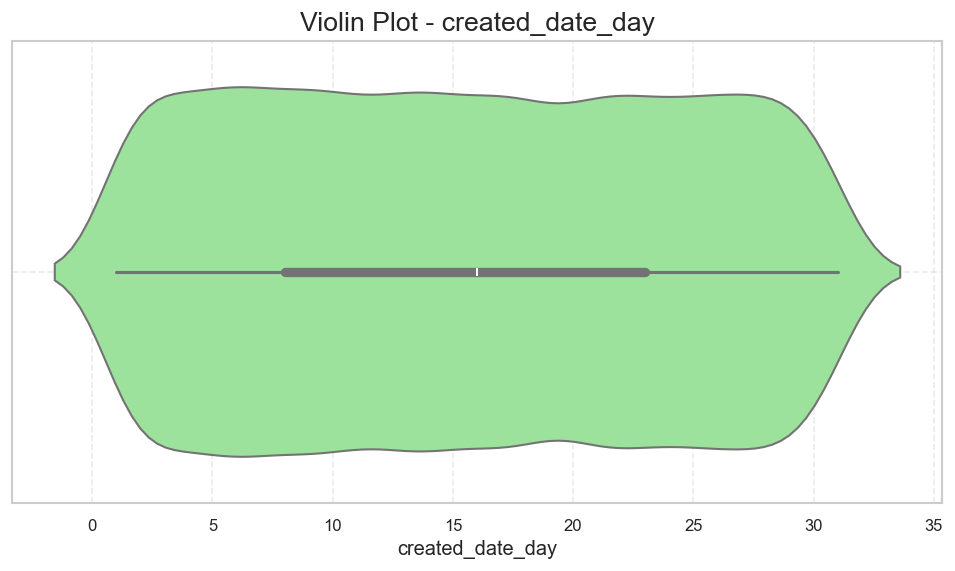

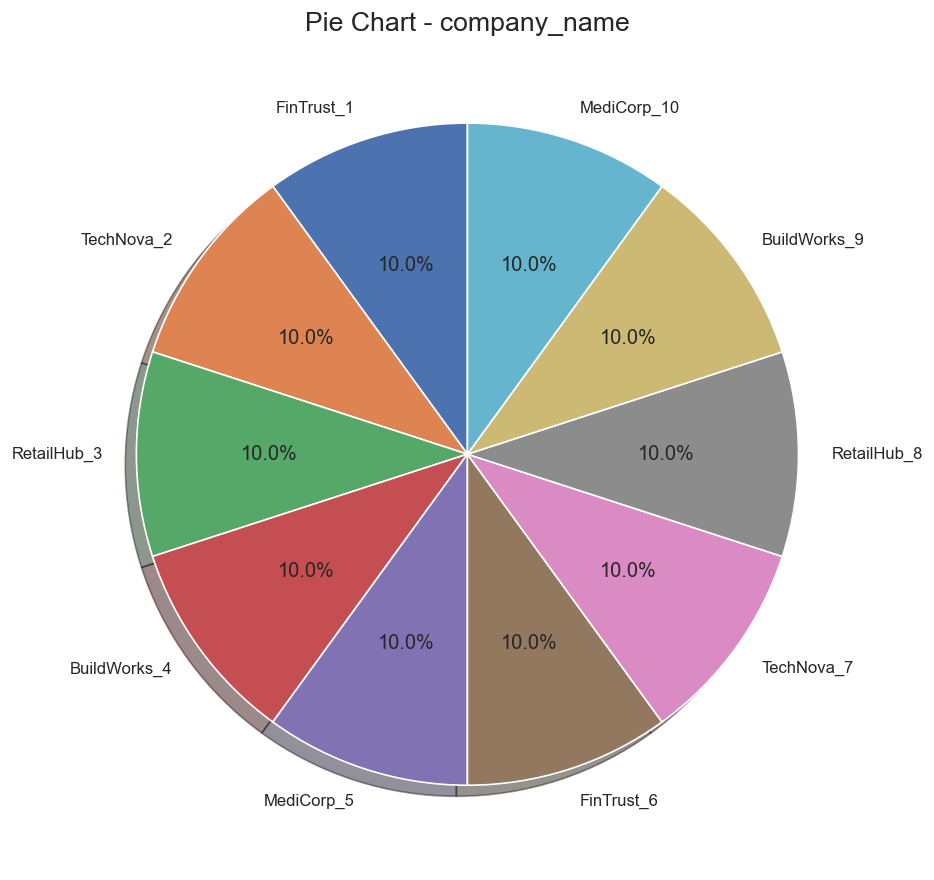

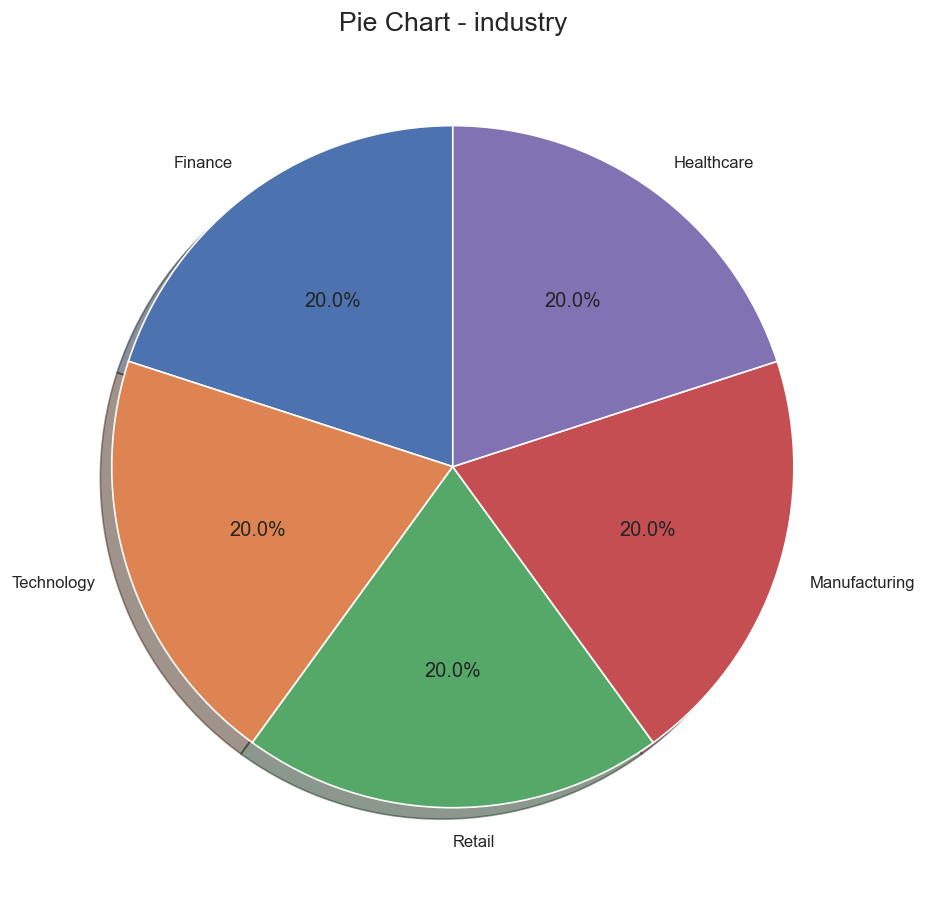

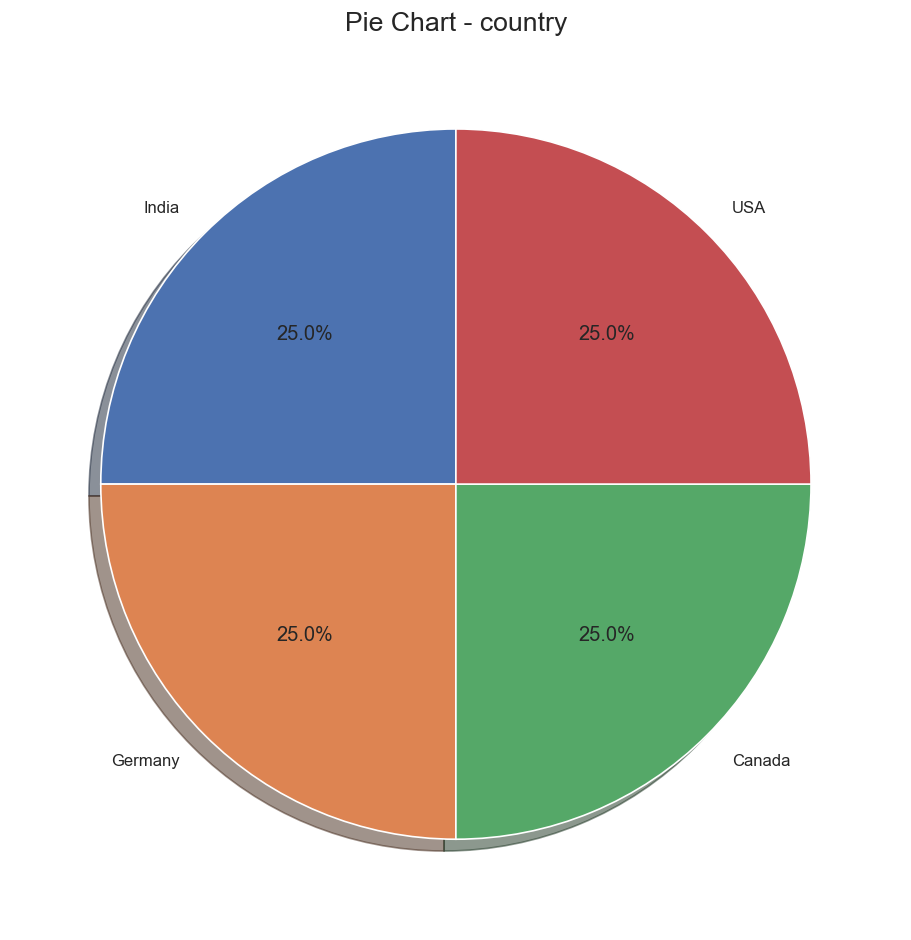

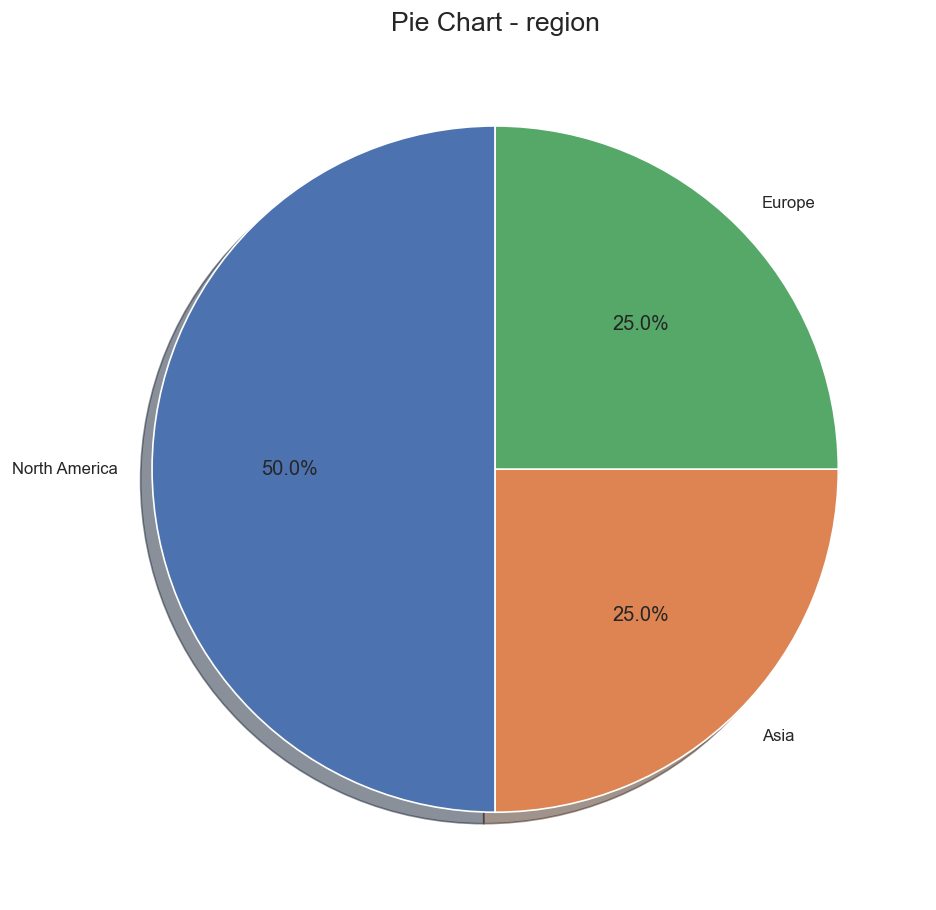

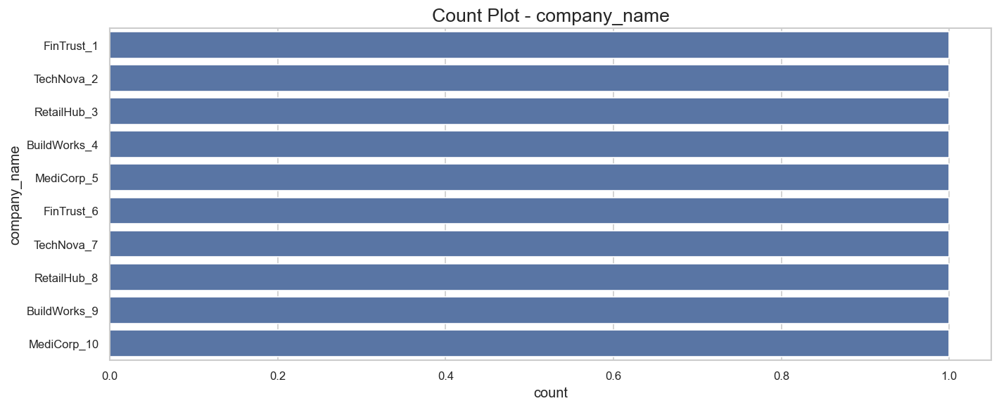

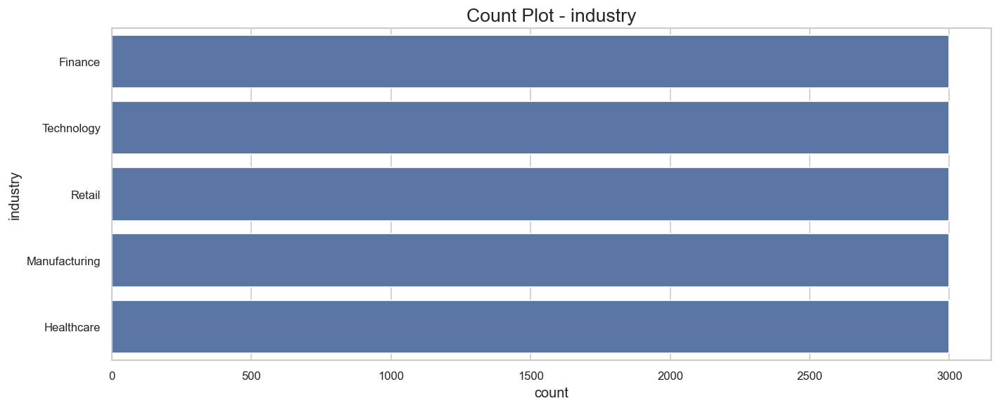

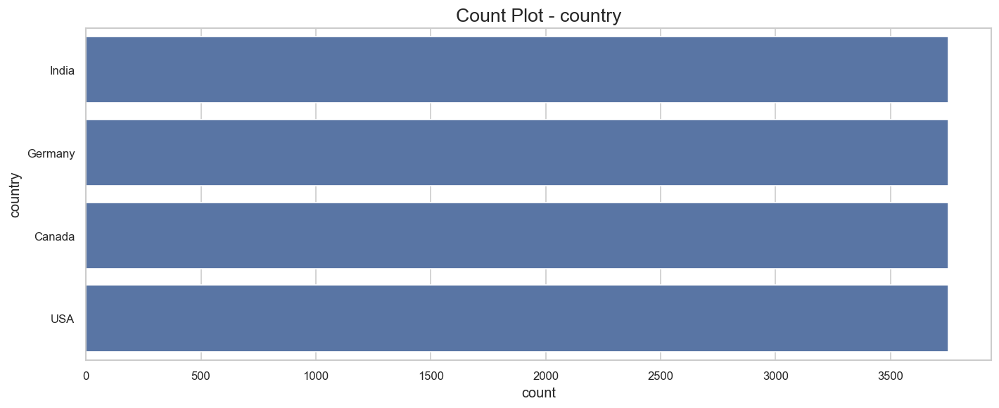

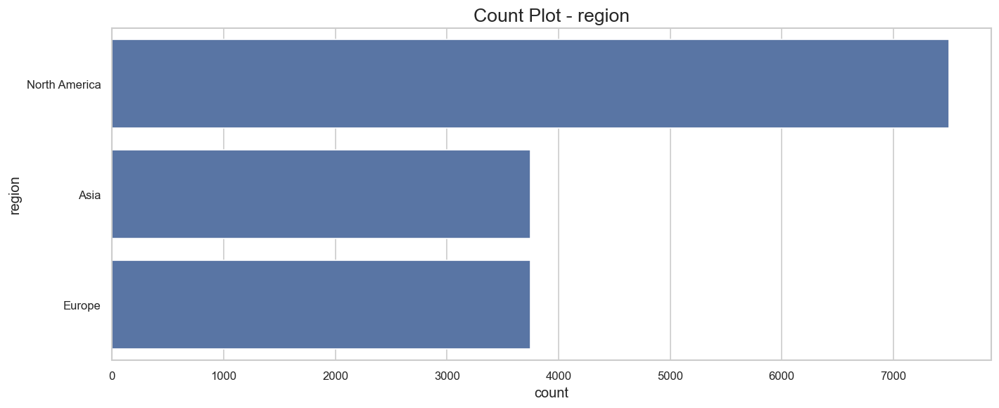


CORRELATION ANALYSIS


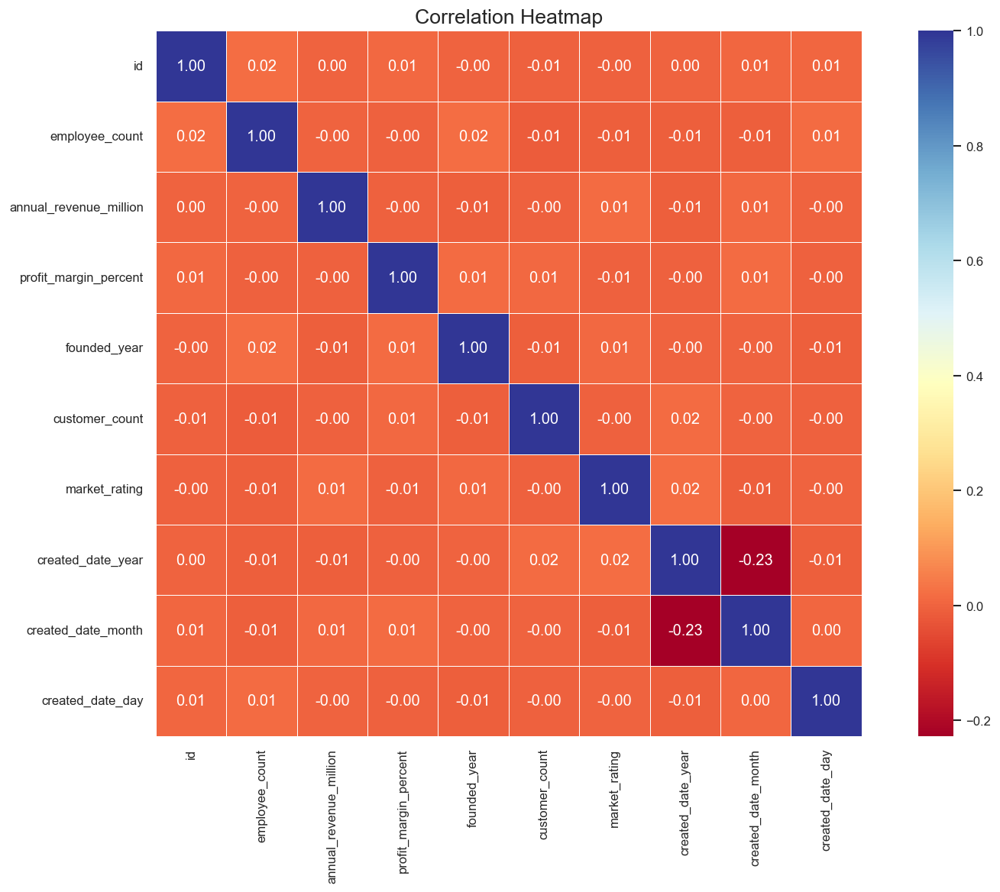


STRONGEST CORRELATIONS

created_date_year      created_date_month       -0.227704
employee_count         founded_year              0.021180
                       id                        0.018014
created_date_year      market_rating             0.017246
customer_count         created_date_year         0.015996
market_rating          annual_revenue_million    0.014639
profit_margin_percent  created_date_month        0.013272
employee_count         created_date_day          0.012483
customer_count         employee_count           -0.012431
profit_margin_percent  founded_year              0.012379
dtype: float64


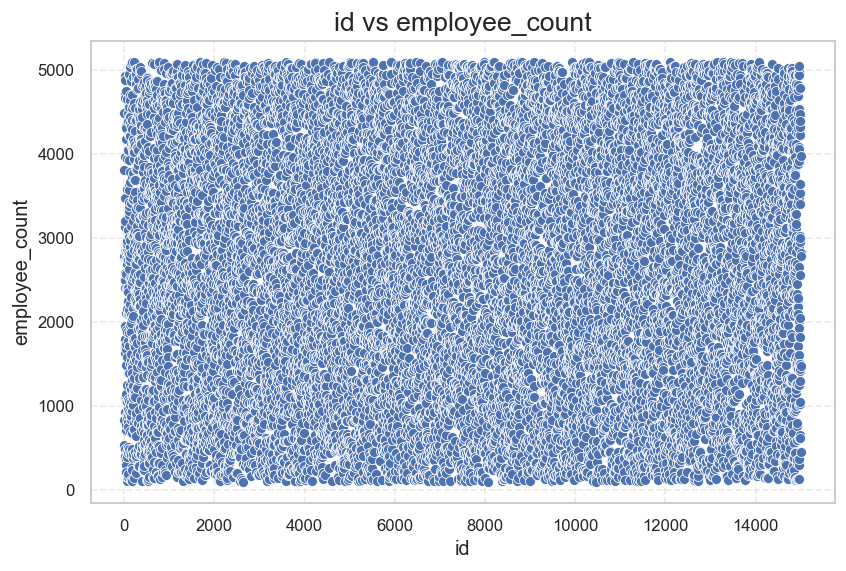

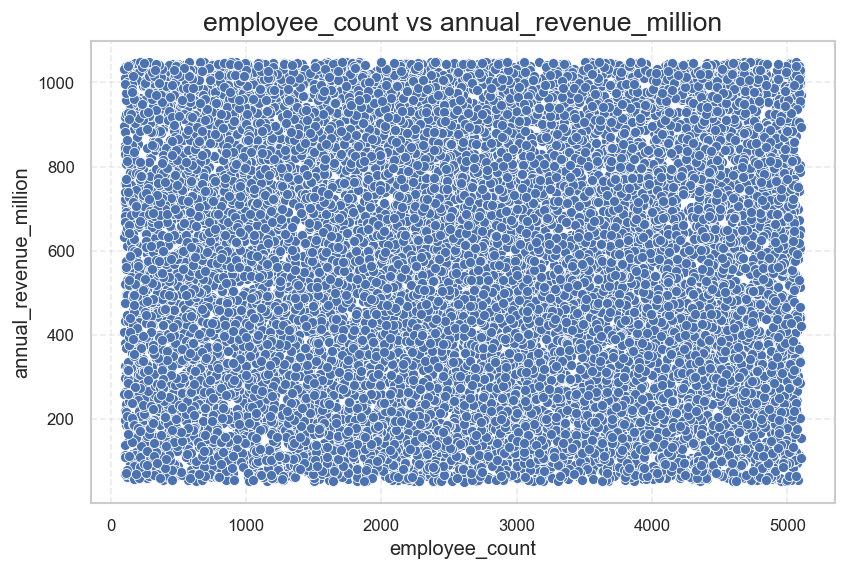

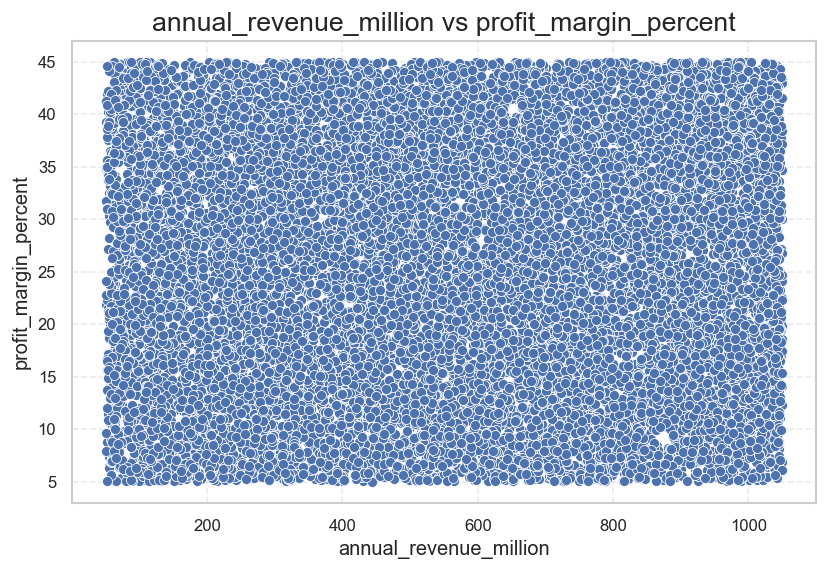

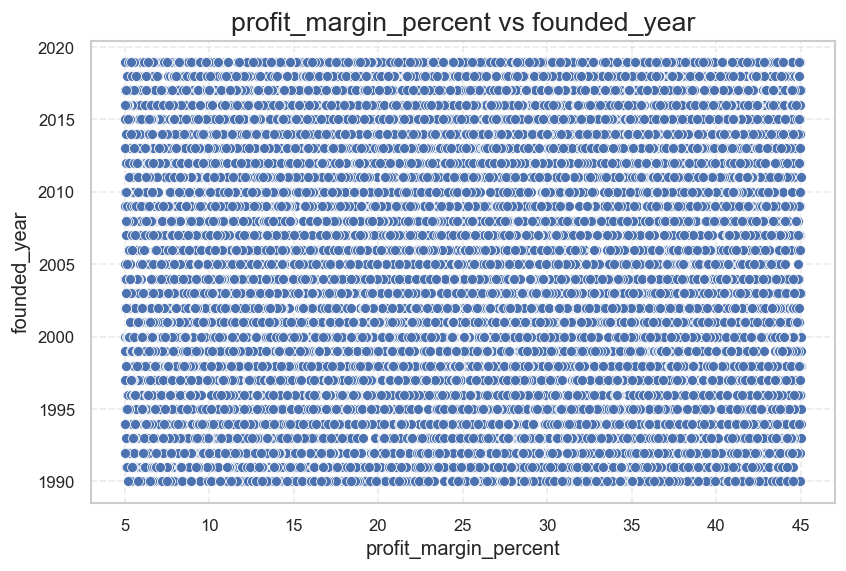

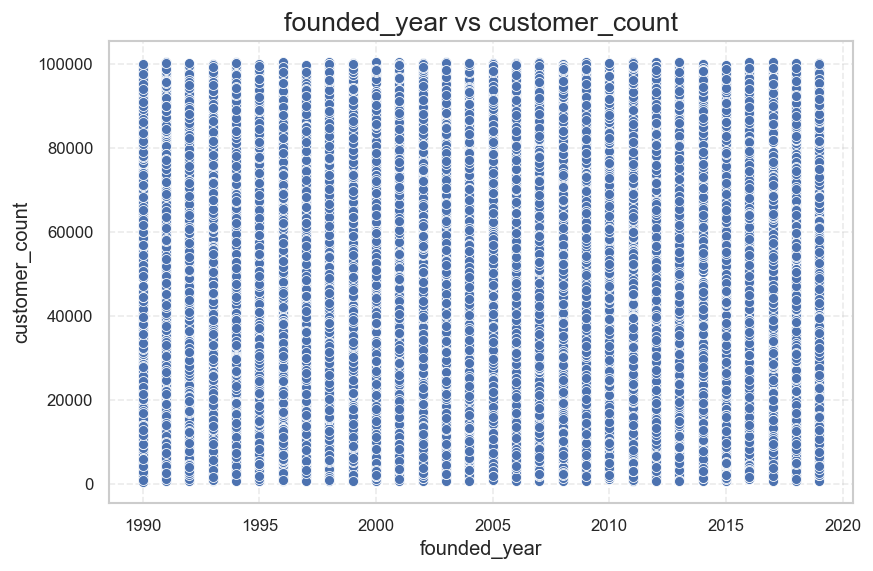

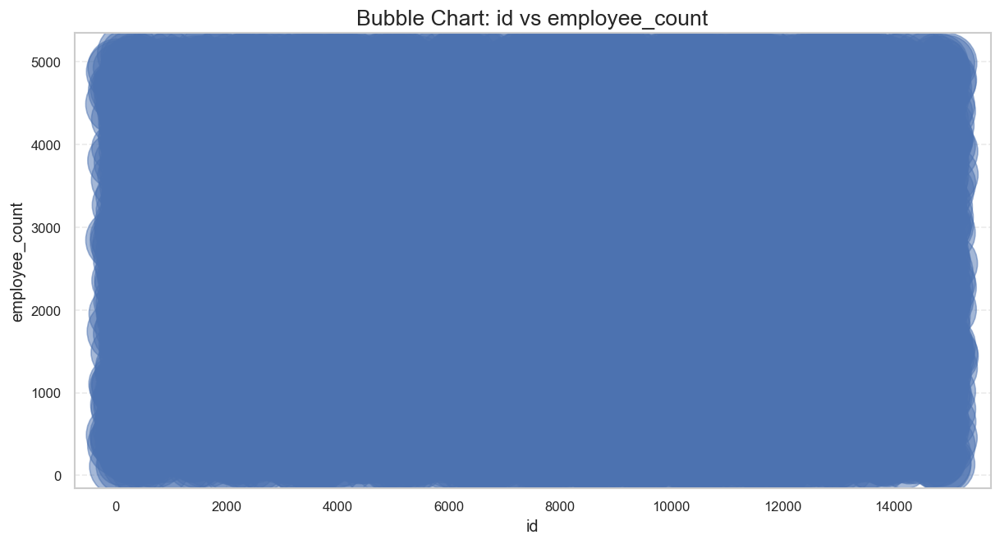

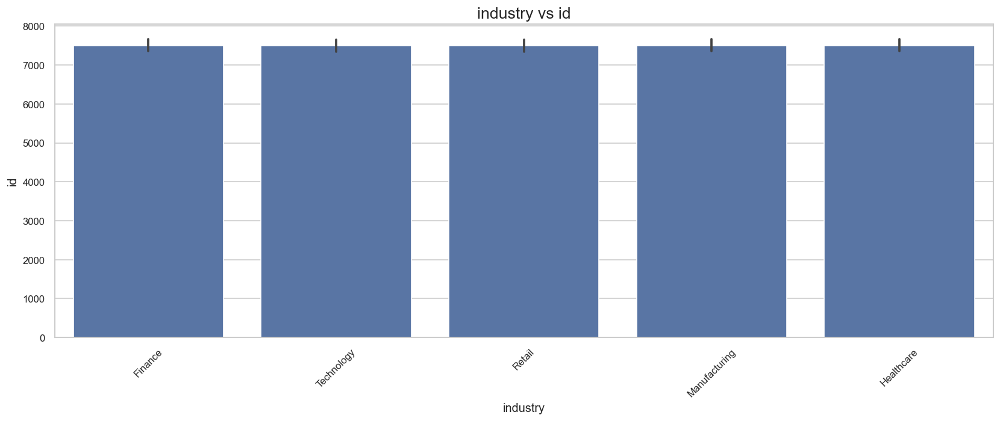


TOP industry BASED ON id

industry
Healthcare       7502.5
Manufacturing    7501.5
Retail           7500.5
Technology       7499.5
Finance          7498.5
Name: id, dtype: float64


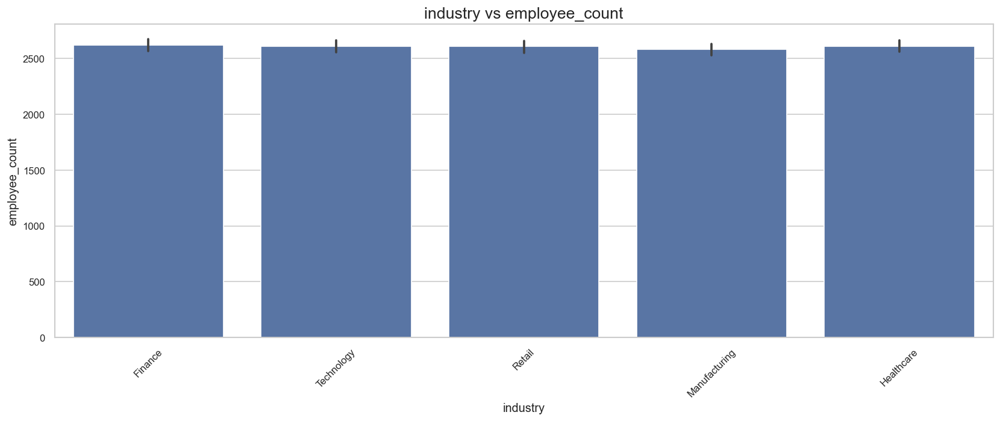


TOP industry BASED ON employee_count

industry
Finance          2621.878333
Healthcare       2610.893667
Technology       2610.892333
Retail           2608.425000
Manufacturing    2582.221000
Name: employee_count, dtype: float64


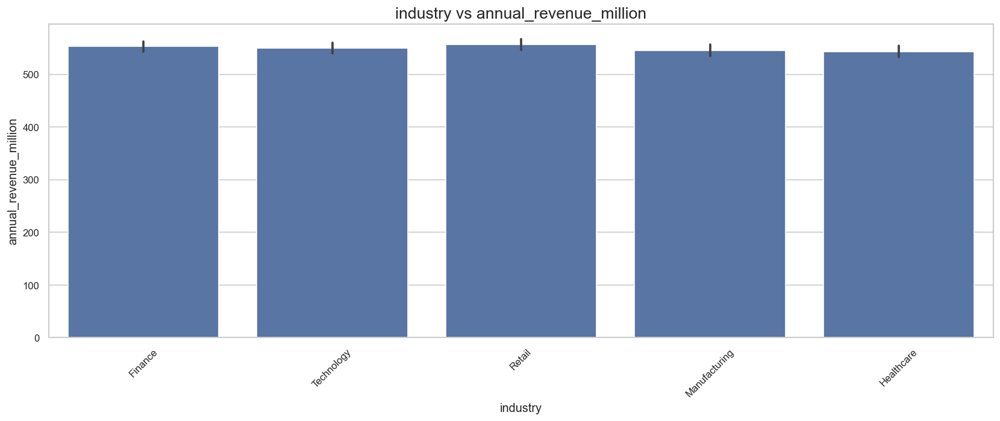


TOP industry BASED ON annual_revenue_million

industry
Retail           556.609343
Finance          552.823690
Technology       550.198027
Manufacturing    545.575197
Healthcare       543.457277
Name: annual_revenue_million, dtype: float64


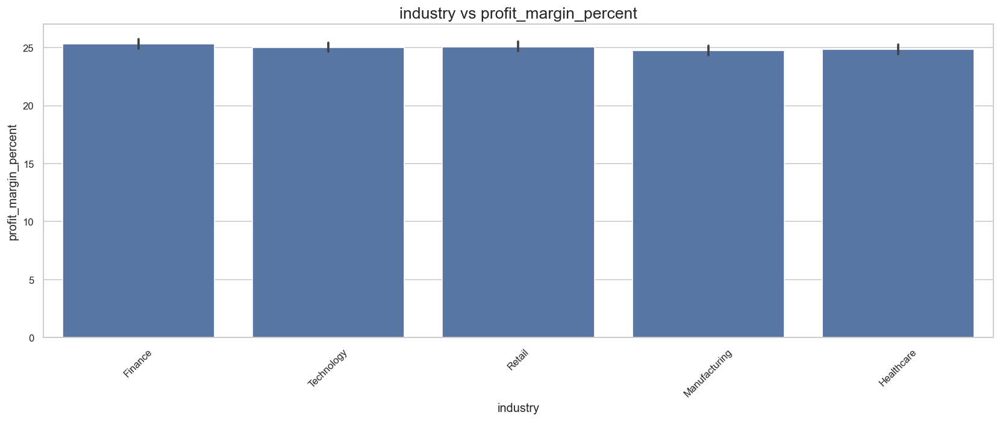


TOP industry BASED ON profit_margin_percent

industry
Finance          25.303310
Retail           25.085197
Technology       25.031367
Healthcare       24.878077
Manufacturing    24.762147
Name: profit_margin_percent, dtype: float64


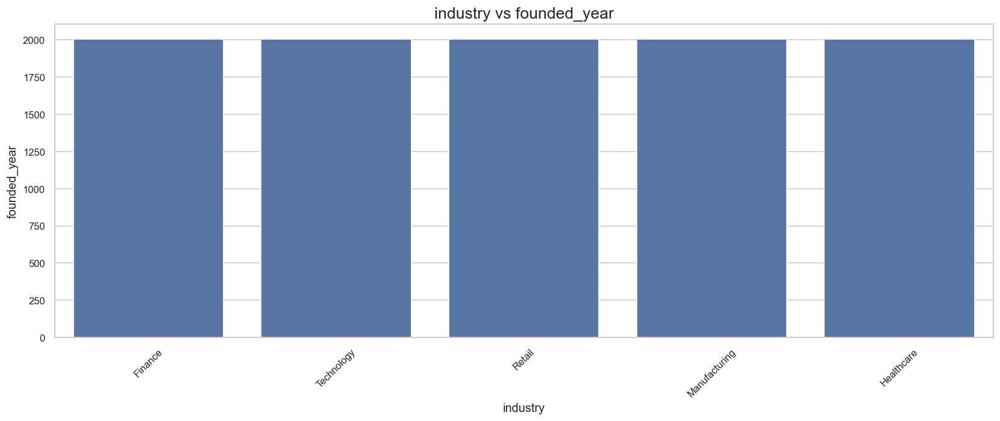


TOP industry BASED ON founded_year

industry
Technology       2004.521333
Retail           2004.462667
Healthcare       2004.335667
Manufacturing    2004.302667
Finance          2004.247667
Name: founded_year, dtype: float64


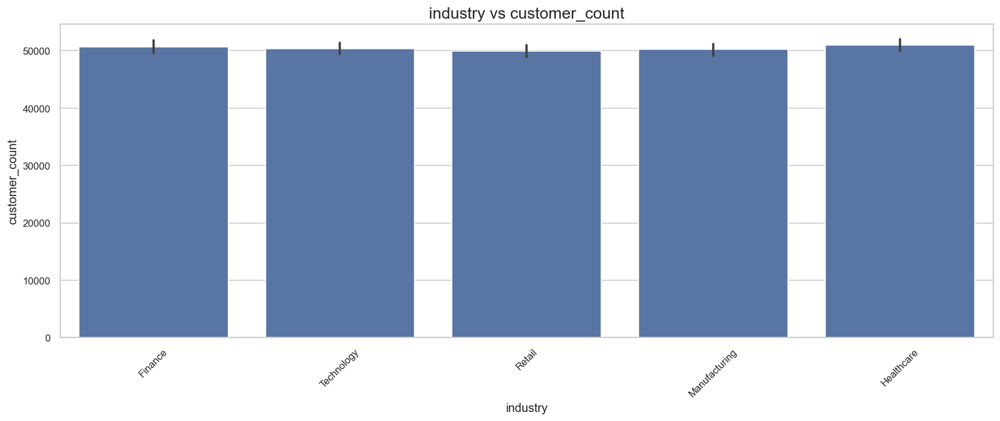


TOP industry BASED ON customer_count

industry
Healthcare       51025.384333
Finance          50665.919000
Technology       50355.641333
Manufacturing    50220.057333
Retail           49979.257333
Name: customer_count, dtype: float64


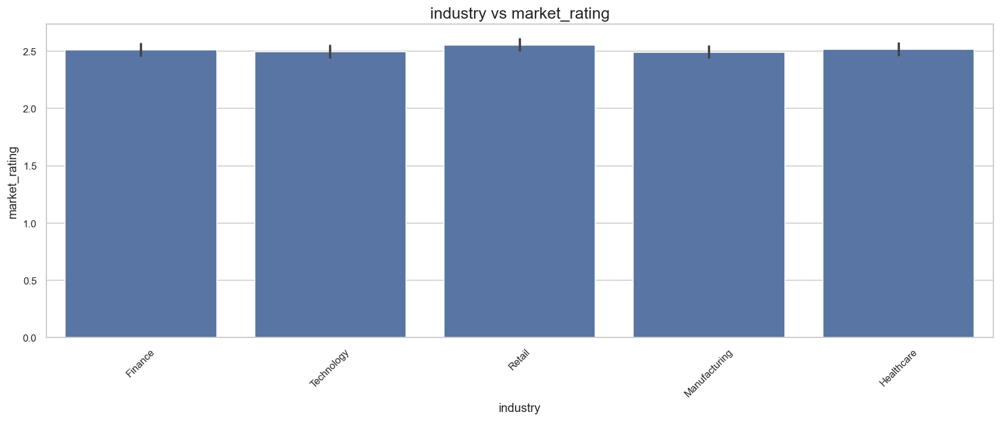


TOP industry BASED ON market_rating

industry
Retail           2.554533
Healthcare       2.515967
Finance          2.512100
Technology       2.495200
Manufacturing    2.491100
Name: market_rating, dtype: float64


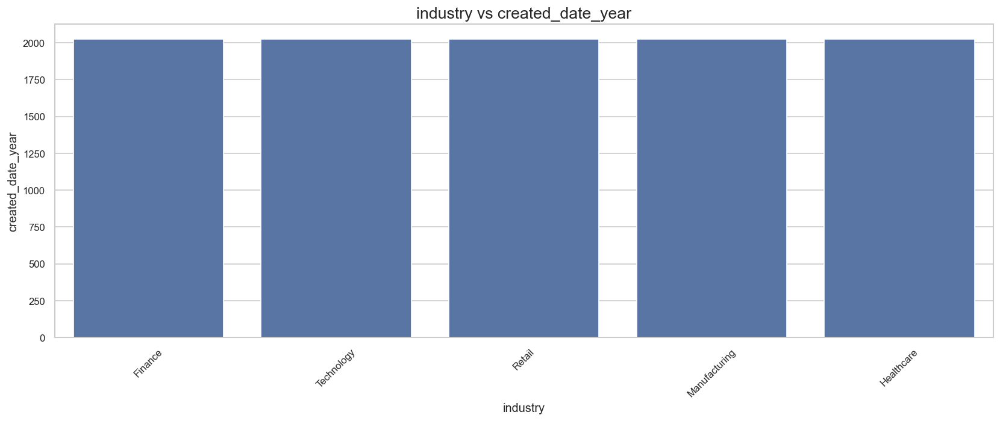


TOP industry BASED ON created_date_year

industry
Healthcare       2024.629333
Retail           2024.628333
Technology       2024.607333
Manufacturing    2024.601000
Finance          2024.582000
Name: created_date_year, dtype: float64


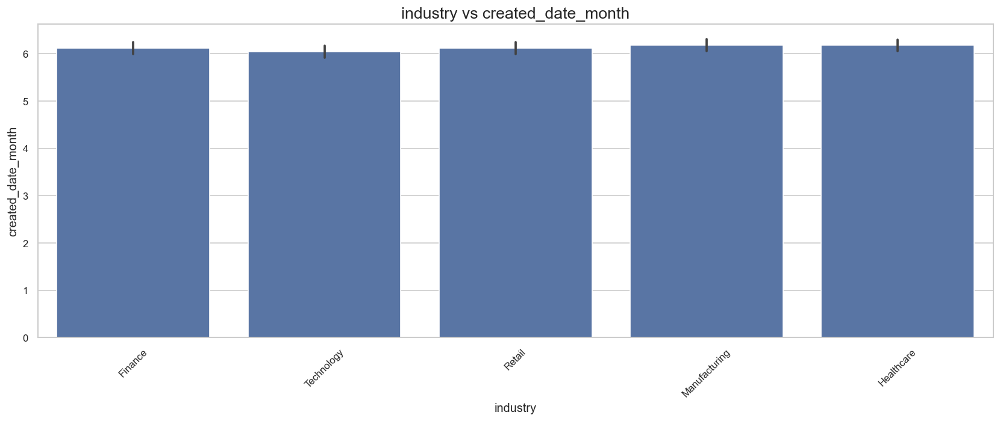


TOP industry BASED ON created_date_month

industry
Manufacturing    6.180333
Healthcare       6.178000
Finance          6.123000
Retail           6.120333
Technology       6.039667
Name: created_date_month, dtype: float64


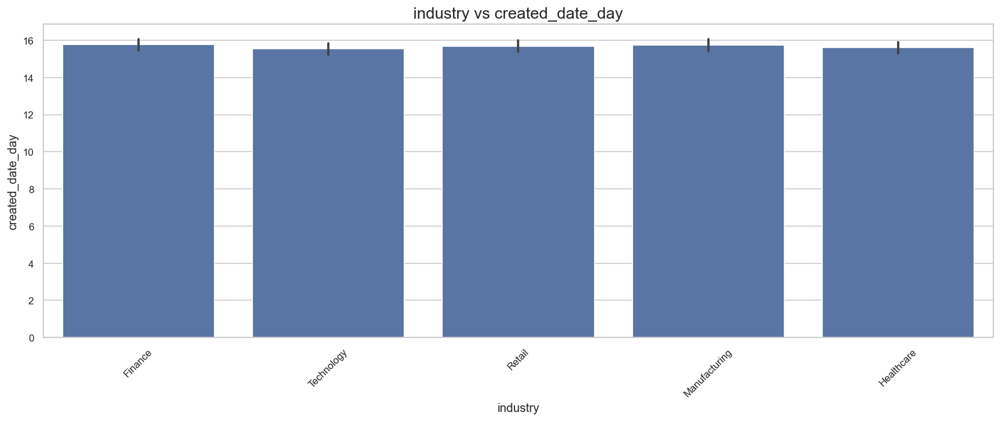


TOP industry BASED ON created_date_day

industry
Finance          15.772667
Manufacturing    15.735000
Retail           15.696667
Healthcare       15.615000
Technology       15.543333
Name: created_date_day, dtype: float64


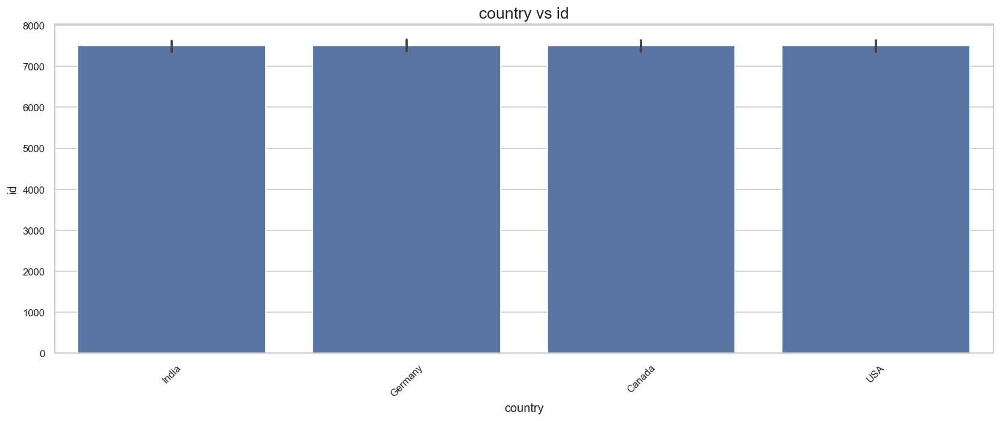


TOP country BASED ON id

country
USA        7502.0
Canada     7501.0
Germany    7500.0
India      7499.0
Name: id, dtype: float64


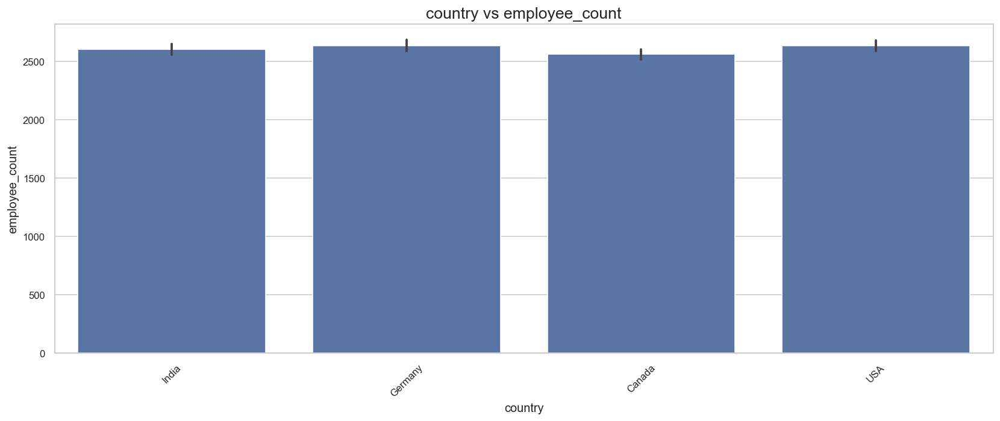


TOP country BASED ON employee_count

country
USA        2634.747733
Germany    2634.276533
India      2600.321333
Canada     2558.102667
Name: employee_count, dtype: float64


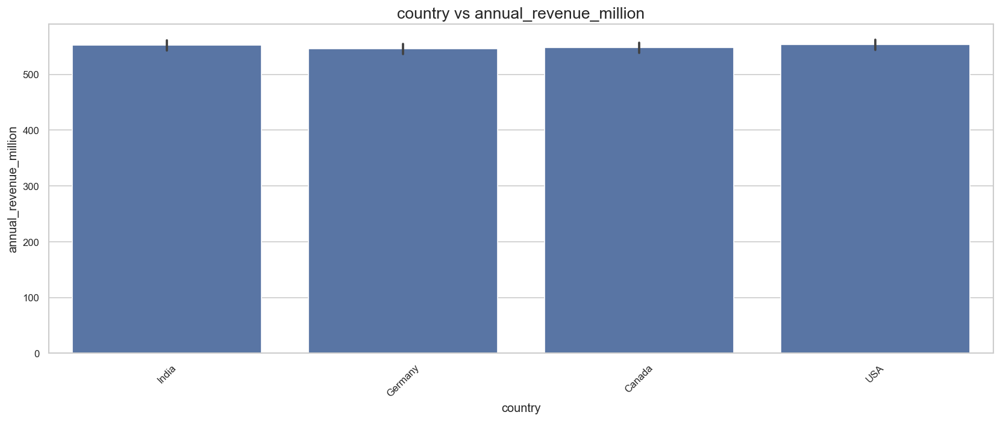


TOP country BASED ON annual_revenue_million

country
USA        552.907971
India      551.872211
Canada     548.375403
Germany    545.775243
Name: annual_revenue_million, dtype: float64


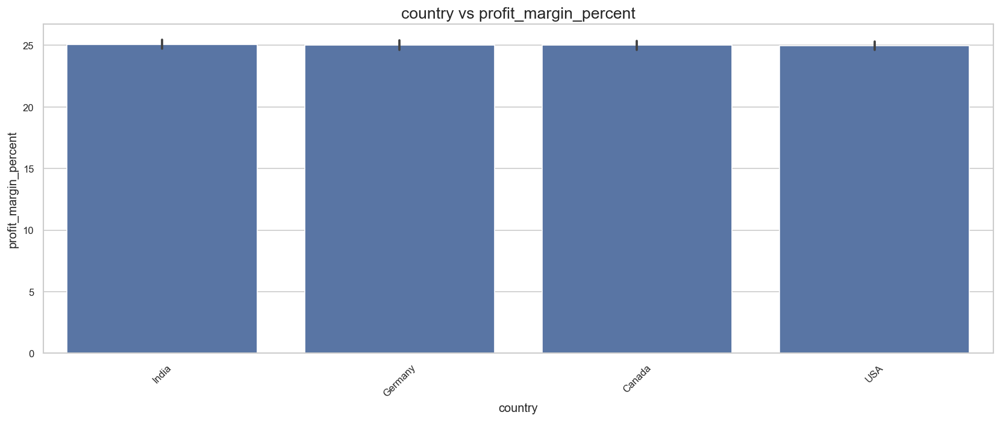


TOP country BASED ON profit_margin_percent

country
India      25.077557
Germany    25.018747
Canada     25.000403
USA        24.951371
Name: profit_margin_percent, dtype: float64


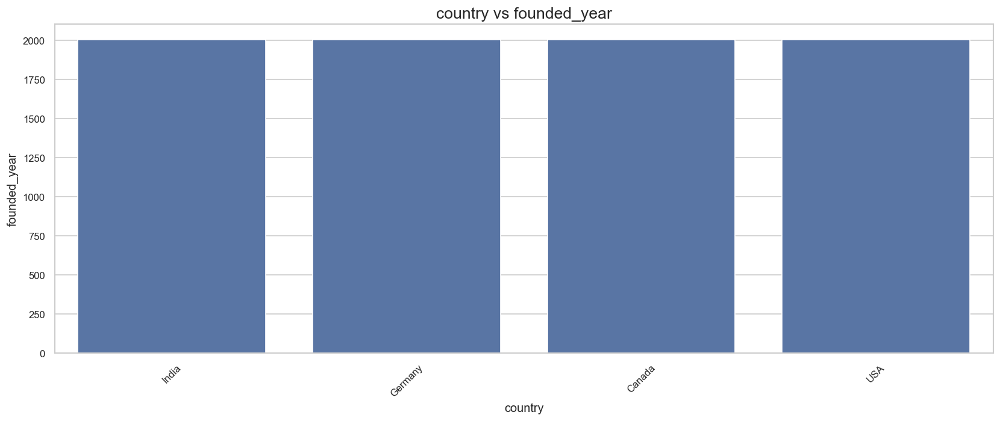


TOP country BASED ON founded_year

country
USA        2004.4472
Canada     2004.3896
Germany    2004.3320
India      2004.3272
Name: founded_year, dtype: float64


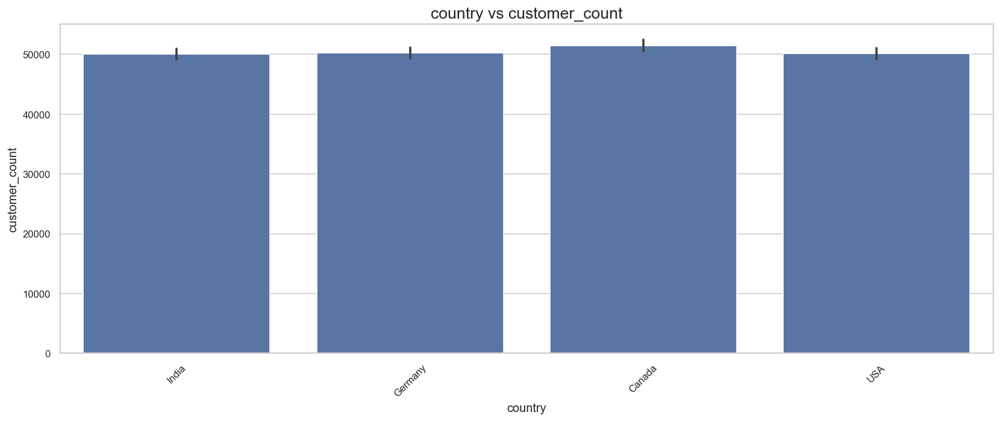


TOP country BASED ON customer_count

country
Canada     51453.220533
Germany    50197.027200
USA        50153.128533
India      49993.631200
Name: customer_count, dtype: float64


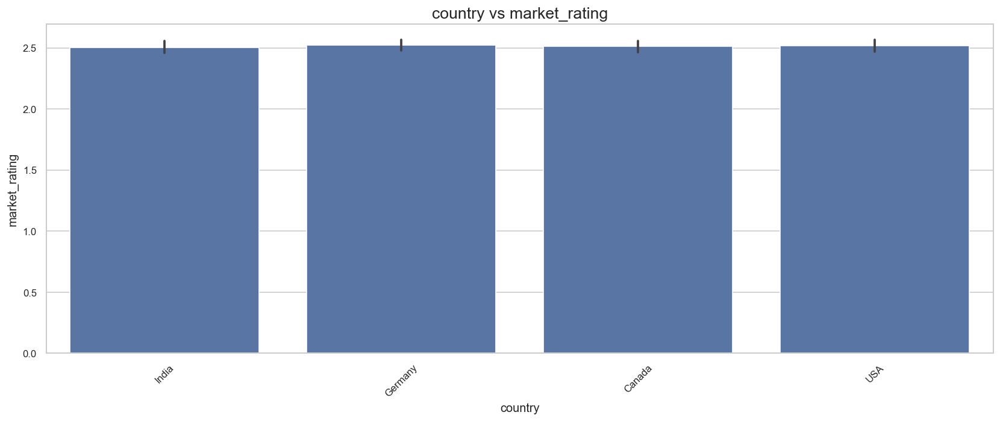


TOP country BASED ON market_rating

country
Germany    2.521973
USA        2.518267
Canada     2.511147
India      2.503733
Name: market_rating, dtype: float64


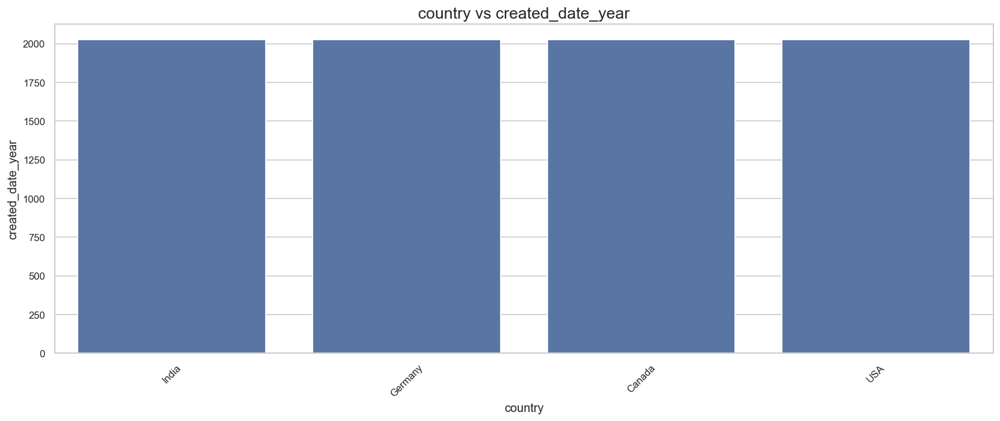


TOP country BASED ON created_date_year

country
USA        2024.621333
India      2024.620800
Canada     2024.608000
Germany    2024.588267
Name: created_date_year, dtype: float64


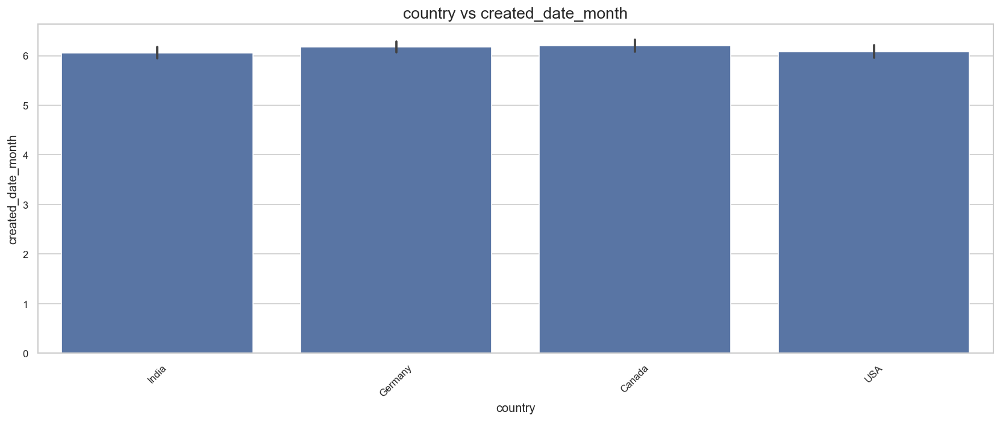


TOP country BASED ON created_date_month

country
Canada     6.197867
Germany    6.176000
USA        6.083200
India      6.056000
Name: created_date_month, dtype: float64


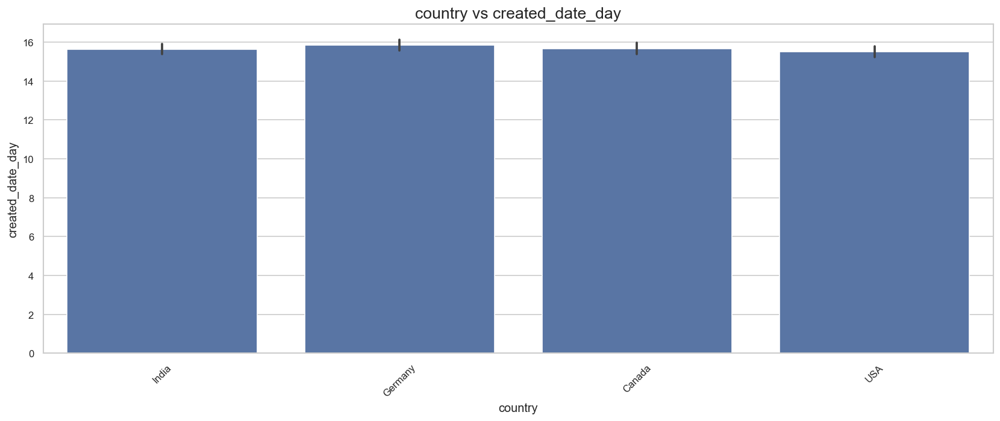


TOP country BASED ON created_date_day

country
Germany    15.857600
Canada     15.678400
India      15.642667
USA        15.511467
Name: created_date_day, dtype: float64


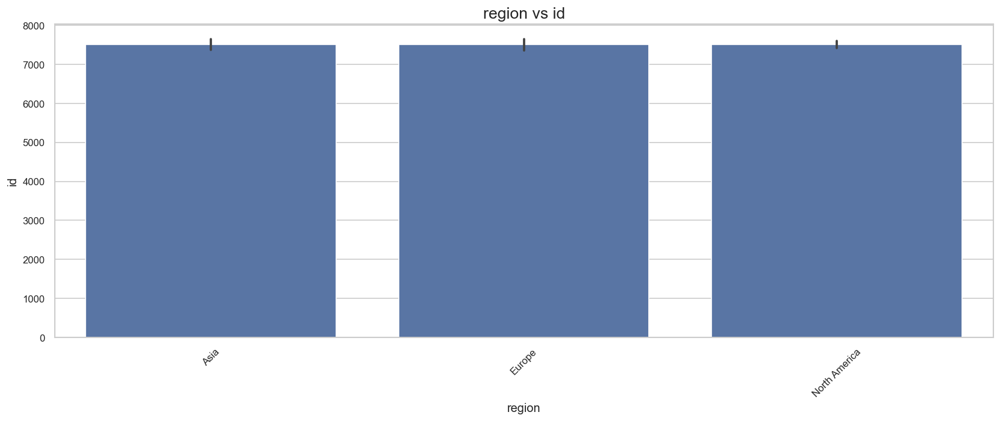


TOP region BASED ON id

region
North America    7501.5
Europe           7500.0
Asia             7499.0
Name: id, dtype: float64


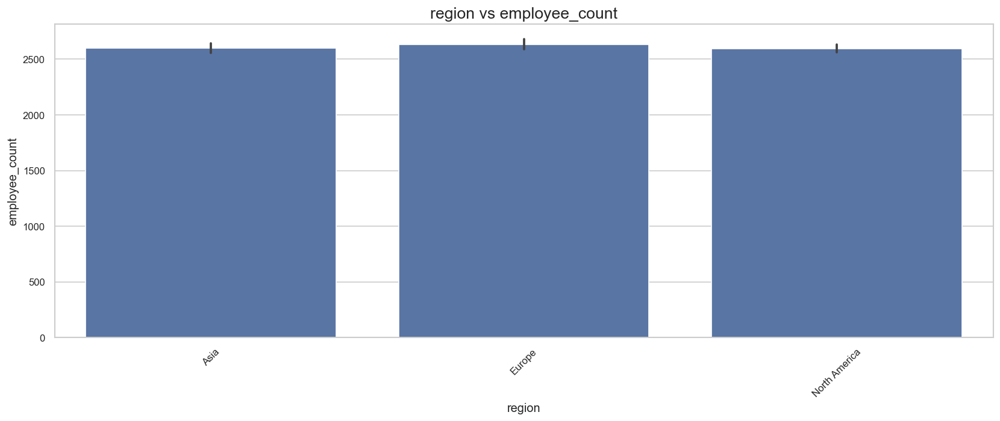


TOP region BASED ON employee_count

region
Europe           2634.276533
Asia             2600.321333
North America    2596.425200
Name: employee_count, dtype: float64


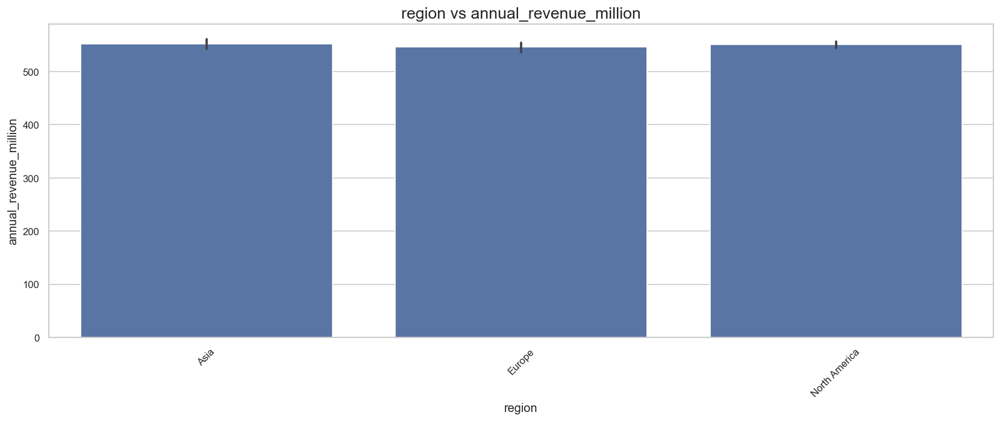


TOP region BASED ON annual_revenue_million

region
Asia             551.872211
North America    550.641687
Europe           545.775243
Name: annual_revenue_million, dtype: float64


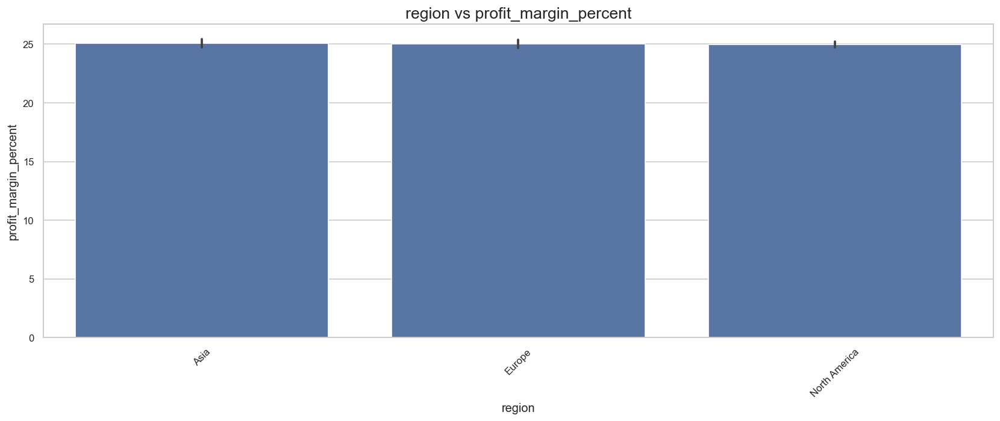


TOP region BASED ON profit_margin_percent

region
Asia             25.077557
Europe           25.018747
North America    24.975887
Name: profit_margin_percent, dtype: float64


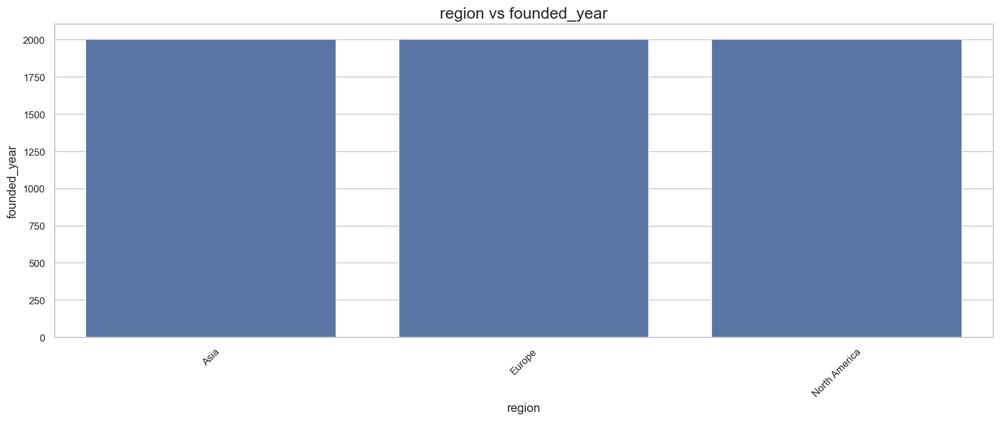


TOP region BASED ON founded_year

region
North America    2004.4184
Europe           2004.3320
Asia             2004.3272
Name: founded_year, dtype: float64


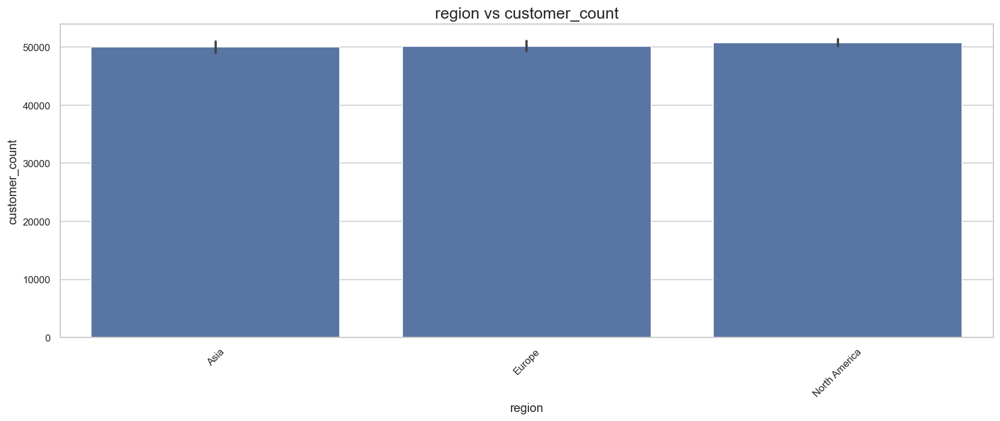


TOP region BASED ON customer_count

region
North America    50803.174533
Europe           50197.027200
Asia             49993.631200
Name: customer_count, dtype: float64


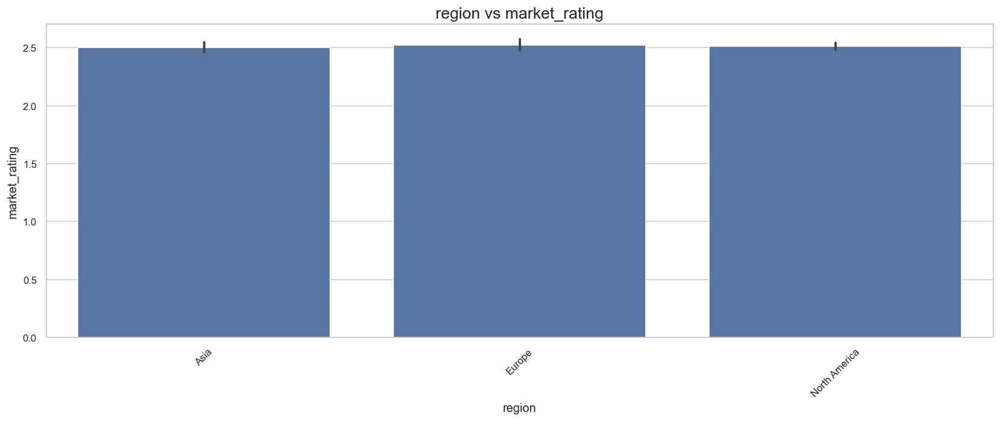


TOP region BASED ON market_rating

region
Europe           2.521973
North America    2.514707
Asia             2.503733
Name: market_rating, dtype: float64


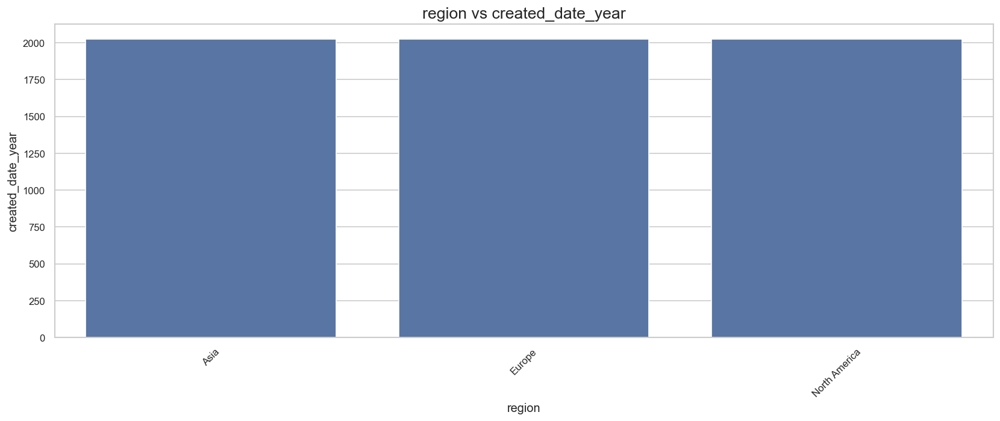


TOP region BASED ON created_date_year

region
Asia             2024.620800
North America    2024.614667
Europe           2024.588267
Name: created_date_year, dtype: float64


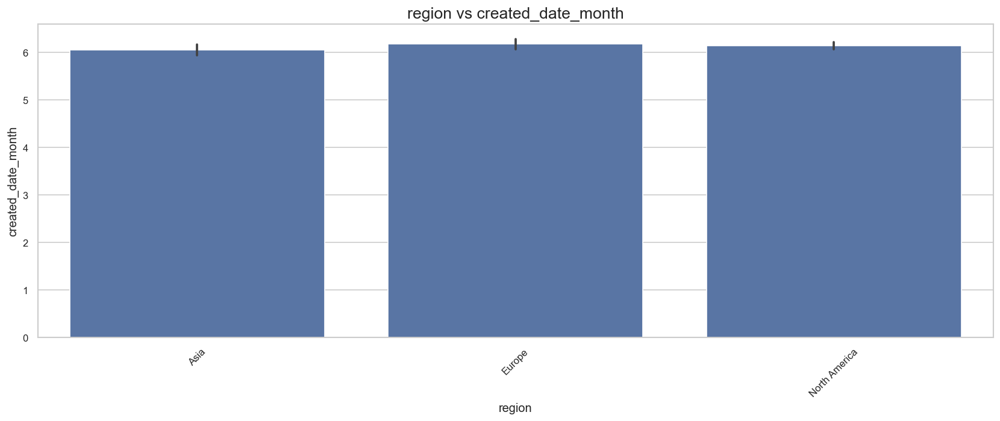


TOP region BASED ON created_date_month

region
Europe           6.176000
North America    6.140533
Asia             6.056000
Name: created_date_month, dtype: float64


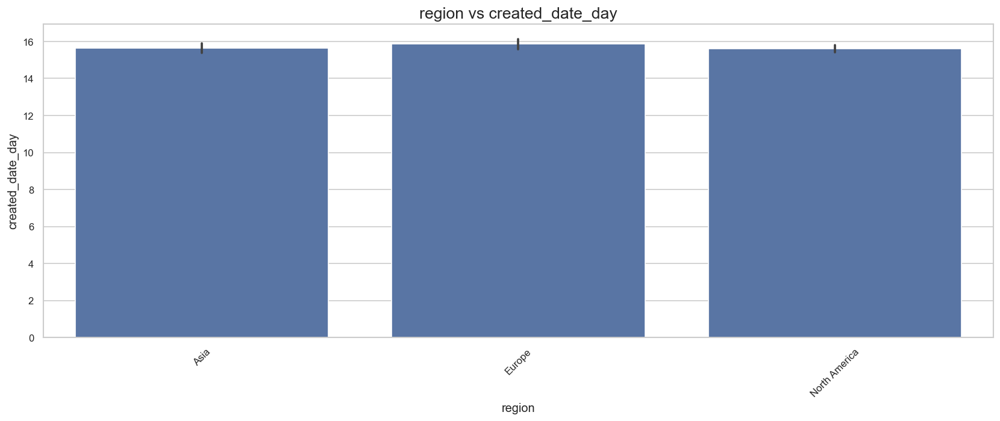


TOP region BASED ON created_date_day

region
Europe           15.857600
Asia             15.642667
North America    15.594933
Name: created_date_day, dtype: float64


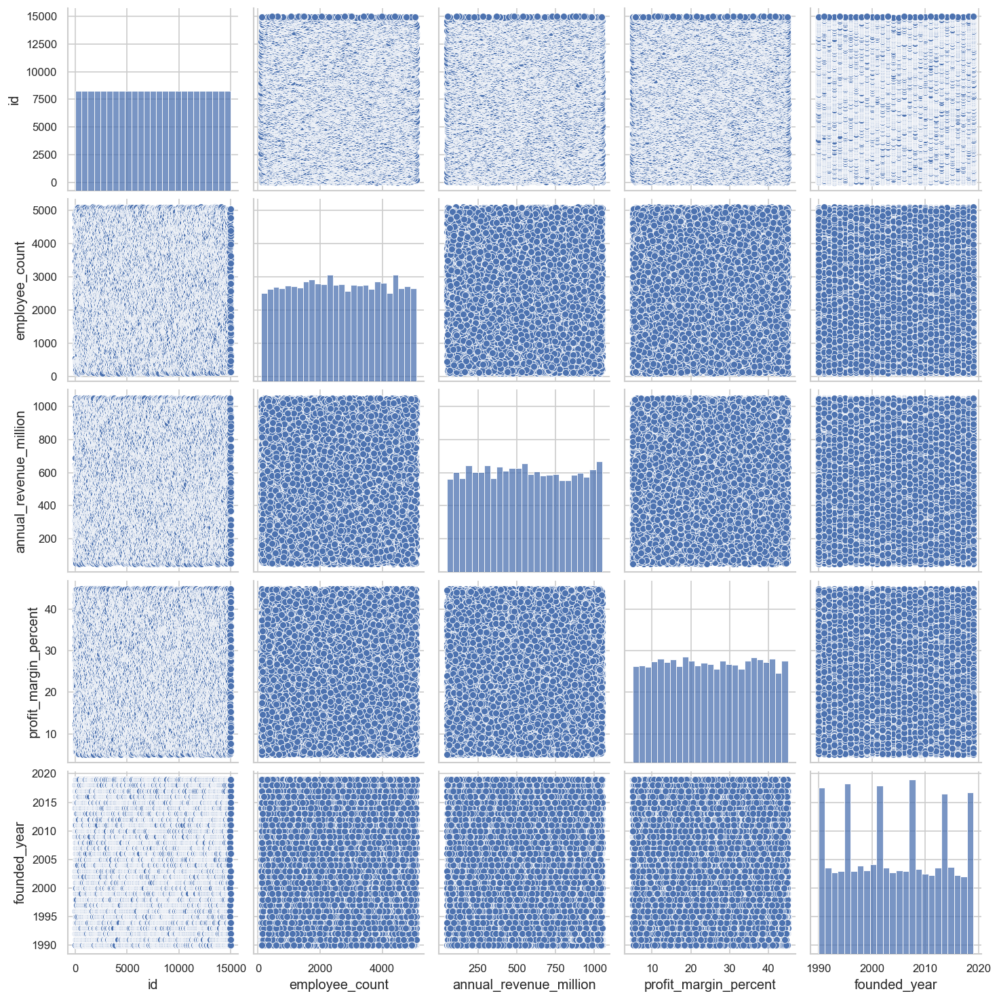

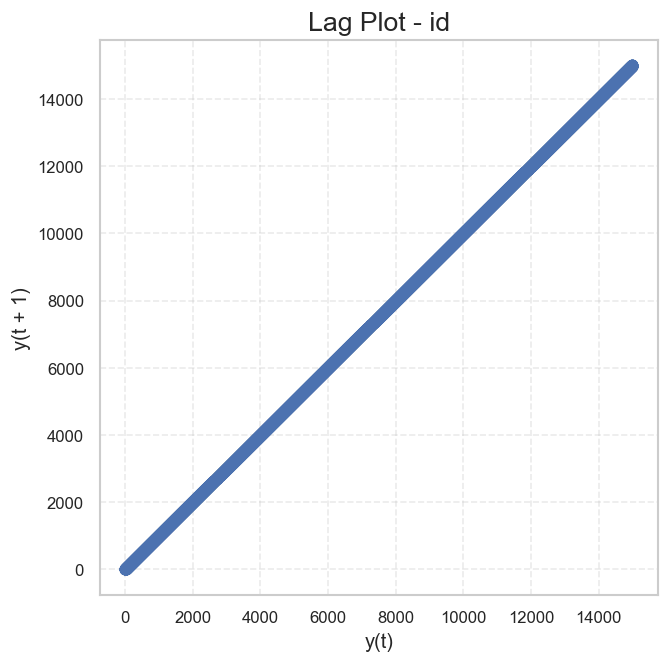

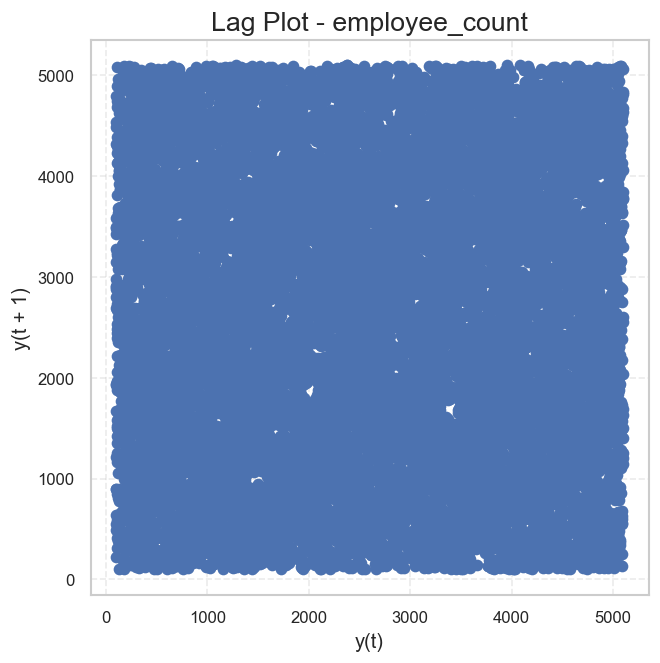

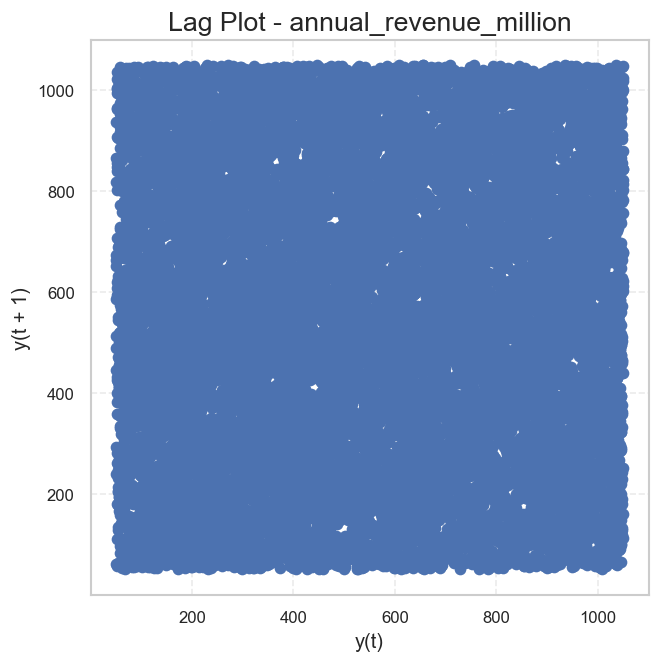

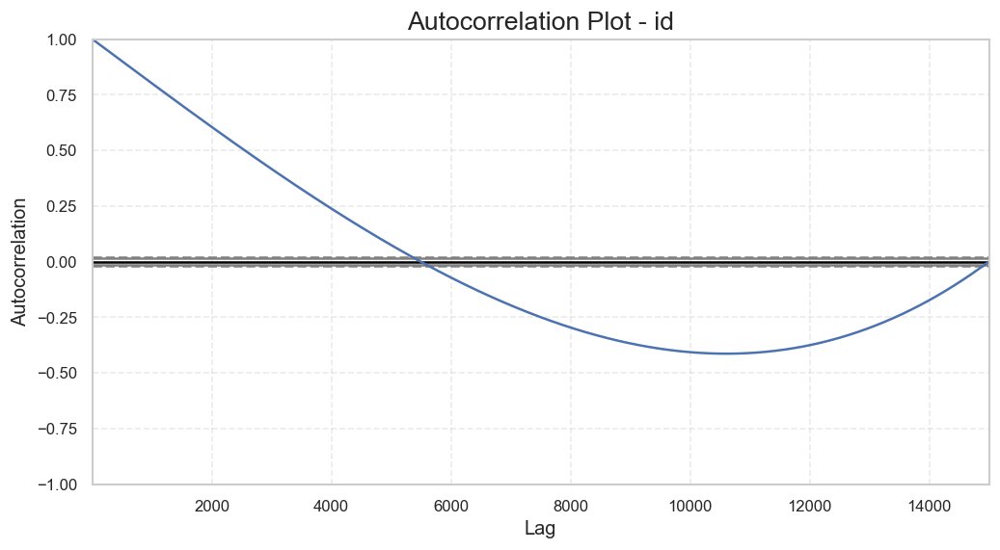

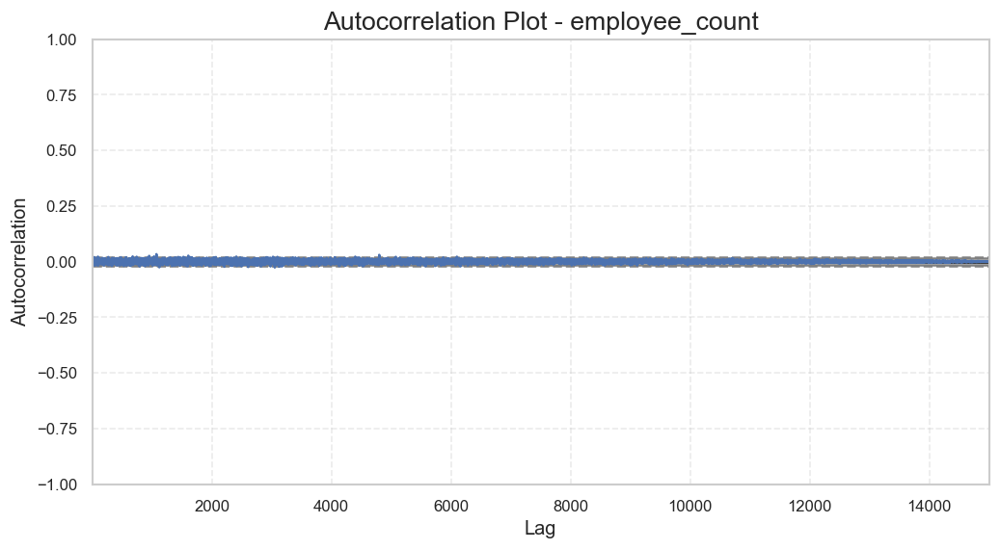

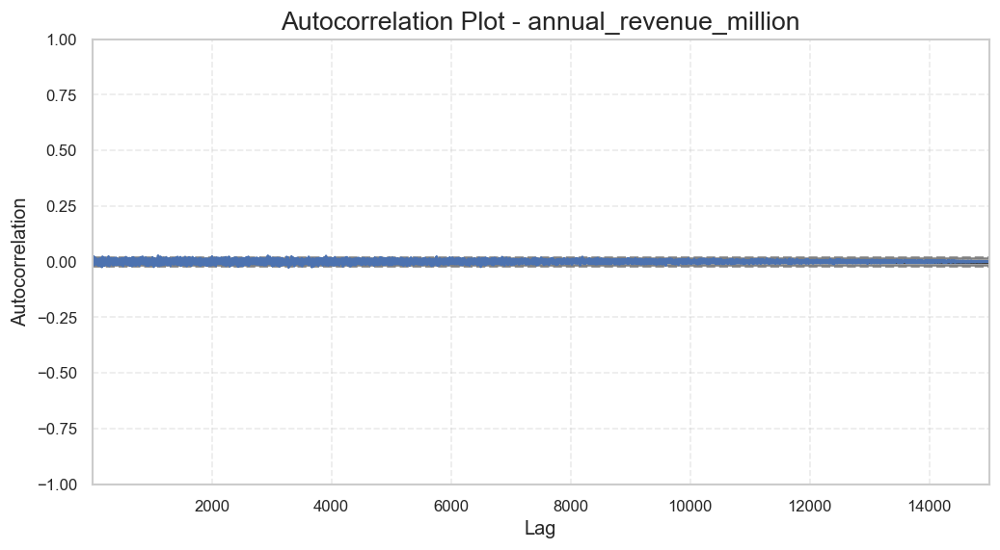

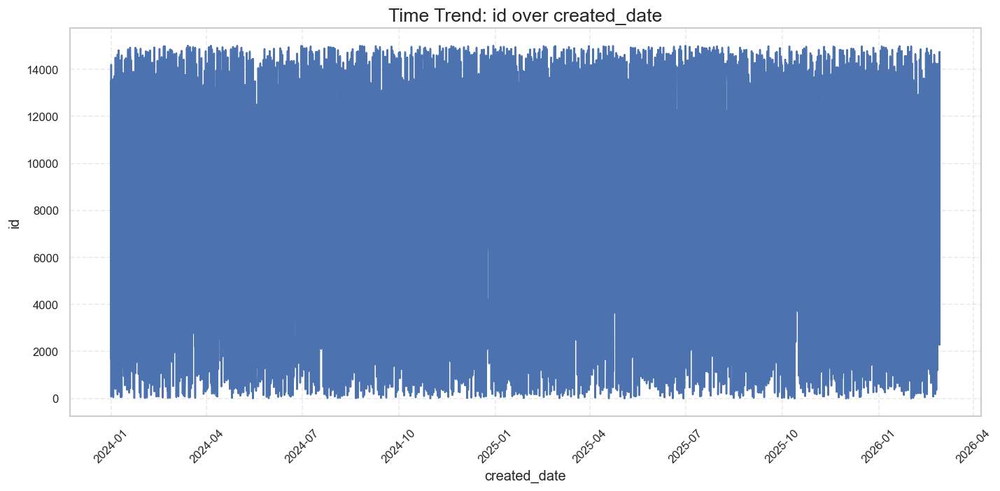

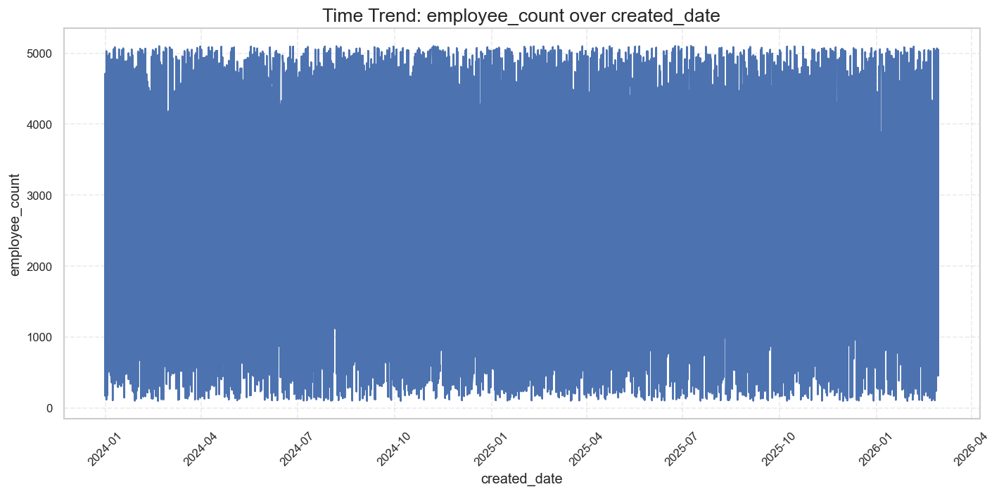

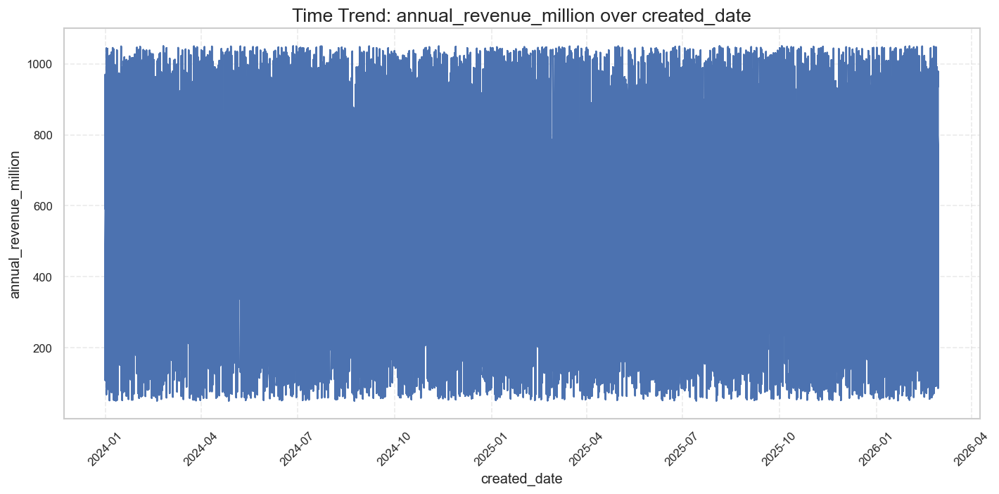


OUTLIER ANALYSIS
id -> Z-Score Outliers : 0
id -> IQR Outliers : 0
employee_count -> Z-Score Outliers : 0
employee_count -> IQR Outliers : 0
annual_revenue_million -> Z-Score Outliers : 0
annual_revenue_million -> IQR Outliers : 0
profit_margin_percent -> Z-Score Outliers : 0
profit_margin_percent -> IQR Outliers : 0
founded_year -> Z-Score Outliers : 0
founded_year -> IQR Outliers : 0
customer_count -> Z-Score Outliers : 0
customer_count -> IQR Outliers : 0
market_rating -> Z-Score Outliers : 0
market_rating -> IQR Outliers : 0
created_date_year -> Z-Score Outliers : 0
created_date_year -> IQR Outliers : 0
created_date_month -> Z-Score Outliers : 0
created_date_month -> IQR Outliers : 0
created_date_day -> Z-Score Outliers : 0
created_date_day -> IQR Outliers : 0

NORMALITY TESTS

COLUMN : id
Shapiro Statistic : 0.9554
P-Value : 0.0
Interpretation : Data is NOT normally distributed.

COLUMN : employee_count
Shapiro Statistic : 0.9575
P-Value : 0.0
Interpretation : Data is NOT normall

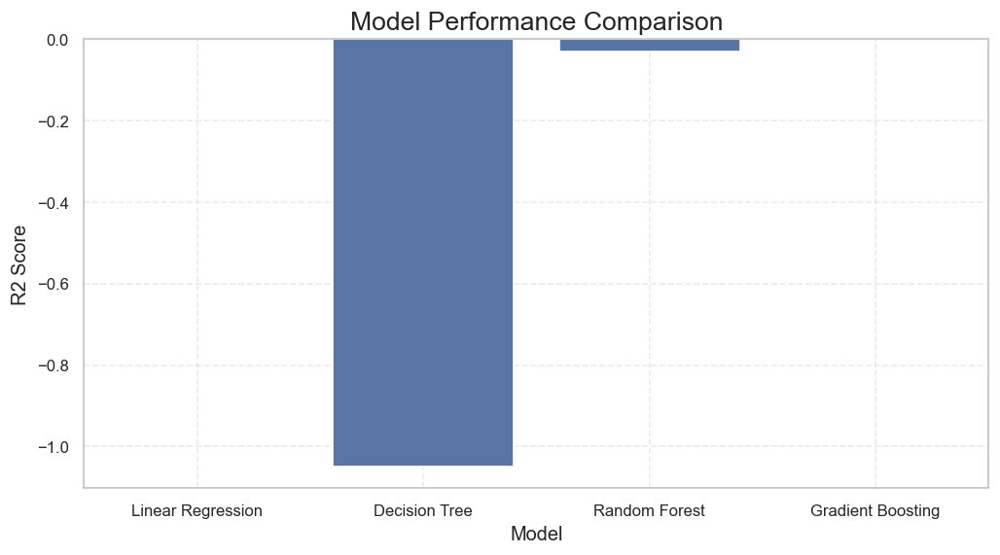


CLUSTERING ANALYSIS


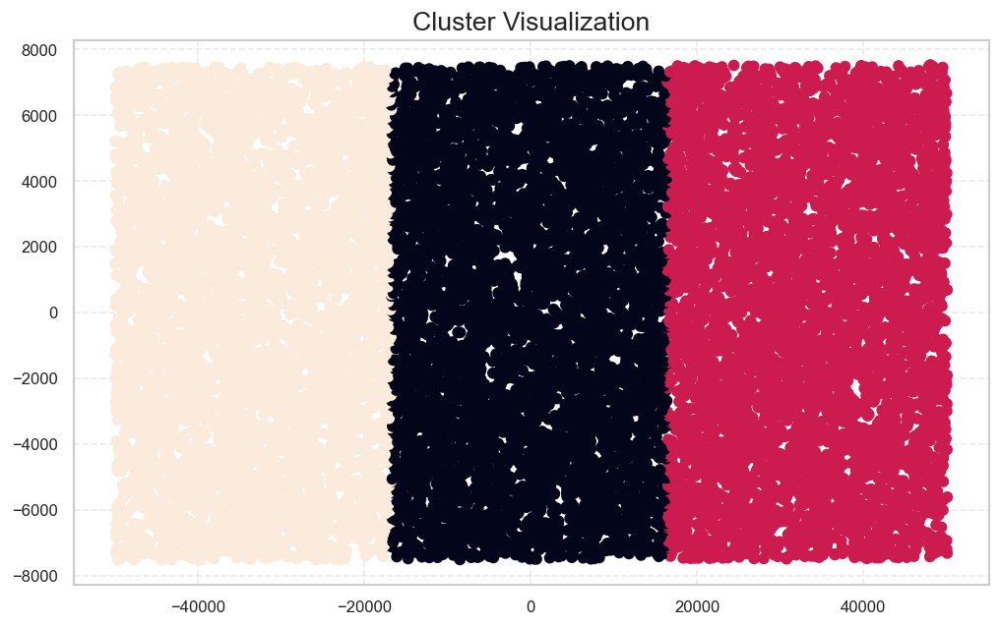


Silhouette Score : 0.53


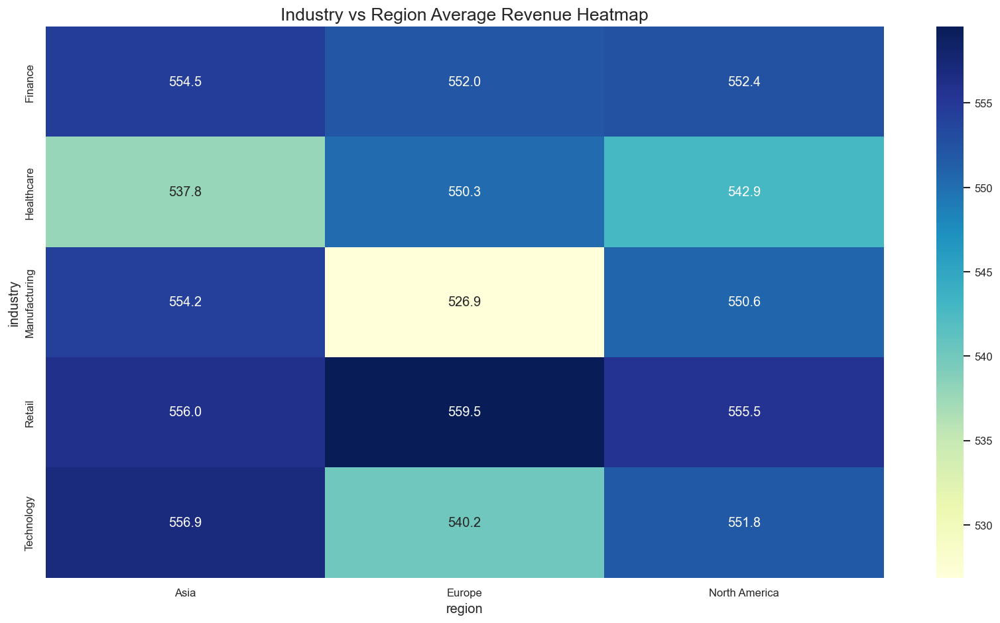


DATASET-SPECIFIC BUSINESS FINDINGS

TOP INDUSTRIES BY AVG REVENUE

industry
Retail           556.609343
Finance          552.823690
Technology       550.198027
Manufacturing    545.575197
Healthcare       543.457277
Name: annual_revenue_million, dtype: float64

TOP INDUSTRIES BY CUSTOMER COUNT

industry
Healthcare       51025.384333
Finance          50665.919000
Technology       50355.641333
Manufacturing    50220.057333
Retail           49979.257333
Name: customer_count, dtype: float64

TOP REGIONS BY MARKET RATING

region
Europe           2.521973
North America    2.514707
Asia             2.503733
Name: market_rating, dtype: float64

TOP INDUSTRIES BY EMPLOYEE COUNT

industry
Finance          2621.878333
Healthcare       2610.893667
Technology       2610.892333
Retail           2608.425000
Manufacturing    2582.221000
Name: employee_count, dtype: float64

BUSINESS RECOMMENDATIONS


1. Focus on high-performing industries generating maximum revenue.

2. Increase customer acquisition 

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import (
    zscore,
    shapiro,
    skew,
    kurtosis
)

from pandas.plotting import (
    lag_plot,
    autocorrelation_plot,
    parallel_coordinates
)

from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor

from sklearn.ensemble import (
    RandomForestRegressor,
    GradientBoostingRegressor,
    IsolationForest
)

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

from sklearn.preprocessing import (
    StandardScaler,
    PolynomialFeatures
)

from sklearn.model_selection import train_test_split

from sklearn.metrics import (
    mean_absolute_error,
    mean_squared_error,
    r2_score,
    silhouette_score
)

from statsmodels.stats.outliers_influence import (
    variance_inflation_factor
)

import warnings
warnings.filterwarnings("ignore")

# =========================================================
# SETTINGS
# =========================================================

pd.set_option('display.max_columns', None)
pd.set_option('display.width', 300)

sns.set_theme(
    style="whitegrid",
    palette="deep"
)

plt.rcParams['figure.figsize'] = (10,5)
plt.rcParams['figure.dpi'] = 120
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10

print("="*70)
print("COMPLETE ENTERPRISE INDUSTRY DATASET EDA PIPELINE")
print("="*70)

# =========================================================
# LOAD DATASET
# =========================================================

df = pd.read_csv("INDUSTRY.csv")

print("\nDataset Loaded Successfully!")

# =========================================================
# BASIC UNDERSTANDING
# =========================================================

print("\nHEAD\n")
print(df.head())

print("\nSHAPE\n")
print(df.shape)

print("\nINFO\n")
print(df.info())

print("\nDATA TYPES\n")
print(df.dtypes)

print("\nDESCRIPTIVE STATS\n")
print(df.describe(include='all'))

# =========================================================
# MISSING VALUES
# =========================================================

missing_df = pd.DataFrame({

    'Missing Values': df.isnull().sum(),

    'Percentage': (
        df.isnull().sum() / len(df)
    ) * 100

})

print("\nMISSING VALUES\n")
print(missing_df)

# =========================================================
# DUPLICATES
# =========================================================

print("\nDUPLICATES\n")
print(df.duplicated().sum())

# =========================================================
# DATE DETECTION
# =========================================================

possible_date_cols = []

for col in df.columns:

    if 'date' in col.lower() or 'time' in col.lower():

        possible_date_cols.append(col)

for col in possible_date_cols:

    try:

        df[col] = pd.to_datetime(
            df[col],
            errors='coerce'
        )

        df[f'{col}_year'] = df[col].dt.year
        df[f'{col}_month'] = df[col].dt.month
        df[f'{col}_day'] = df[col].dt.day

    except:
        pass

# =========================================================
# COLUMN TYPES
# =========================================================

numerical_cols = df.select_dtypes(
    include=[np.number]
).columns.tolist()

categorical_cols = df.select_dtypes(
    include=['object', 'category']
).columns.tolist()

datetime_cols = df.select_dtypes(
    include=['datetime64']
).columns.tolist()

# =========================================================
# GRAPH INSIGHTS FUNCTION
# =========================================================

def graph_insights(series, col_name):

    try:

        print("\n" + "-"*60)
        print(f"INSIGHTS FOR {col_name.upper()}")
        print("-"*60)

        print(f"Average Value : {round(series.mean(),2)}")
        print(f"Median Value : {round(series.median(),2)}")
        print(f"Minimum Value : {round(series.min(),2)}")
        print(f"Maximum Value : {round(series.max(),2)}")
        print(f"Standard Deviation : {round(series.std(),2)}")

        print(f"Skewness : {round(skew(series.dropna()),2)}")
        print(f"Kurtosis : {round(kurtosis(series.dropna()),2)}")

        if series.mean() > series.median():

            print(
                "Reading : Distribution is positively skewed."
            )

        elif series.mean() < series.median():

            print(
                "Reading : Distribution is negatively skewed."
            )

        else:

            print(
                "Reading : Distribution appears balanced."
            )

        if skew(series.dropna()) > 1:

            print(
                "Business Insight : Few extremely large values dominate this feature."
            )

        if kurtosis(series.dropna()) > 3:

            print(
                "Business Insight : Presence of extreme enterprise-level observations."
            )

    except:
        pass

# =========================================================
# UNIVARIATE ANALYSIS
# =========================================================

print("\n" + "="*70)
print("UNIVARIATE ANALYSIS")
print("="*70)

for col in numerical_cols:

    try:

        if df[col].nunique() <= 1:
            continue

        # HISTOGRAM

        plt.figure()

        sns.histplot(
            df[col].dropna(),
            kde=True,
            color='skyblue'
        )

        plt.title(f'Histogram - {col}')

        plt.grid(
            True,
            linestyle='--',
            alpha=0.4
        )

        plt.show()

        graph_insights(
            df[col].dropna(),
            col
        )

        # BOXPLOT

        plt.figure()

        sns.boxplot(
            x=df[col],
            color='orange'
        )

        plt.title(f'Boxplot - {col}')

        plt.grid(
            True,
            linestyle='--',
            alpha=0.4
        )

        plt.show()

        # VIOLIN PLOT

        plt.figure()

        sns.violinplot(
            x=df[col],
            color='lightgreen'
        )

        plt.title(f'Violin Plot - {col}')

        plt.grid(
            True,
            linestyle='--',
            alpha=0.4
        )

        plt.show()

    except:
        continue

# =========================================================
# PIE CHARTS
# =========================================================

for col in categorical_cols:

    try:

        top_values = df[col].value_counts().head(10)

        plt.figure(figsize=(8,8))

        top_values.plot.pie(
            autopct='%1.1f%%',
            shadow=True,
            startangle=90
        )

        plt.title(f'Pie Chart - {col}')

        plt.ylabel("")

        plt.tight_layout()

        plt.show()

    except:
        continue

# =========================================================
# BAR CHARTS
# =========================================================

for col in categorical_cols:

    try:

        plt.figure(figsize=(12,5))

        sns.countplot(
            y=df[col],
            order=df[col].value_counts().index[:10]
        )

        plt.title(f'Count Plot - {col}')

        plt.tight_layout()

        plt.show()

    except:
        continue

# =========================================================
# CORRELATION ANALYSIS
# =========================================================

print("\n" + "="*70)
print("CORRELATION ANALYSIS")
print("="*70)

if len(numerical_cols) >= 2:

    correlation_matrix = df[
        numerical_cols
    ].corr()

    plt.figure(figsize=(16,10))

    sns.heatmap(
        correlation_matrix,
        annot=True,
        cmap='RdYlBu',
        fmt='.2f',
        linewidths=0.5,
        square=True
    )

    plt.title("Correlation Heatmap")

    plt.show()

    # =====================================================
    # STRONGEST CORRELATIONS
    # =====================================================

    try:

        corr_pairs = correlation_matrix.unstack()

        corr_pairs = corr_pairs[
            corr_pairs.index.get_level_values(0)
            !=
            corr_pairs.index.get_level_values(1)
        ]

        corr_pairs = corr_pairs.sort_values(
            key=lambda x: abs(x),
            ascending=False
        )

        print("\nSTRONGEST CORRELATIONS\n")

        print(
            corr_pairs.drop_duplicates().head(10)
        )

    except:
        pass

# =========================================================
# SCATTERPLOTS
# =========================================================

if len(numerical_cols) >= 2:

    for i in range(min(5, len(numerical_cols)-1)):

        try:

            plt.figure(figsize=(8,5))

            sns.scatterplot(
                x=numerical_cols[i],
                y=numerical_cols[i+1],
                data=df
            )

            plt.title(
                f"{numerical_cols[i]} vs {numerical_cols[i+1]}"
            )

            plt.grid(
                True,
                linestyle='--',
                alpha=0.4
            )

            plt.show()

        except:
            continue

# =========================================================
# BUBBLE CHARTS
# =========================================================

try:

    if len(numerical_cols) >= 3:

        plt.figure(figsize=(12,6))

        bubble_size = (
            df[numerical_cols[2]].fillna(0)
        )

        plt.scatter(
            df[numerical_cols[0]],
            df[numerical_cols[1]],
            s=bubble_size * 2,
            alpha=0.5
        )

        plt.xlabel(numerical_cols[0])
        plt.ylabel(numerical_cols[1])

        plt.title(
            f'Bubble Chart: {numerical_cols[0]} vs {numerical_cols[1]}'
        )

        plt.grid(
            True,
            linestyle='--',
            alpha=0.4
        )

        plt.show()

except:
    pass

# =========================================================
# NUMERICAL VS CATEGORICAL ANALYSIS
# =========================================================

for cat_col in categorical_cols:

    for num_col in numerical_cols:

        try:

            if df[cat_col].nunique() > 15:
                continue

            plt.figure(figsize=(14,6))

            sns.barplot(
                x=cat_col,
                y=num_col,
                data=df
            )

            plt.xticks(rotation=45)

            plt.title(f'{cat_col} vs {num_col}')

            plt.tight_layout()

            plt.show()

            grouped = df.groupby(cat_col)[num_col].mean()

            print(f"\nTOP {cat_col} BASED ON {num_col}\n")

            print(
                grouped.sort_values(
                    ascending=False
                ).head()
            )

        except:
            continue

# =========================================================
# PAIRPLOT
# =========================================================

try:

    sns.pairplot(
        df[numerical_cols[:5]].dropna()
    )

    plt.show()

except:
    pass

# =========================================================
# LAG PLOTS
# =========================================================

try:

    for col in numerical_cols[:3]:

        plt.figure(figsize=(6,6))

        lag_plot(
            df[col].dropna()
        )

        plt.title(f'Lag Plot - {col}')

        plt.grid(
            True,
            linestyle='--',
            alpha=0.4
        )

        plt.show()

except:
    pass

# =========================================================
# AUTOCORRELATION PLOTS
# =========================================================

try:

    for col in numerical_cols[:3]:

        plt.figure(figsize=(10,5))

        autocorrelation_plot(
            df[col].dropna()
        )

        plt.title(f'Autocorrelation Plot - {col}')

        plt.grid(
            True,
            linestyle='--',
            alpha=0.4
        )

        plt.show()

except:
    pass

# =========================================================
# TIME SERIES TREND ANALYSIS
# =========================================================

try:

    if len(datetime_cols) > 0 and len(numerical_cols) > 0:

        for date_col in datetime_cols:

            for num_col in numerical_cols[:3]:

                try:

                    temp_df = df[
                        [date_col, num_col]
                    ].dropna()

                    temp_df = temp_df.sort_values(
                        by=date_col
                    )

                    plt.figure(figsize=(14,6))

                    plt.plot(
                        temp_df[date_col],
                        temp_df[num_col]
                    )

                    plt.title(
                        f"Time Trend: {num_col} over {date_col}"
                    )

                    plt.xlabel(date_col)
                    plt.ylabel(num_col)

                    plt.xticks(rotation=45)

                    plt.grid(
                        True,
                        linestyle='--',
                        alpha=0.4
                    )

                    plt.show()

                except:
                    continue

except:
    pass

# =========================================================
# OUTLIER ANALYSIS
# =========================================================

print("\n" + "="*70)
print("OUTLIER ANALYSIS")
print("="*70)

for col in numerical_cols:

    try:

        z_scores = np.abs(
            zscore(df[col].dropna())
        )

        outlier_count = len(
            z_scores[z_scores > 3]
        )

        print(f"{col} -> Z-Score Outliers : {outlier_count}")

        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)

        IQR = Q3 - Q1

        lower = Q1 - 1.5 * IQR
        upper = Q3 + 1.5 * IQR

        iqr_outliers = df[
            (df[col] < lower) |
            (df[col] > upper)
        ]

        print(
            f"{col} -> IQR Outliers : {len(iqr_outliers)}"
        )

    except:
        pass

# =========================================================
# NORMALITY TESTS
# =========================================================

print("\n" + "="*70)
print("NORMALITY TESTS")
print("="*70)

for col in numerical_cols:

    try:

        clean_series = df[col].dropna()

        if len(clean_series) < 3:
            continue

        sample_size = min(5000, len(clean_series))

        sampled_data = clean_series.sample(
            sample_size,
            random_state=42
        )

        stat, p_value = shapiro(sampled_data)

        print(f"\nCOLUMN : {col}")

        print(f"Shapiro Statistic : {round(stat,4)}")

        print(f"P-Value : {round(p_value,4)}")

        if p_value > 0.05:

            print(
                "Interpretation : Data appears normally distributed."
            )

        else:

            print(
                "Interpretation : Data is NOT normally distributed."
            )

    except:
        continue

# =========================================================
# FEATURE ENGINEERING
# =========================================================

scaler = StandardScaler()

scaled_features = scaler.fit_transform(
    df[numerical_cols].fillna(0)
)

# =========================================================
# MULTICOLLINEARITY CHECK
# =========================================================

try:

    vif_data = pd.DataFrame()

    vif_data["Feature"] = numerical_cols

    vif_data["VIF"] = [

        variance_inflation_factor(
            df[numerical_cols].fillna(0).values,
            i
        )

        for i in range(len(numerical_cols))
    ]

    print("\nMULTICOLLINEARITY CHECK (VIF)\n")

    print(vif_data)

except:
    pass

# =========================================================
# TARGET DETECTION
# =========================================================

possible_targets = [

    'annual_revenue_million',

    'profit_margin_percent',

    'customer_count',

    'revenue',

    'profit',

    'sales'
]

target_col = None

for target in possible_targets:

    for col in numerical_cols:

        if col.lower() == target.lower():

            target_col = col
            break

    if target_col is not None:
        break

if target_col is None and len(numerical_cols) > 0:

    target_col = numerical_cols[-1]

print(f"\nSelected Target Column : {target_col}")

# =========================================================
# MACHINE LEARNING
# =========================================================

print("\n" + "="*70)
print("MACHINE LEARNING")
print("="*70)

if target_col is not None:

    feature_cols = [

        col for col in numerical_cols

        if col != target_col
    ]

    model_df = df[
        feature_cols + [target_col]
    ].dropna()

    X = model_df[feature_cols]
    y = model_df[target_col]

    X_train, X_test, y_train, y_test = train_test_split(
        X,
        y,
        test_size=0.2,
        random_state=42
    )

    models = {

        "Linear Regression":
        LinearRegression(),

        "Decision Tree":
        DecisionTreeRegressor(),

        "Random Forest":
        RandomForestRegressor(),

        "Gradient Boosting":
        GradientBoostingRegressor()

    }

    model_results = []

    for model_name, model_obj in models.items():

        try:

            model_obj.fit(X_train, y_train)

            preds = model_obj.predict(X_test)

            r2 = r2_score(
                y_test,
                preds
            )

            rmse = np.sqrt(
                mean_squared_error(
                    y_test,
                    preds
                )
            )

            model_results.append([
                model_name,
                round(r2,2),
                round(rmse,2)
            ])

        except:
            continue

    results_df = pd.DataFrame(
        model_results,
        columns=[
            'Model',
            'R2 Score',
            'RMSE'
        ]
    )

    print("\nMODEL COMPARISON\n")
    print(results_df)

    plt.figure(figsize=(10,5))

    sns.barplot(
        x='Model',
        y='R2 Score',
        data=results_df
    )

    plt.title("Model Performance Comparison")

    plt.grid(
        True,
        linestyle='--',
        alpha=0.4
    )

    plt.show()

# =========================================================
# CLUSTERING ANALYSIS
# =========================================================

print("\n" + "="*70)
print("CLUSTERING ANALYSIS")
print("="*70)

try:

    clustering_df = df[
        numerical_cols
    ].dropna()

    kmeans = KMeans(
        n_clusters=3,
        random_state=42,
        n_init='auto'
    )

    clusters = kmeans.fit_predict(
        clustering_df
    )

    clustering_df['Cluster'] = clusters

    pca = PCA(n_components=2)

    pca_data = pca.fit_transform(
        clustering_df[numerical_cols]
    )

    plt.figure(figsize=(10,6))

    plt.scatter(
        pca_data[:,0],
        pca_data[:,1],
        c=clusters
    )

    plt.title("Cluster Visualization")

    plt.grid(
        True,
        linestyle='--',
        alpha=0.4
    )

    plt.show()

    score = silhouette_score(
        clustering_df[numerical_cols],
        clusters
    )

    print(f"\nSilhouette Score : {round(score,2)}")

except:
    pass

# =========================================================
# INDUSTRY VS REGION HEATMAP
# =========================================================

try:

    if 'industry' in df.columns and \
       'region' in df.columns and \
       'annual_revenue_million' in df.columns:

        pivot_table = df.pivot_table(

            values='annual_revenue_million',

            index='industry',

            columns='region',

            aggfunc='mean'
        )

        plt.figure(figsize=(14,8))

        sns.heatmap(
            pivot_table,
            annot=True,
            cmap='YlGnBu',
            fmt='.1f'
        )

        plt.title(
            'Industry vs Region Average Revenue Heatmap'
        )

        plt.tight_layout()

        plt.show()

except:
    pass

# =========================================================
# DATASET-SPECIFIC BUSINESS FINDINGS
# =========================================================

print("\n" + "="*70)
print("DATASET-SPECIFIC BUSINESS FINDINGS")
print("="*70)

try:

    if 'industry' in df.columns and \
       'annual_revenue_million' in df.columns:

        industry_revenue = df.groupby(
            'industry'
        )['annual_revenue_million'].mean().sort_values(
            ascending=False
        )

        print("\nTOP INDUSTRIES BY AVG REVENUE\n")

        print(industry_revenue.head())

except:
    pass

try:

    if 'industry' in df.columns and \
       'customer_count' in df.columns:

        customer_base = df.groupby(
            'industry'
        )['customer_count'].mean().sort_values(
            ascending=False
        )

        print("\nTOP INDUSTRIES BY CUSTOMER COUNT\n")

        print(customer_base.head())

except:
    pass

try:

    if 'region' in df.columns and \
       'market_rating' in df.columns:

        region_rating = df.groupby(
            'region'
        )['market_rating'].mean().sort_values(
            ascending=False
        )

        print("\nTOP REGIONS BY MARKET RATING\n")

        print(region_rating)

except:
    pass

try:

    if 'industry' in df.columns and \
       'employee_count' in df.columns:

        employee_distribution = df.groupby(
            'industry'
        )['employee_count'].mean().sort_values(
            ascending=False
        )

        print("\nTOP INDUSTRIES BY EMPLOYEE COUNT\n")

        print(employee_distribution.head())

except:
    pass

COMPLETE ENTERPRISE INDUSTRY DATASET EDA PIPELINE

Dataset Loaded Successfully!

HEAD

   id  company_name       industry  country  employee_count  annual_revenue_million  profit_margin_percent  founded_year  customer_count  market_rating created_date         region
0   1    FinTrust_1        Finance    India             535                  539.38                  40.42          2010           81191            0.7   13-10-2025           Asia
1   2    TechNova_2     Technology  Germany            3806                  852.42                  39.55          2010           92162            3.4   01-12-2025         Europe
2   3   RetailHub_3         Retail   Canada            2779                  257.11                  23.68          1996           27532            2.9   04-05-2025  North America
3   4  BuildWorks_4  Manufacturing      USA             835                  309.14                  31.31          1993           90815            0.9   01-02-2026  North America
4   5    Medi

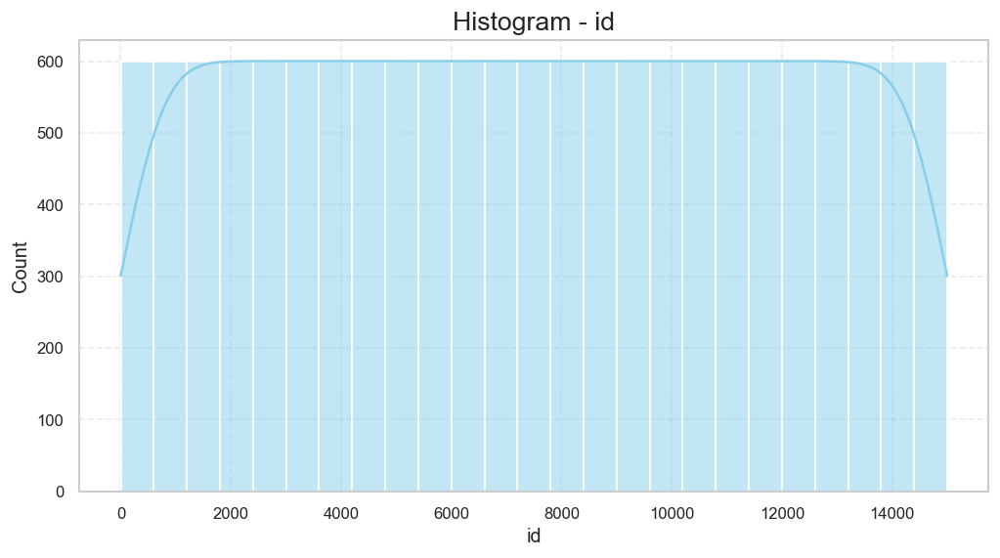


------------------------------------------------------------
INSIGHTS FOR ID
------------------------------------------------------------
Average Value : 7500.5
Median Value : 7500.5
Minimum Value : 1
Maximum Value : 15000
Standard Deviation : 4330.27
Skewness : 0.0
Kurtosis : -1.2
Reading : Distribution appears balanced.


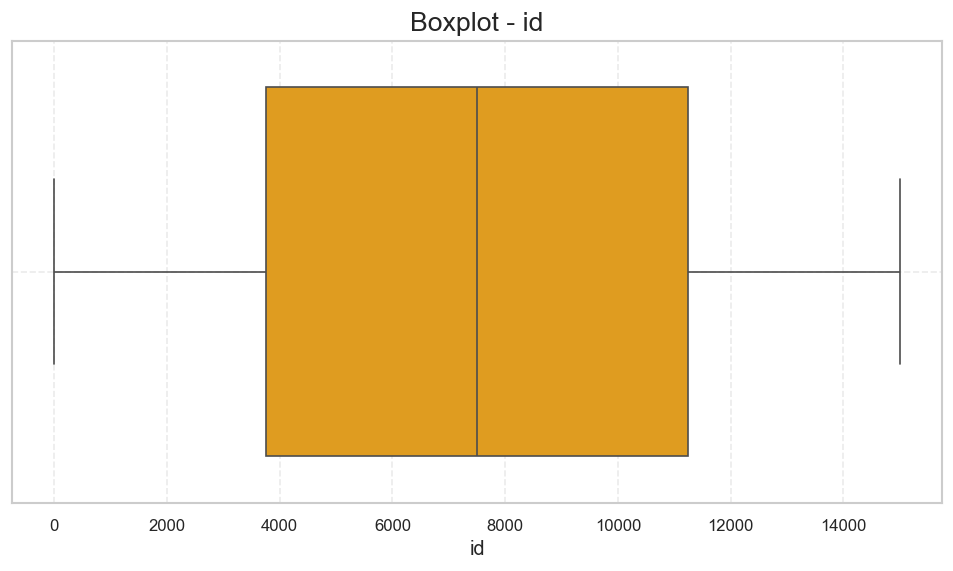

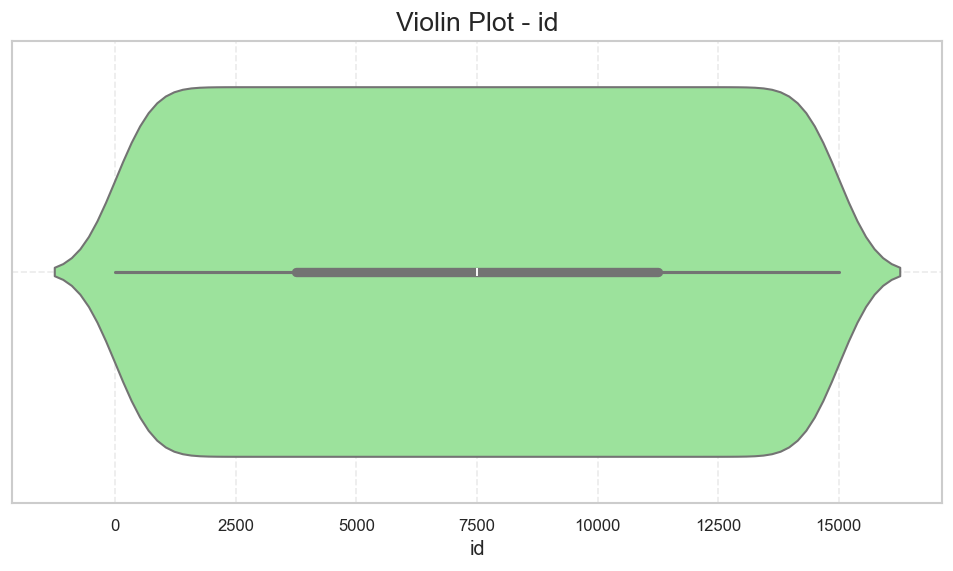

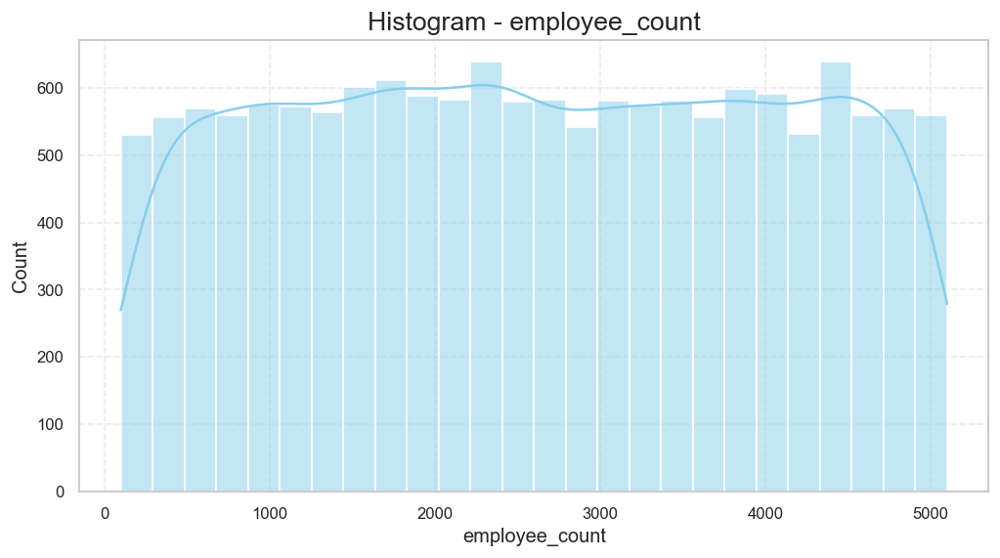


------------------------------------------------------------
INSIGHTS FOR EMPLOYEE_COUNT
------------------------------------------------------------
Average Value : 2606.86
Median Value : 2587.0
Minimum Value : 100
Maximum Value : 5099
Standard Deviation : 1430.56
Skewness : 0.0
Kurtosis : -1.19
Reading : Distribution is positively skewed.


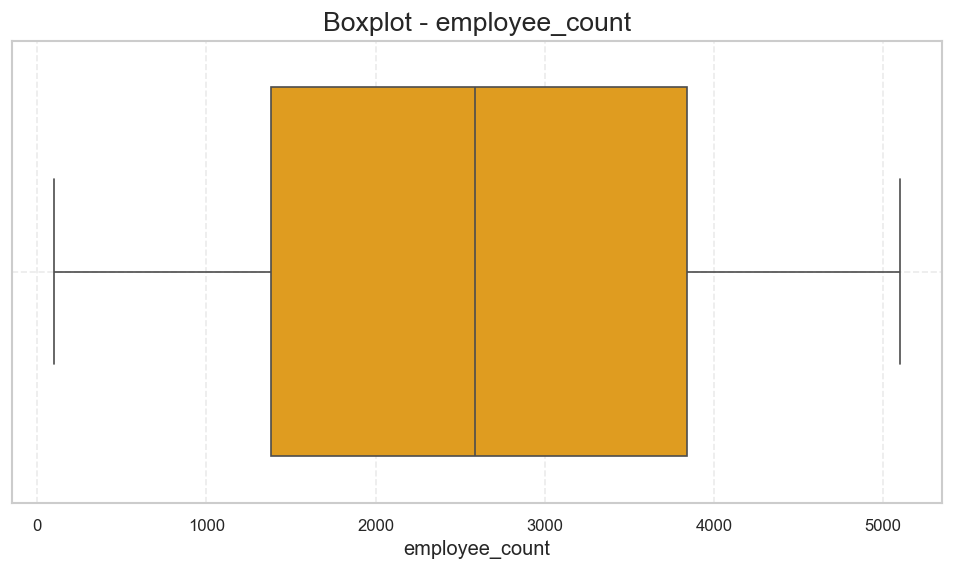

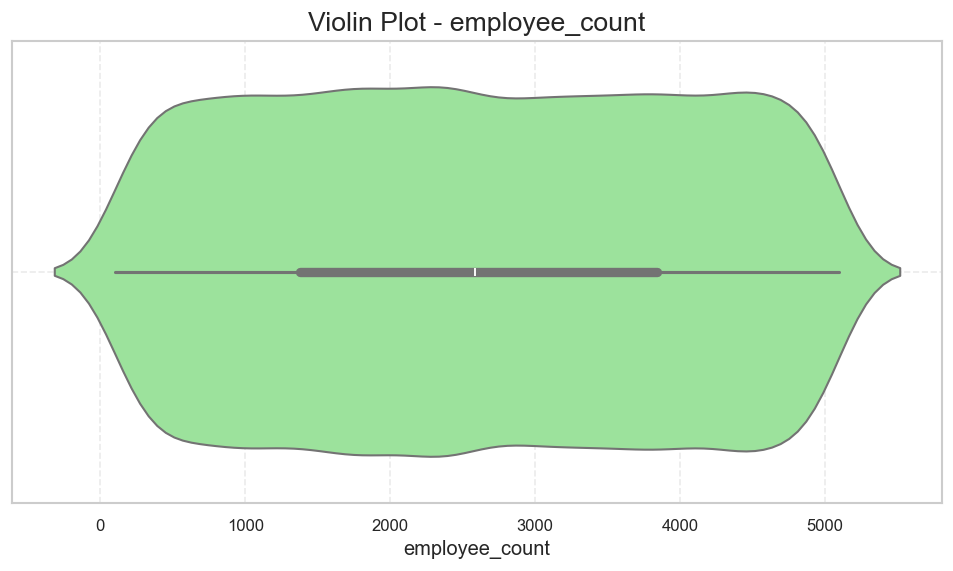

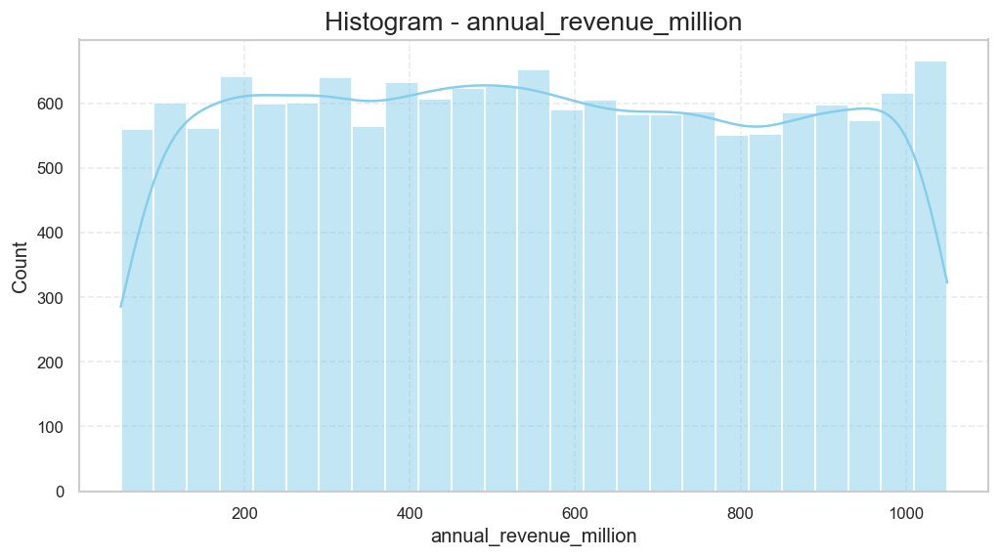


------------------------------------------------------------
INSIGHTS FOR ANNUAL_REVENUE_MILLION
------------------------------------------------------------
Average Value : 549.73
Median Value : 543.92
Minimum Value : 50.16
Maximum Value : 1049.96
Standard Deviation : 288.24
Skewness : 0.03
Kurtosis : -1.19
Reading : Distribution is positively skewed.


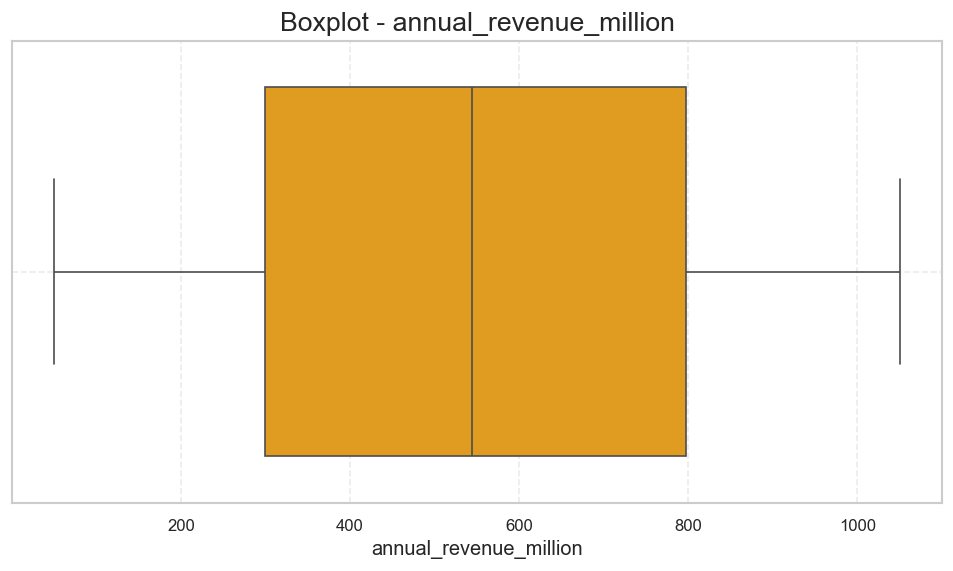

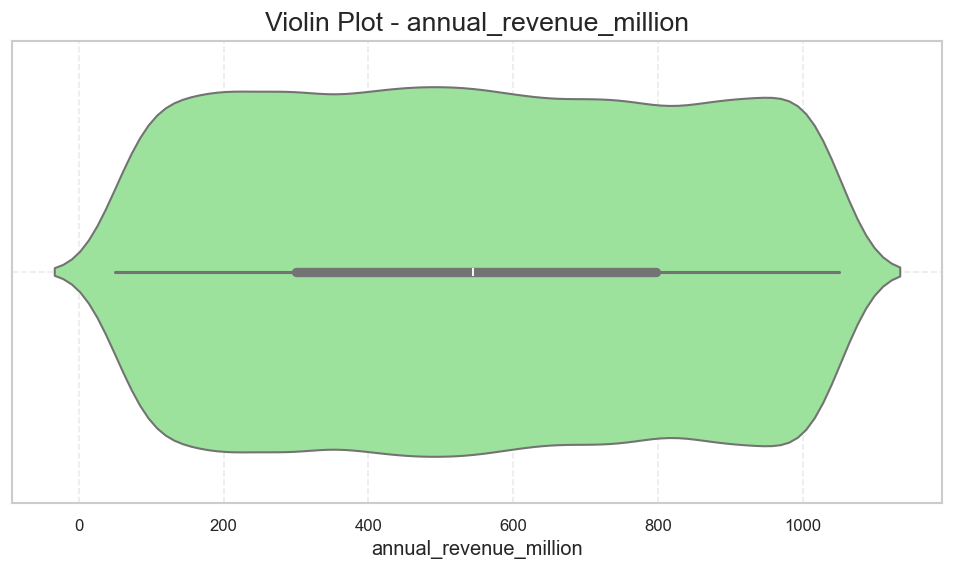

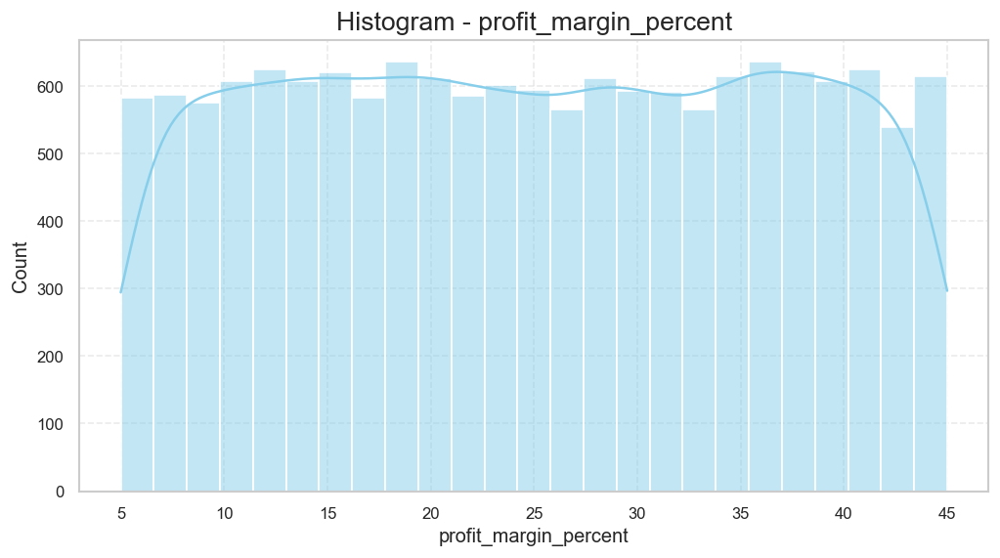


------------------------------------------------------------
INSIGHTS FOR PROFIT_MARGIN_PERCENT
------------------------------------------------------------
Average Value : 25.01
Median Value : 24.91
Minimum Value : 5.0
Maximum Value : 45.0
Standard Deviation : 11.53
Skewness : 0.0
Kurtosis : -1.2
Reading : Distribution is positively skewed.


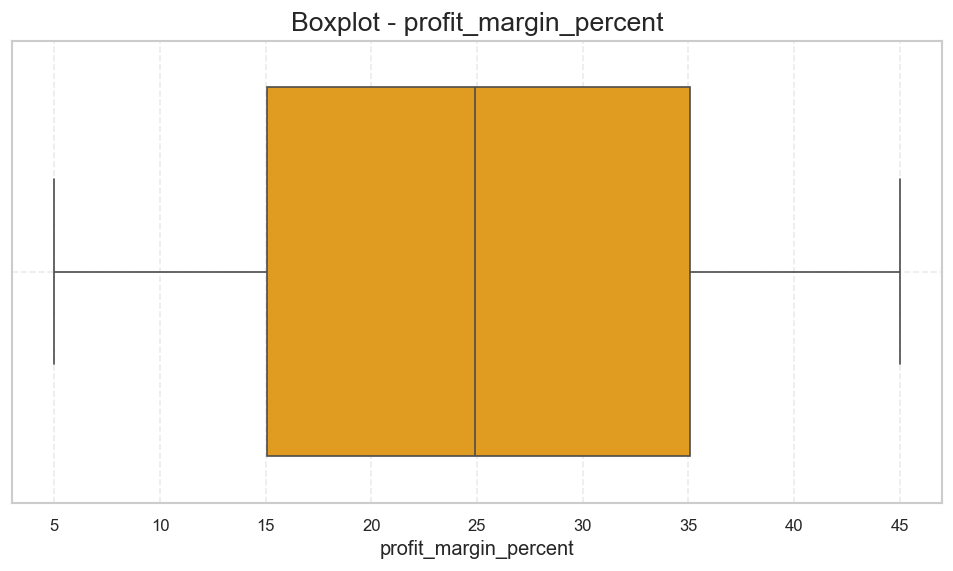

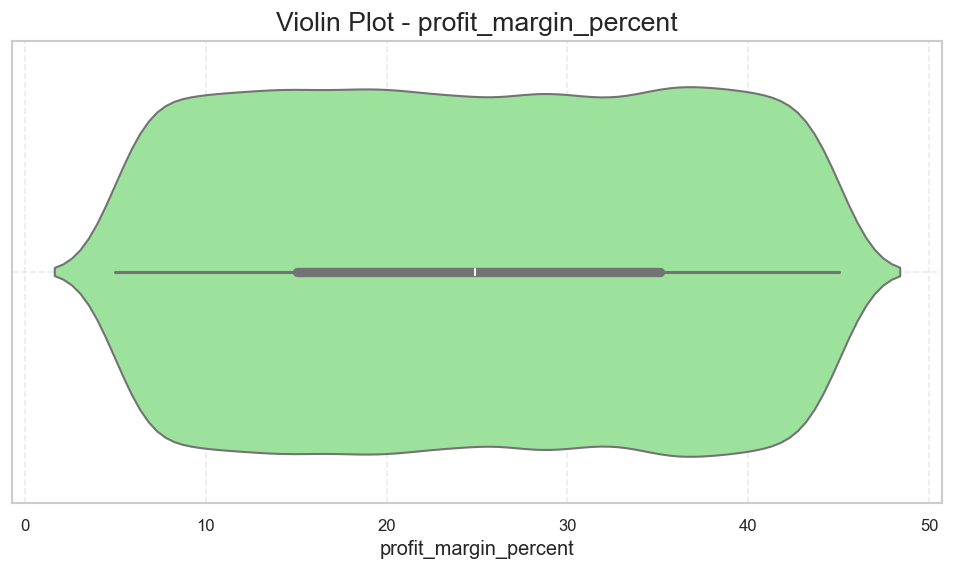

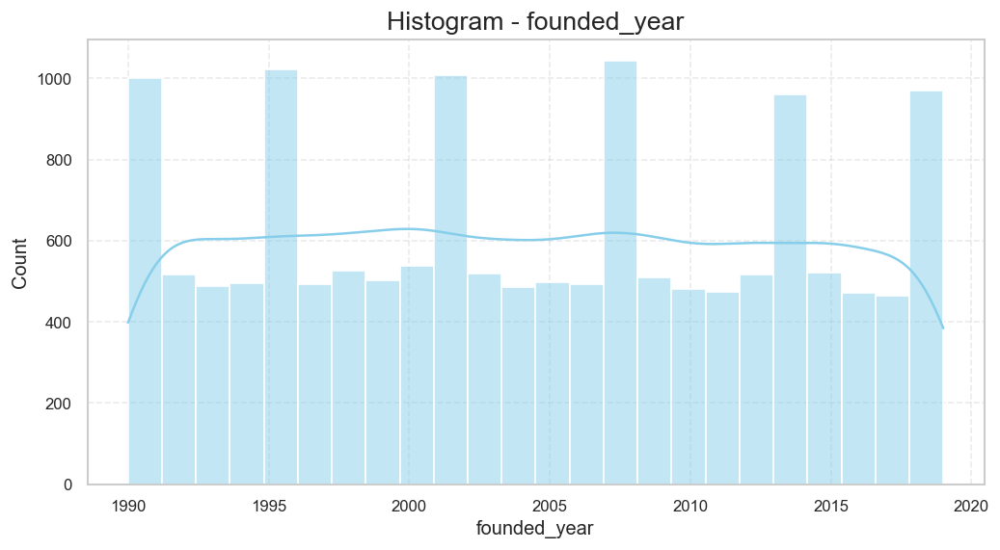


------------------------------------------------------------
INSIGHTS FOR FOUNDED_YEAR
------------------------------------------------------------
Average Value : 2004.37
Median Value : 2004.0
Minimum Value : 1990
Maximum Value : 2019
Standard Deviation : 8.61
Skewness : 0.02
Kurtosis : -1.19
Reading : Distribution is positively skewed.


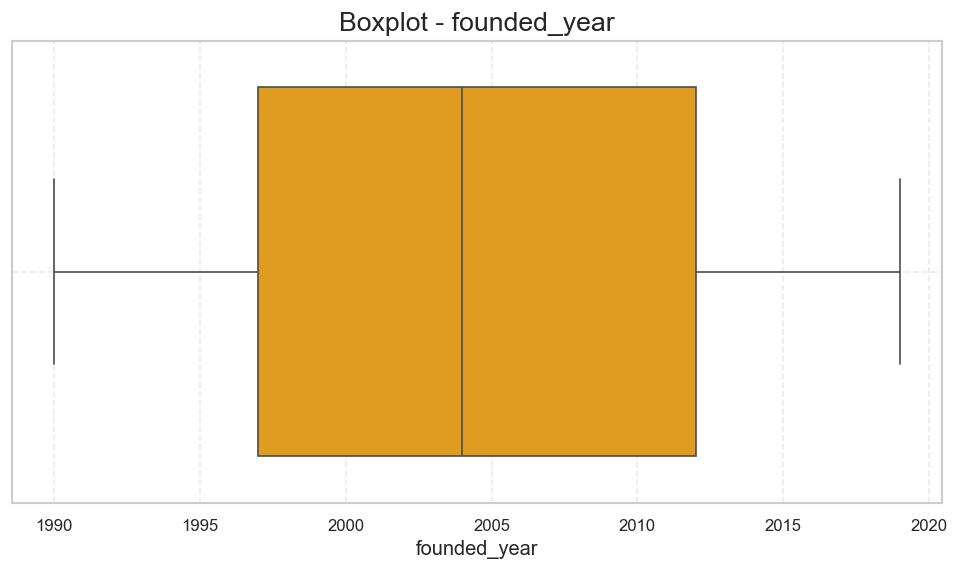

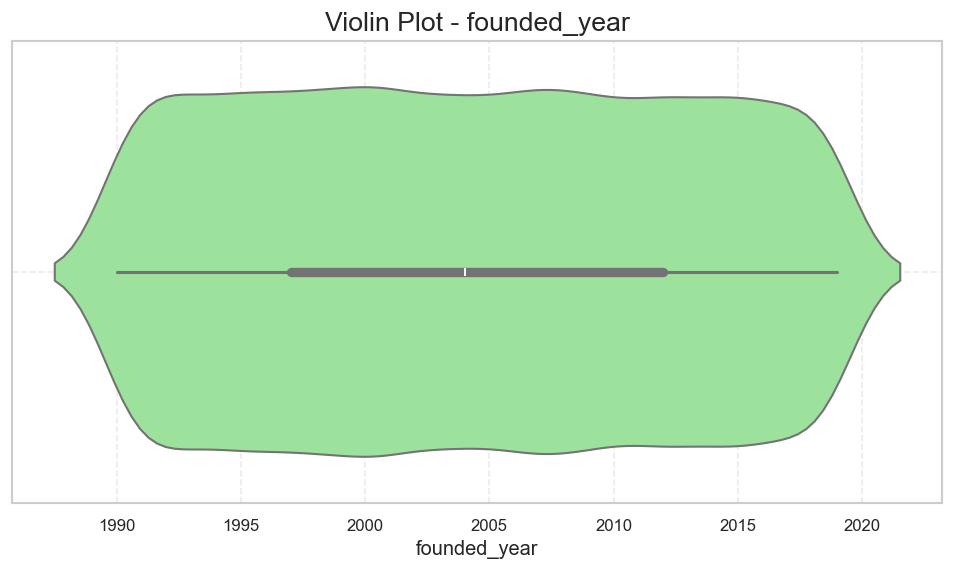

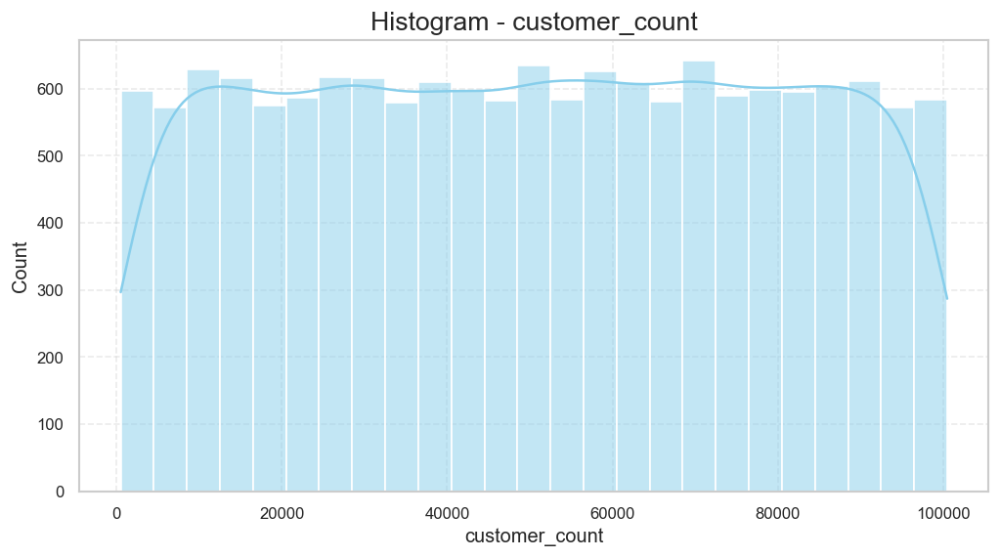


------------------------------------------------------------
INSIGHTS FOR CUSTOMER_COUNT
------------------------------------------------------------
Average Value : 50449.25
Median Value : 50726.5
Minimum Value : 500
Maximum Value : 100495
Standard Deviation : 28744.64
Skewness : -0.0
Kurtosis : -1.19
Reading : Distribution is negatively skewed.


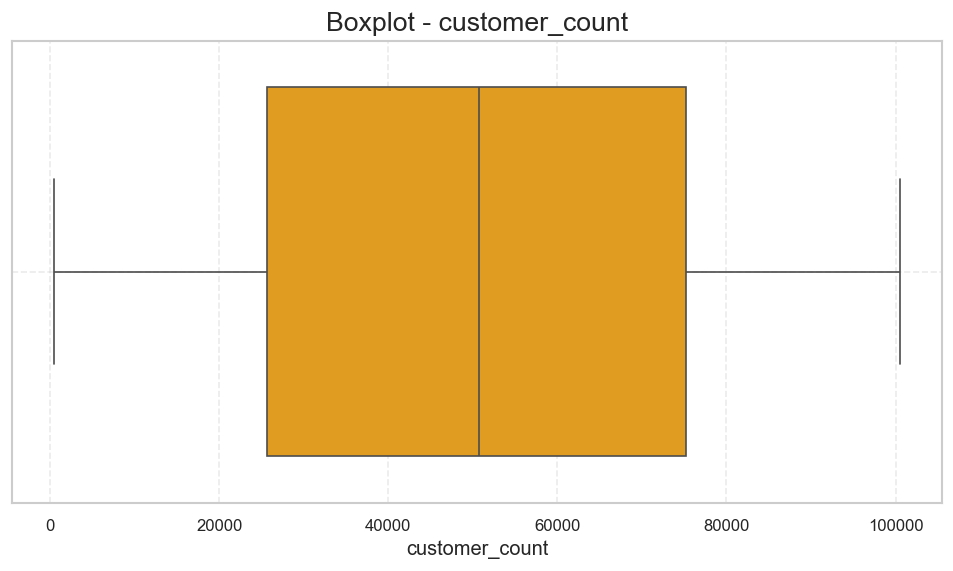

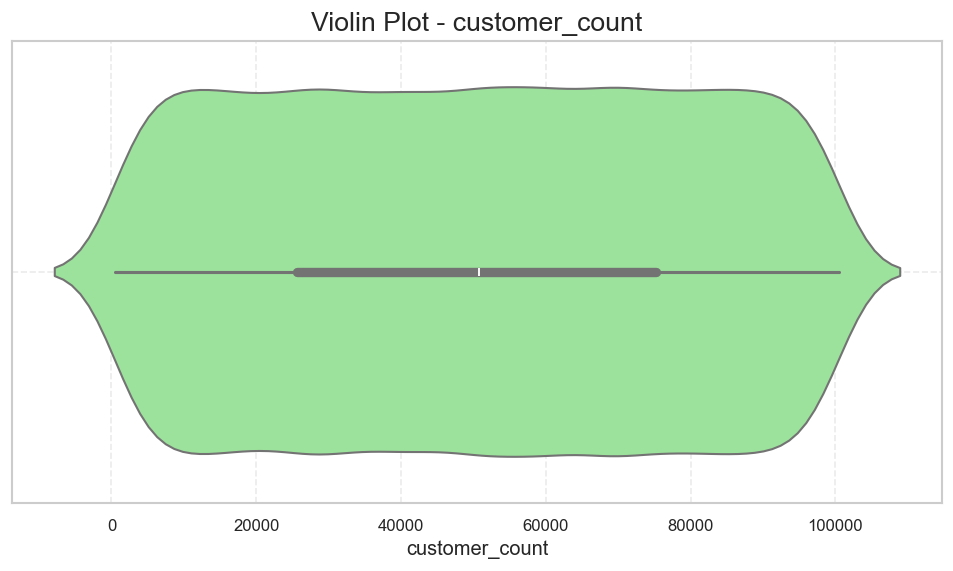

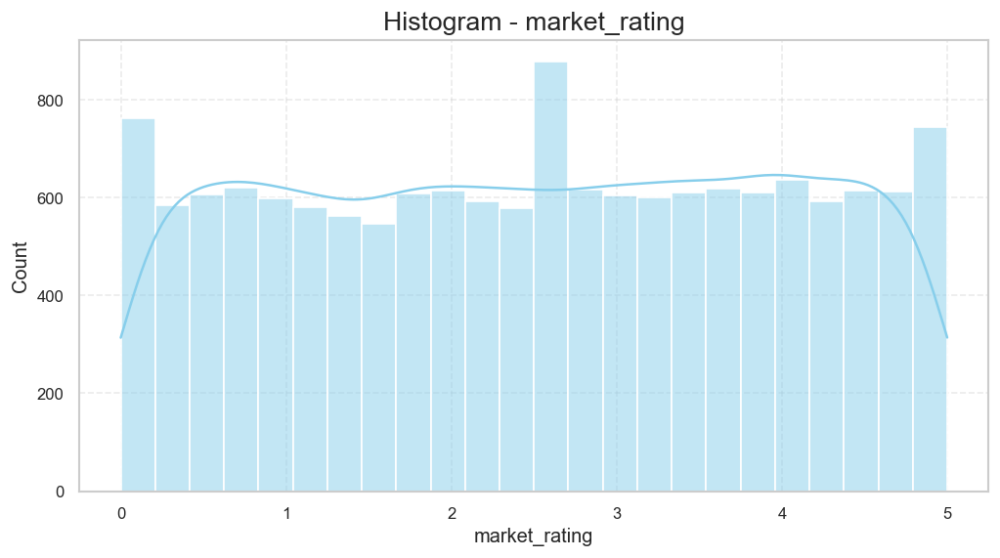


------------------------------------------------------------
INSIGHTS FOR MARKET_RATING
------------------------------------------------------------
Average Value : 2.51
Median Value : 2.5
Minimum Value : 0.0
Maximum Value : 5.0
Standard Deviation : 1.45
Skewness : -0.02
Kurtosis : -1.21
Reading : Distribution is positively skewed.


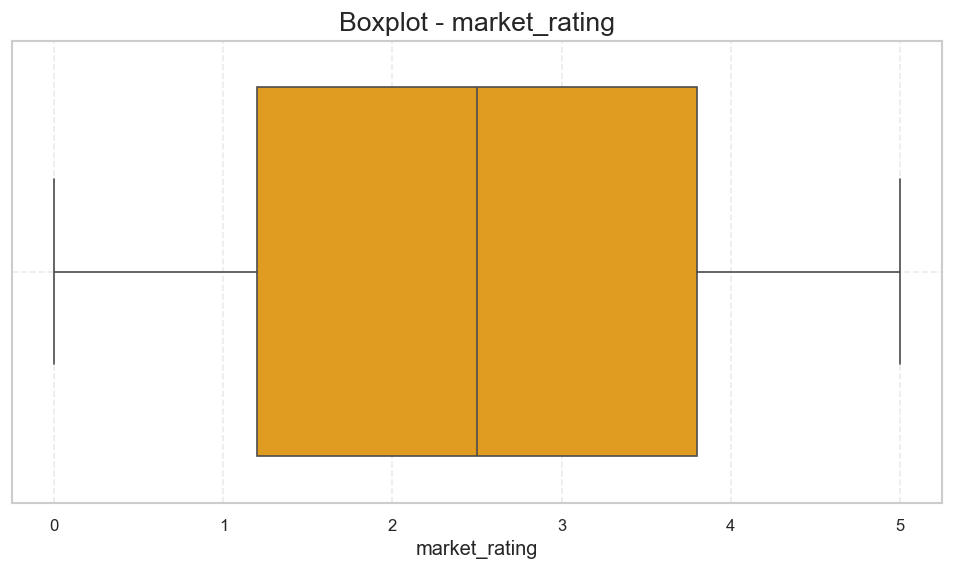

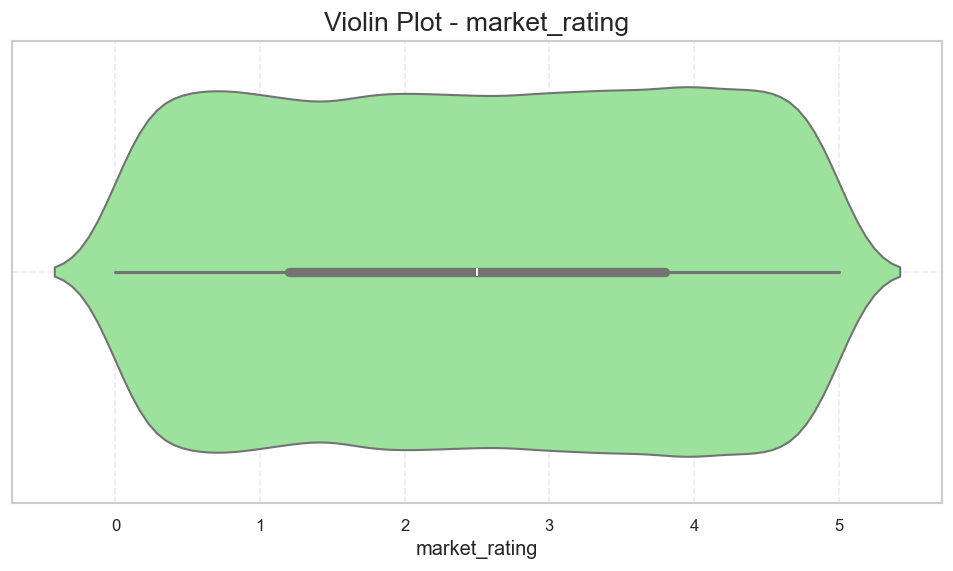

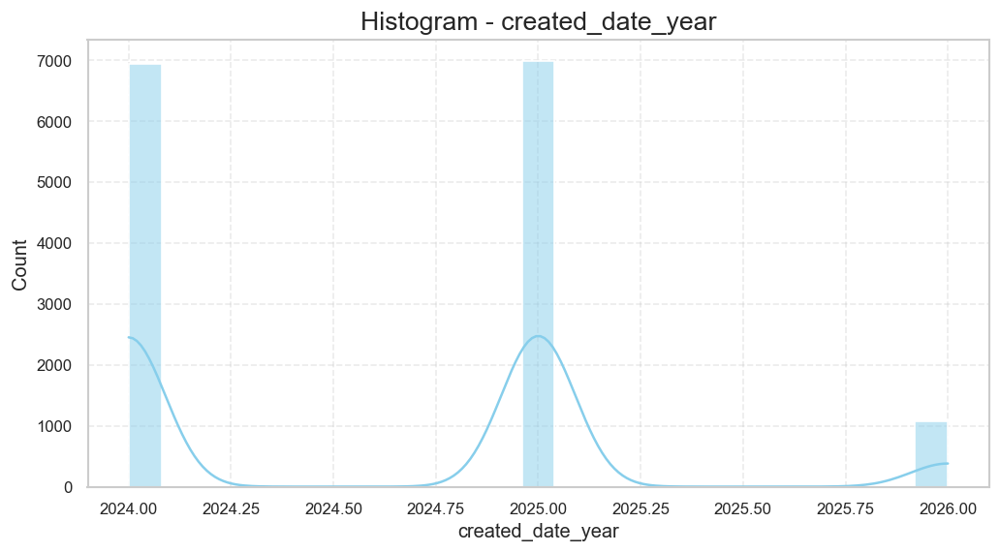


------------------------------------------------------------
INSIGHTS FOR CREATED_DATE_YEAR
------------------------------------------------------------
Average Value : 2024.61
Median Value : 2025.0
Minimum Value : 2024
Maximum Value : 2026
Standard Deviation : 0.62
Skewness : 0.49
Kurtosis : -0.64
Reading : Distribution is negatively skewed.


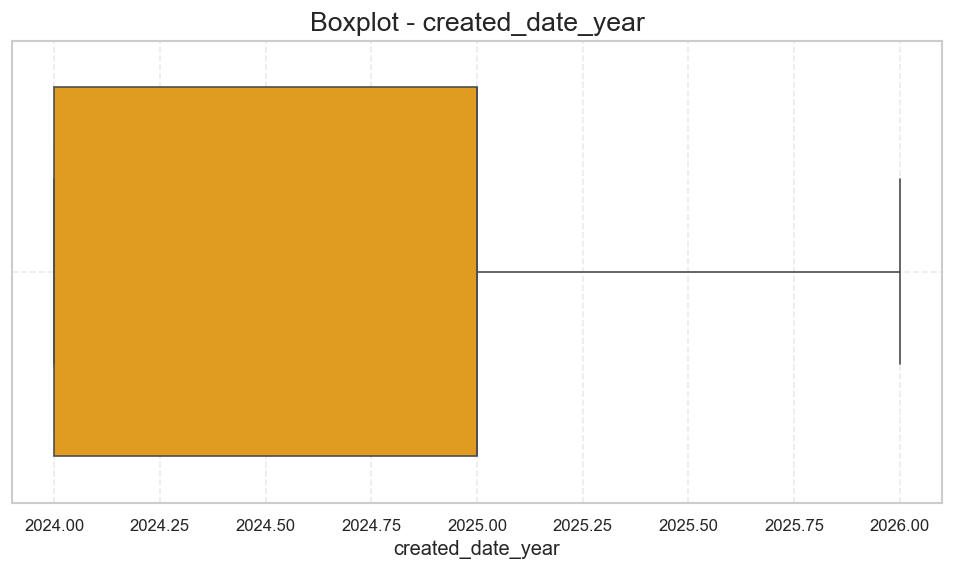

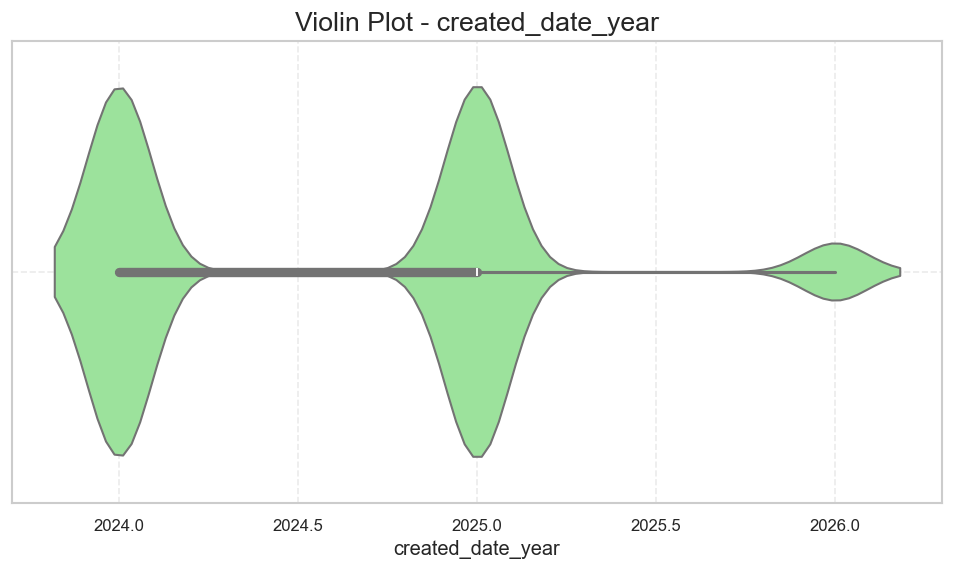

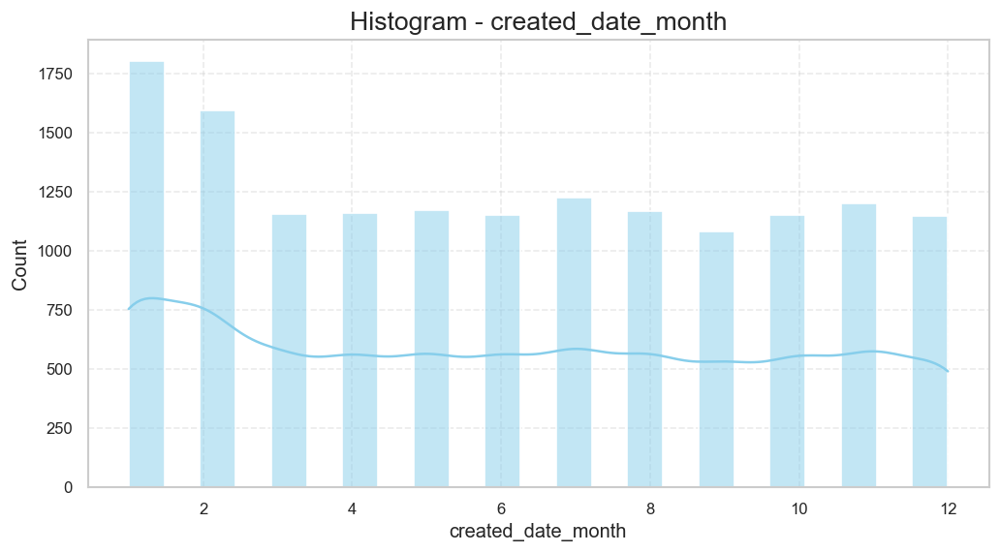


------------------------------------------------------------
INSIGHTS FOR CREATED_DATE_MONTH
------------------------------------------------------------
Average Value : 6.13
Median Value : 6.0
Minimum Value : 1
Maximum Value : 12
Standard Deviation : 3.58
Skewness : 0.1
Kurtosis : -1.28
Reading : Distribution is positively skewed.


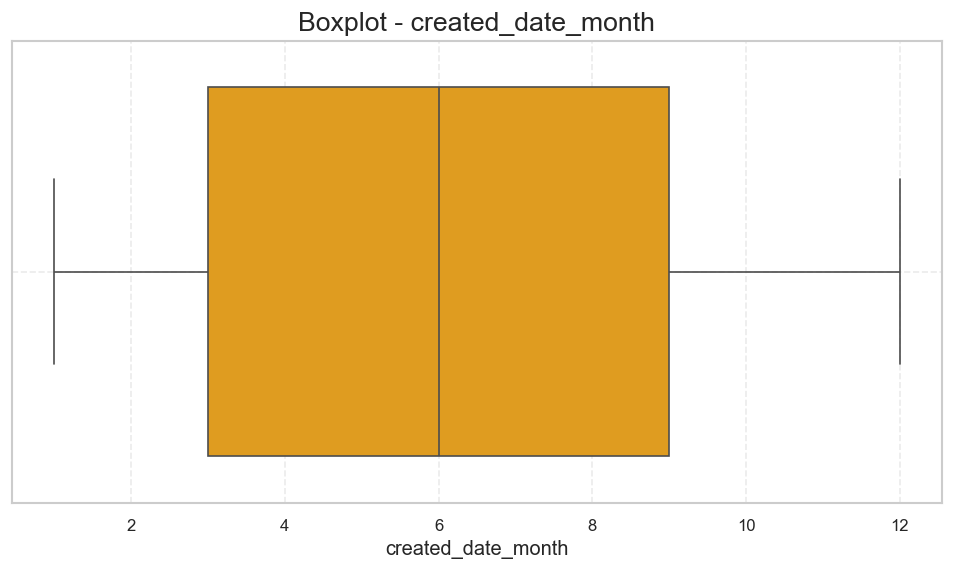

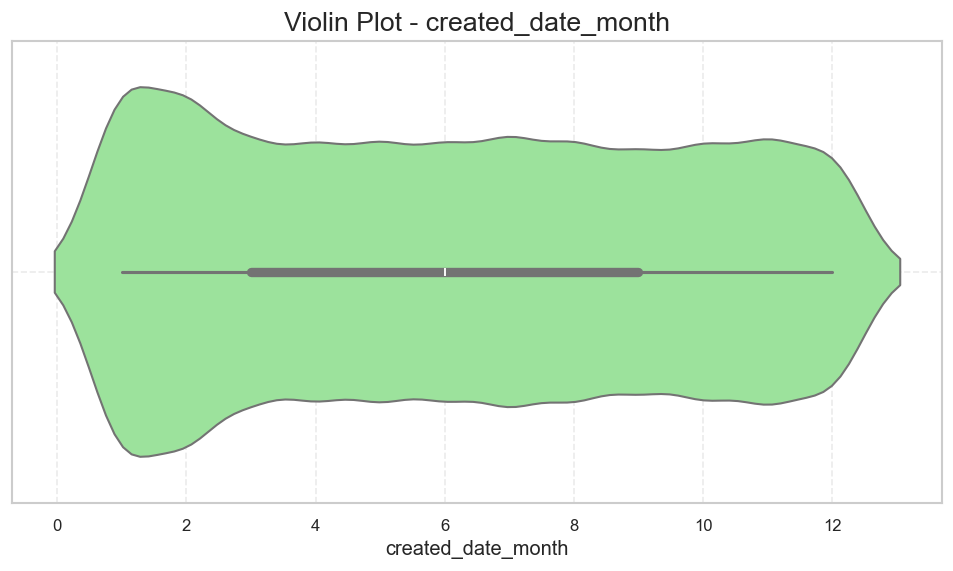

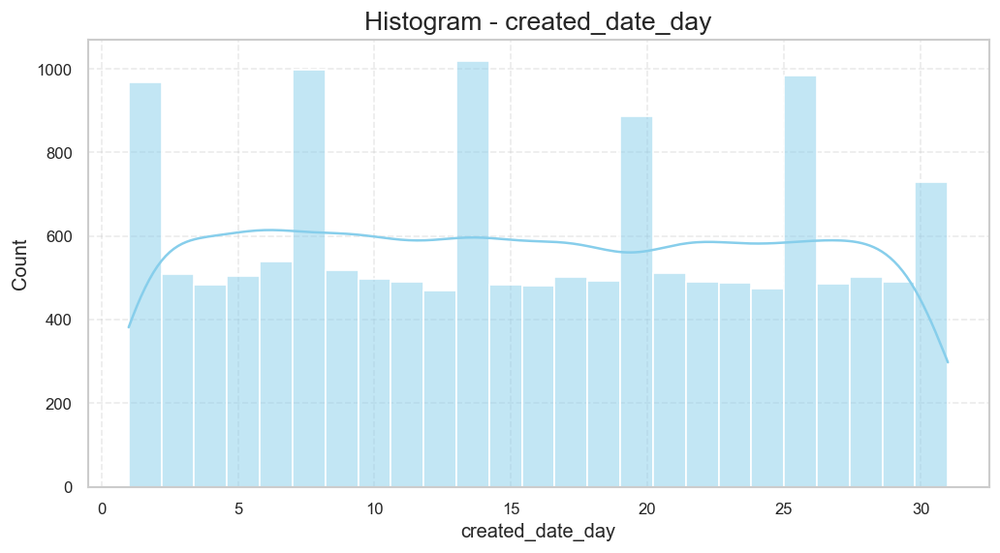


------------------------------------------------------------
INSIGHTS FOR CREATED_DATE_DAY
------------------------------------------------------------
Average Value : 15.67
Median Value : 16.0
Minimum Value : 1
Maximum Value : 31
Standard Deviation : 8.82
Skewness : 0.03
Kurtosis : -1.21
Reading : Distribution is negatively skewed.


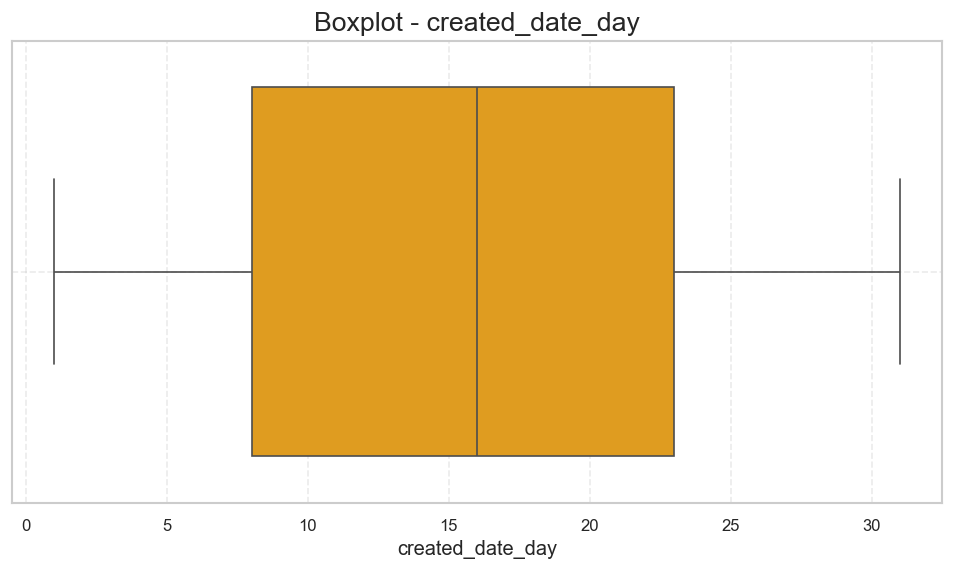

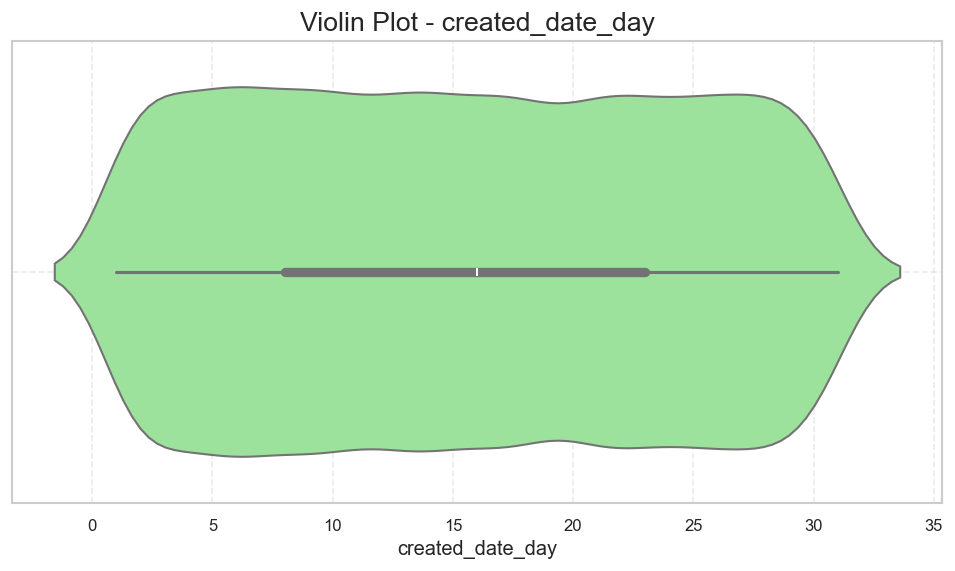

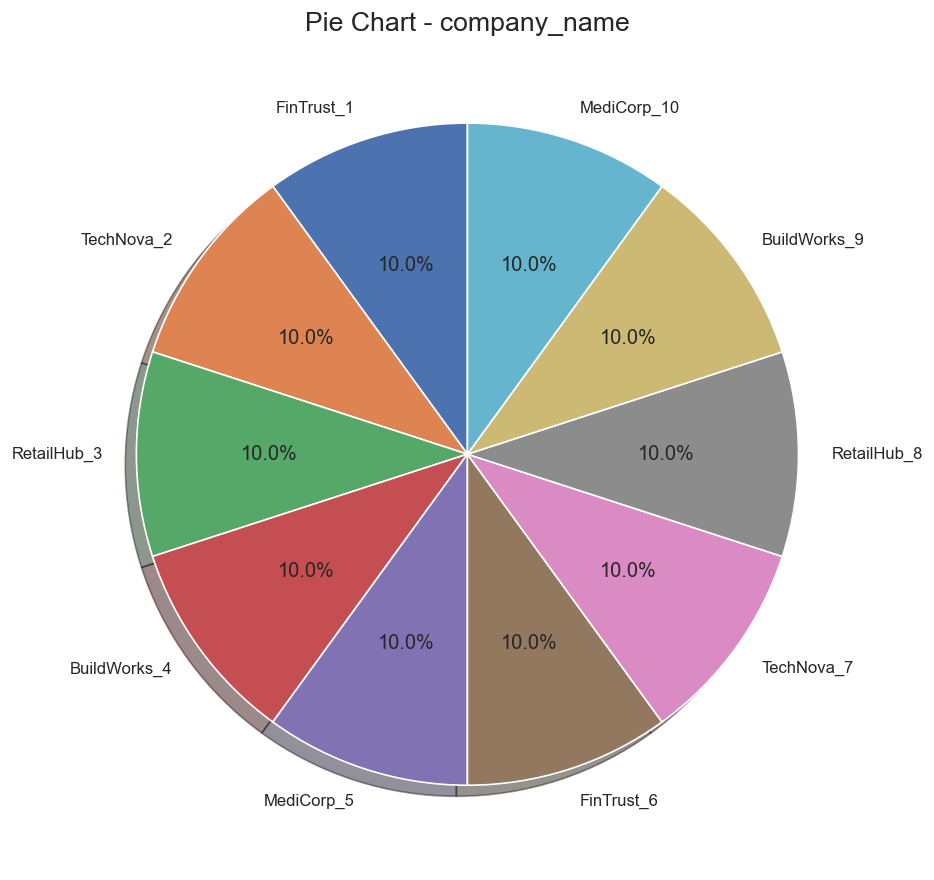

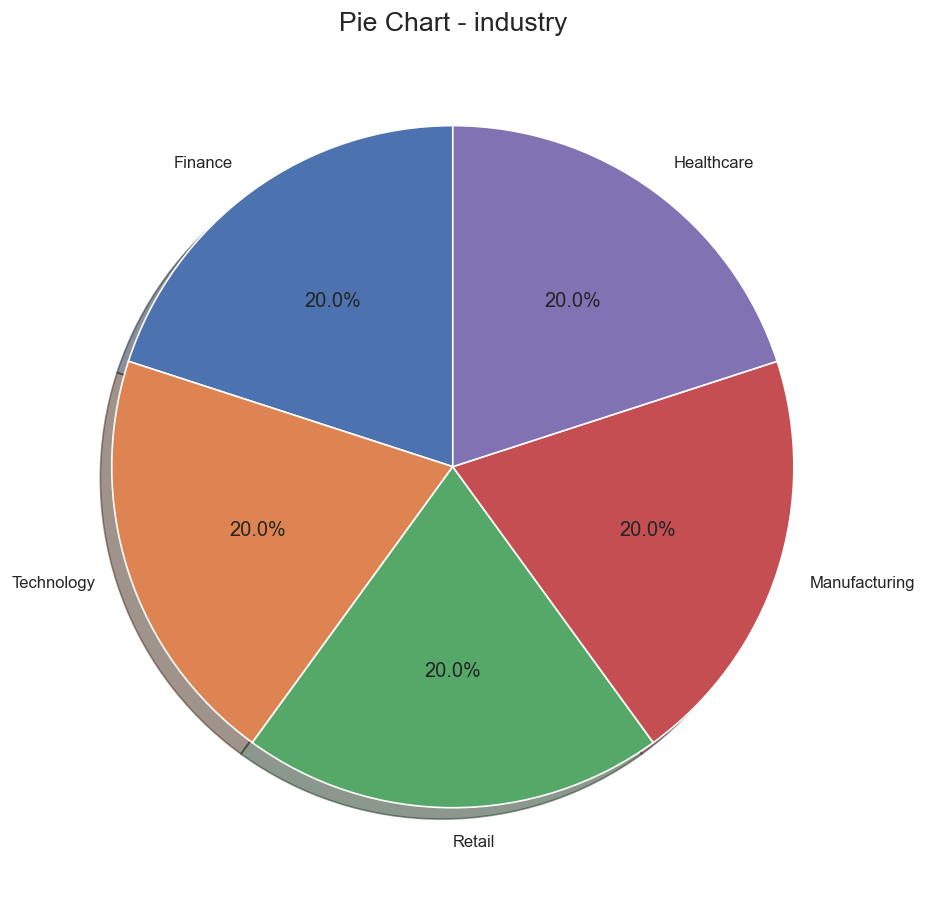

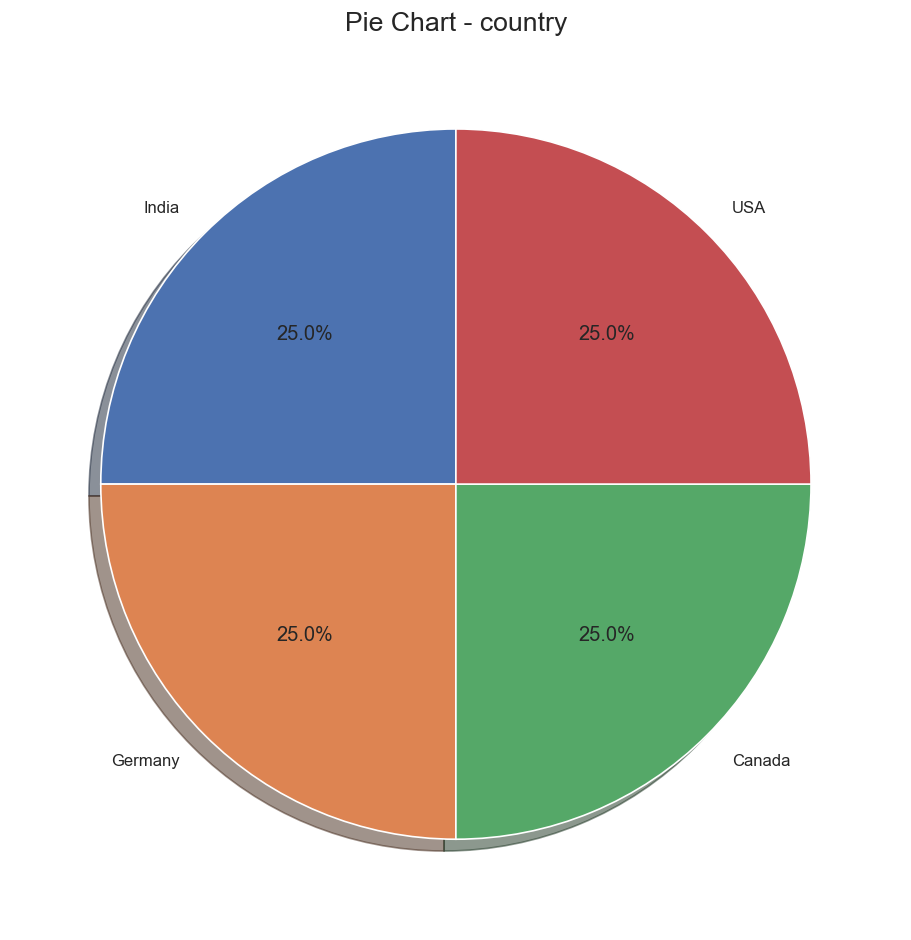

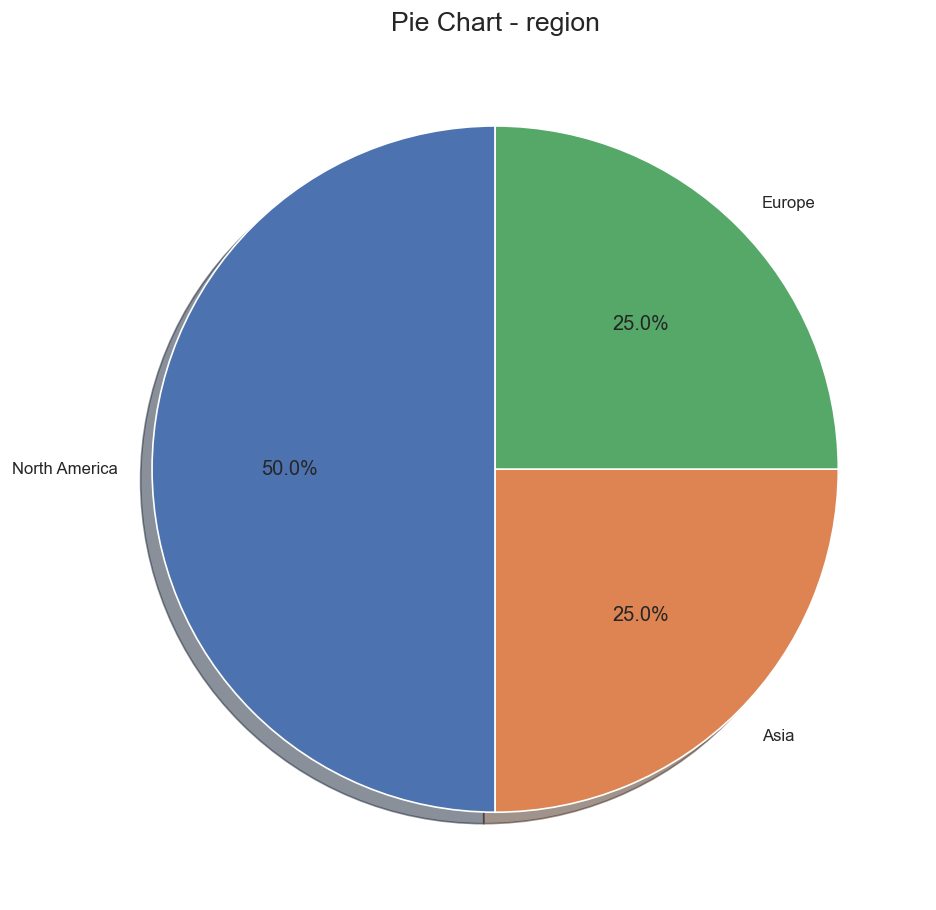

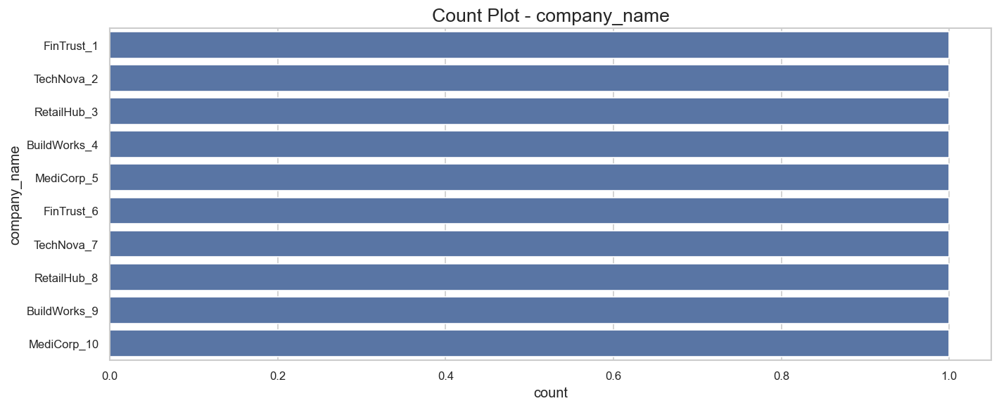

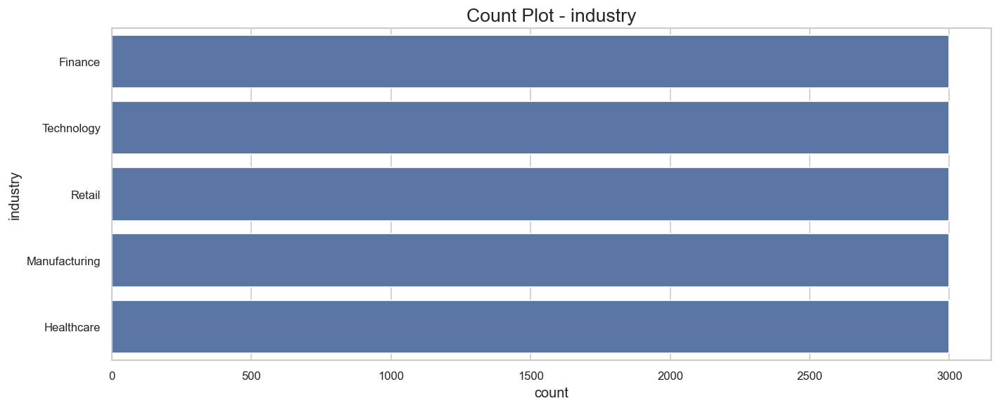

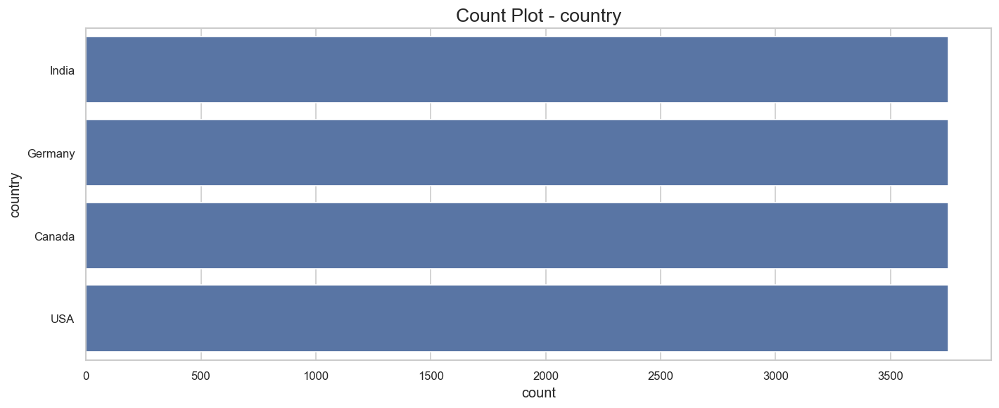

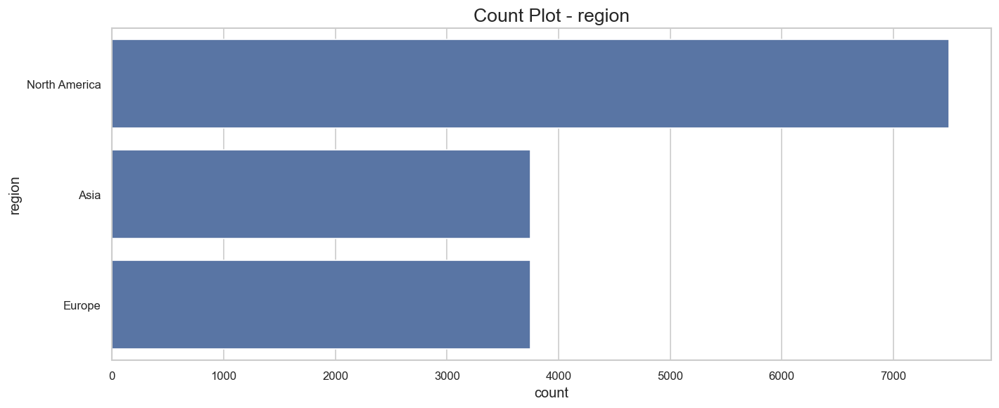


CORRELATION ANALYSIS


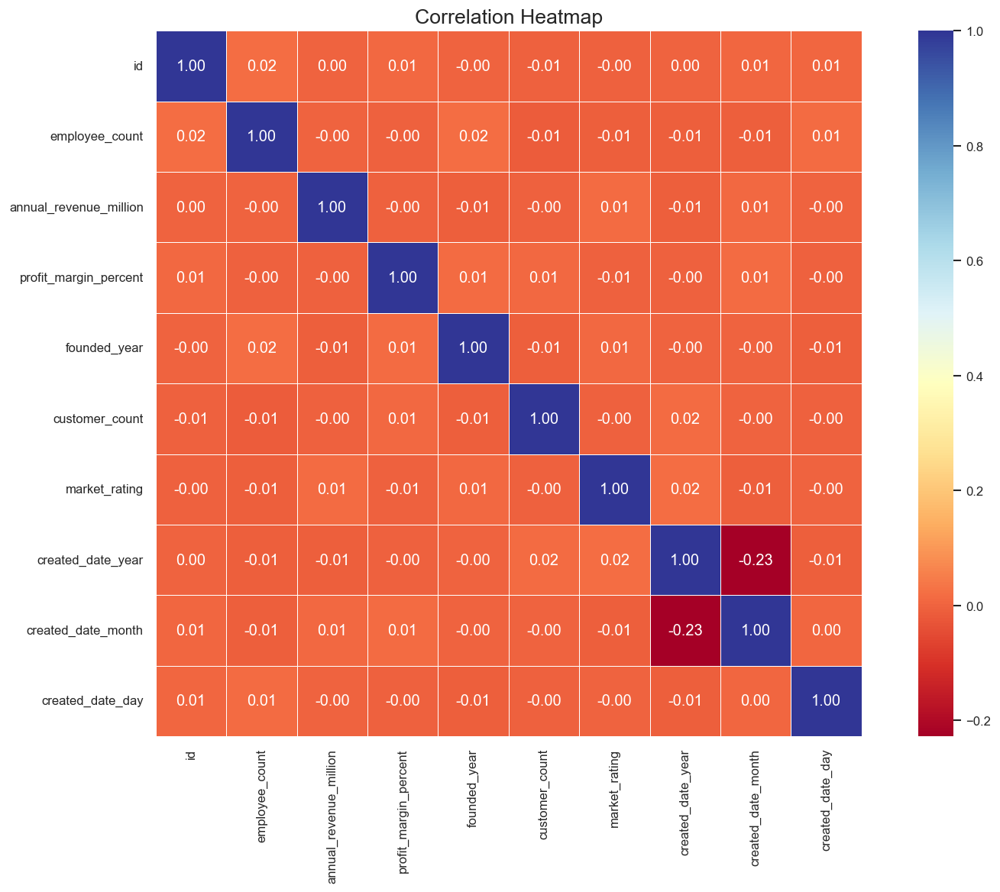


STRONGEST CORRELATIONS

created_date_year      created_date_month       -0.227704
employee_count         founded_year              0.021180
                       id                        0.018014
created_date_year      market_rating             0.017246
customer_count         created_date_year         0.015996
market_rating          annual_revenue_million    0.014639
profit_margin_percent  created_date_month        0.013272
employee_count         created_date_day          0.012483
customer_count         employee_count           -0.012431
profit_margin_percent  founded_year              0.012379
dtype: float64


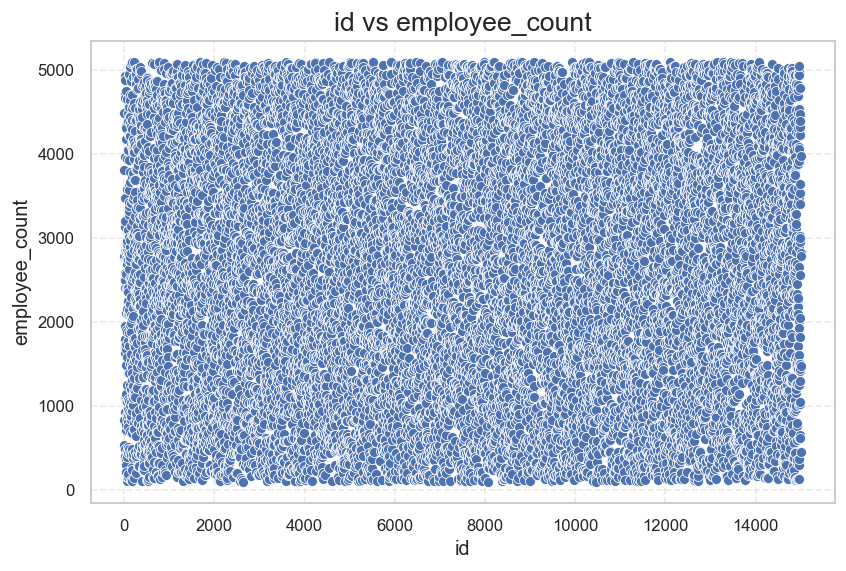

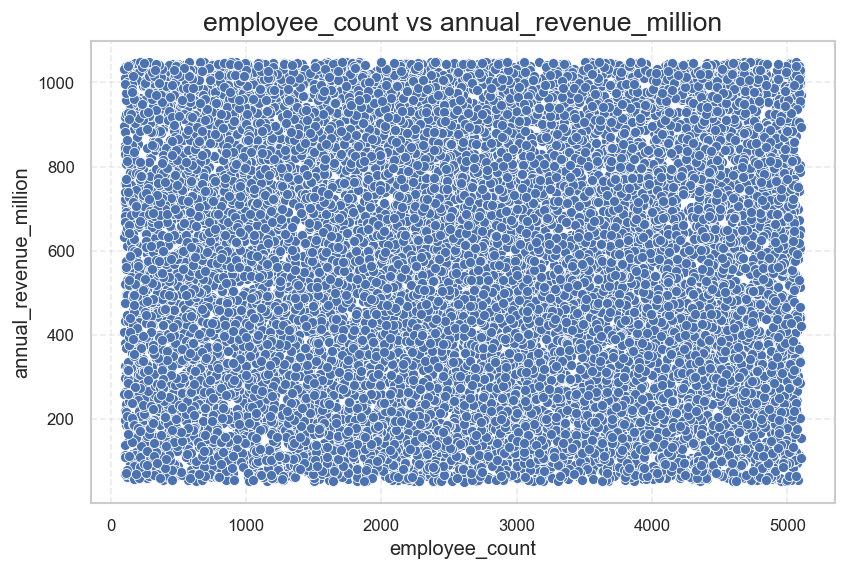

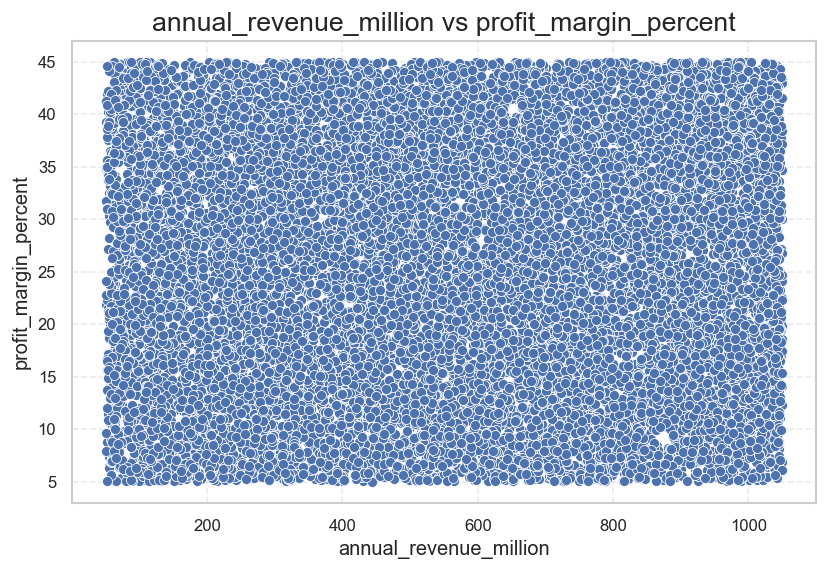

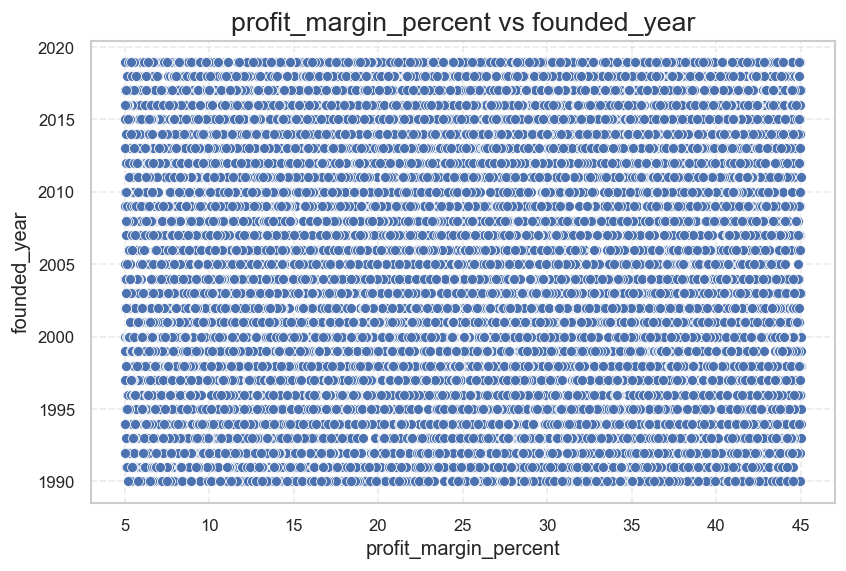

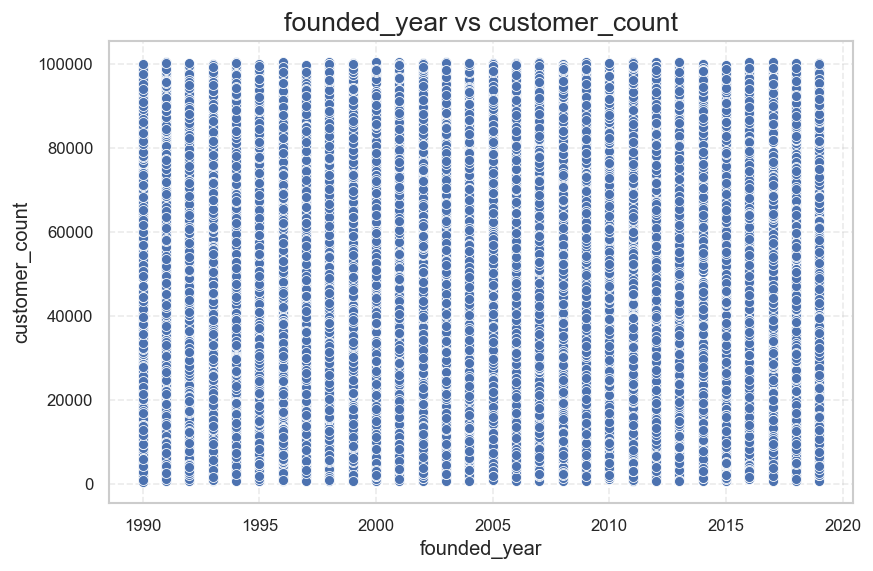


LINE GRAPH ANALYSIS


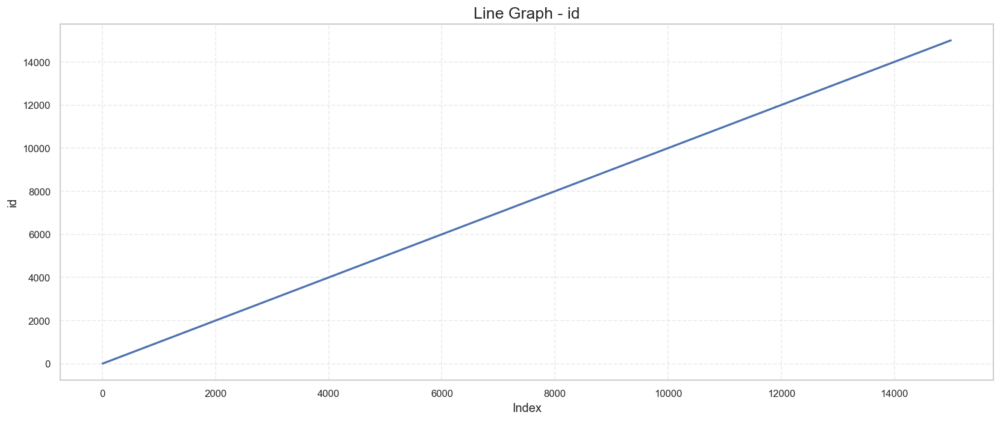


LINE GRAPH INSIGHTS FOR id
Trend Mean : 7500.5
Highest Value : 15000
Lowest Value : 1
Reading : Overall increasing trend detected.


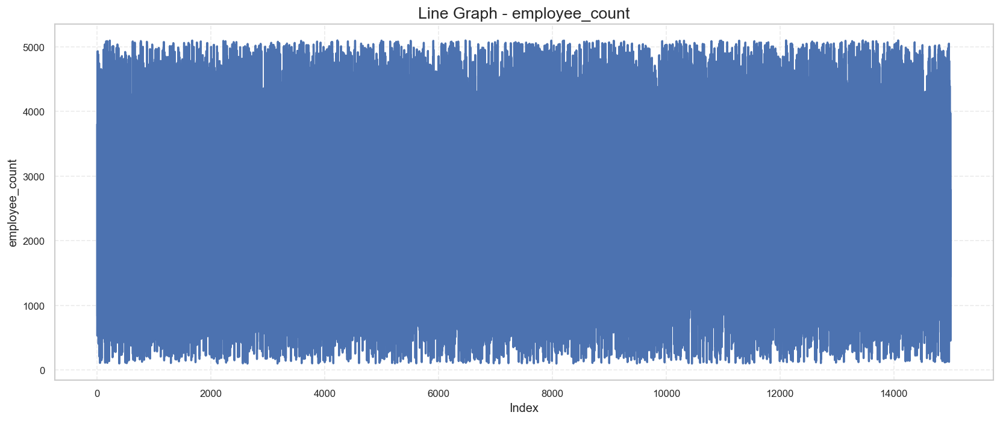


LINE GRAPH INSIGHTS FOR employee_count
Trend Mean : 2606.86
Highest Value : 5099
Lowest Value : 100
Reading : Overall increasing trend detected.


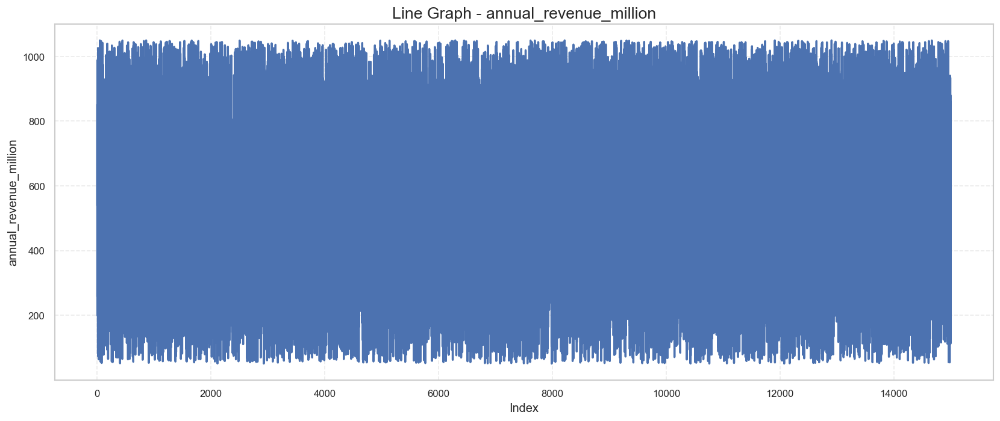


LINE GRAPH INSIGHTS FOR annual_revenue_million
Trend Mean : 549.73
Highest Value : 1049.96
Lowest Value : 50.16
Reading : Overall increasing trend detected.


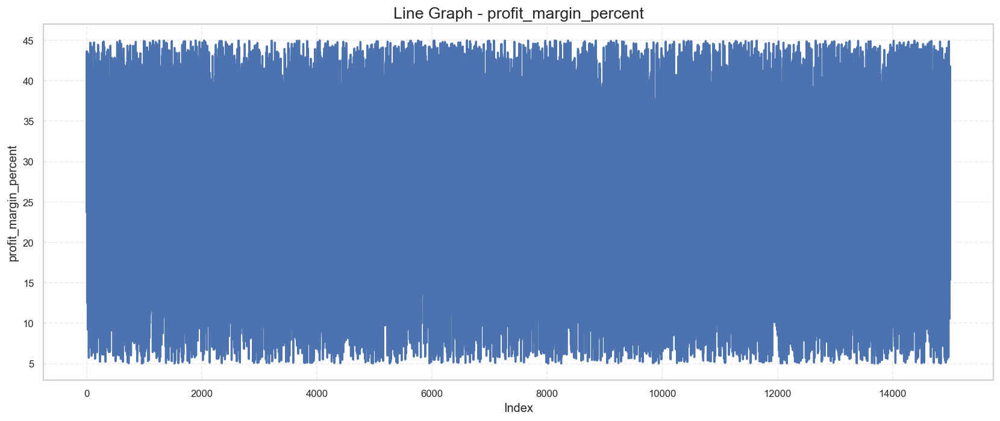


LINE GRAPH INSIGHTS FOR profit_margin_percent
Trend Mean : 25.01
Highest Value : 45.0
Lowest Value : 5.0
Reading : Overall decreasing trend detected.


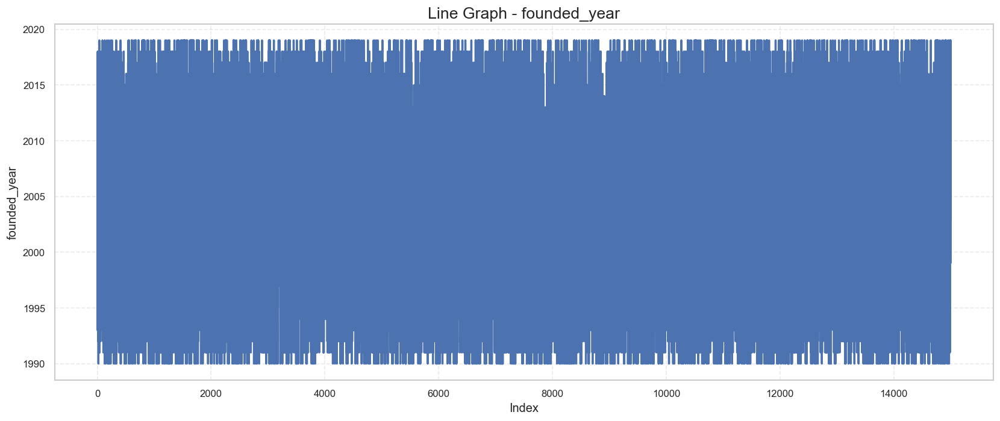


LINE GRAPH INSIGHTS FOR founded_year
Trend Mean : 2004.37
Highest Value : 2019
Lowest Value : 1990
Reading : Overall decreasing trend detected.


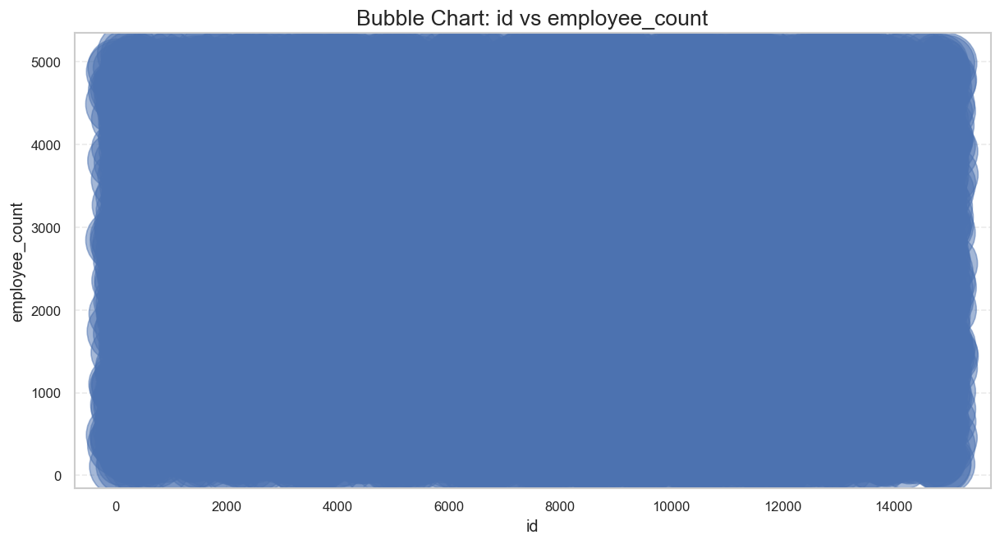


EDA PIPELINE COMPLETED SUCCESSFULLY!


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import (
    zscore,
    shapiro,
    skew,
    kurtosis
)

from pandas.plotting import (
    lag_plot,
    autocorrelation_plot,
    parallel_coordinates
)

from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor

from sklearn.ensemble import (
    RandomForestRegressor,
    GradientBoostingRegressor,
    IsolationForest
)

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

from sklearn.preprocessing import (
    StandardScaler,
    PolynomialFeatures
)

from sklearn.model_selection import train_test_split

from sklearn.metrics import (
    mean_absolute_error,
    mean_squared_error,
    r2_score,
    silhouette_score
)

from statsmodels.stats.outliers_influence import (
    variance_inflation_factor
)

import warnings
warnings.filterwarnings("ignore")

# =========================================================
# SETTINGS
# =========================================================

pd.set_option('display.max_columns', None)
pd.set_option('display.width', 300)

sns.set_theme(
    style="whitegrid",
    palette="deep"
)

plt.rcParams['figure.figsize'] = (10,5)
plt.rcParams['figure.dpi'] = 120
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10

print("="*70)
print("COMPLETE ENTERPRISE INDUSTRY DATASET EDA PIPELINE")
print("="*70)

# =========================================================
# LOAD DATASET
# =========================================================

df = pd.read_csv("INDUSTRY.csv")

print("\nDataset Loaded Successfully!")

# =========================================================
# BASIC UNDERSTANDING
# =========================================================

print("\nHEAD\n")
print(df.head())

print("\nSHAPE\n")
print(df.shape)

print("\nINFO\n")
print(df.info())

print("\nDATA TYPES\n")
print(df.dtypes)

print("\nDESCRIPTIVE STATS\n")
print(df.describe(include='all'))

# =========================================================
# MISSING VALUES
# =========================================================

missing_df = pd.DataFrame({

    'Missing Values': df.isnull().sum(),

    'Percentage': (
        df.isnull().sum() / len(df)
    ) * 100

})

print("\nMISSING VALUES\n")
print(missing_df)

# =========================================================
# DUPLICATES
# =========================================================

print("\nDUPLICATES\n")
print(df.duplicated().sum())

# =========================================================
# DATE DETECTION
# =========================================================

possible_date_cols = []

for col in df.columns:

    if 'date' in col.lower() or 'time' in col.lower():

        possible_date_cols.append(col)

for col in possible_date_cols:

    try:

        df[col] = pd.to_datetime(
            df[col],
            errors='coerce'
        )

        df[f'{col}_year'] = df[col].dt.year
        df[f'{col}_month'] = df[col].dt.month
        df[f'{col}_day'] = df[col].dt.day

    except:
        pass

# =========================================================
# COLUMN TYPES
# =========================================================

numerical_cols = df.select_dtypes(
    include=[np.number]
).columns.tolist()

categorical_cols = df.select_dtypes(
    include=['object', 'category']
).columns.tolist()

datetime_cols = df.select_dtypes(
    include=['datetime64']
).columns.tolist()

# =========================================================
# GRAPH INSIGHTS FUNCTION
# =========================================================

def graph_insights(series, col_name):

    try:

        print("\n" + "-"*60)
        print(f"INSIGHTS FOR {col_name.upper()}")
        print("-"*60)

        print(f"Average Value : {round(series.mean(),2)}")
        print(f"Median Value : {round(series.median(),2)}")
        print(f"Minimum Value : {round(series.min(),2)}")
        print(f"Maximum Value : {round(series.max(),2)}")
        print(f"Standard Deviation : {round(series.std(),2)}")

        print(f"Skewness : {round(skew(series.dropna()),2)}")
        print(f"Kurtosis : {round(kurtosis(series.dropna()),2)}")

        if series.mean() > series.median():

            print(
                "Reading : Distribution is positively skewed."
            )

        elif series.mean() < series.median():

            print(
                "Reading : Distribution is negatively skewed."
            )

        else:

            print(
                "Reading : Distribution appears balanced."
            )

        if skew(series.dropna()) > 1:

            print(
                "Business Insight : Few extremely large values dominate this feature."
            )

        if kurtosis(series.dropna()) > 3:

            print(
                "Business Insight : Presence of extreme enterprise-level observations."
            )

    except:
        pass

# =========================================================
# UNIVARIATE ANALYSIS
# =========================================================

print("\n" + "="*70)
print("UNIVARIATE ANALYSIS")
print("="*70)

for col in numerical_cols:

    try:

        if df[col].nunique() <= 1:
            continue

        # HISTOGRAM

        plt.figure()

        sns.histplot(
            df[col].dropna(),
            kde=True,
            color='skyblue'
        )

        plt.title(f'Histogram - {col}')

        plt.grid(
            True,
            linestyle='--',
            alpha=0.4
        )

        plt.show()

        graph_insights(
            df[col].dropna(),
            col
        )

        # BOXPLOT

        plt.figure()

        sns.boxplot(
            x=df[col],
            color='orange'
        )

        plt.title(f'Boxplot - {col}')

        plt.grid(
            True,
            linestyle='--',
            alpha=0.4
        )

        plt.show()

        # VIOLIN PLOT

        plt.figure()

        sns.violinplot(
            x=df[col],
            color='lightgreen'
        )

        plt.title(f'Violin Plot - {col}')

        plt.grid(
            True,
            linestyle='--',
            alpha=0.4
        )

        plt.show()

    except:
        continue

# =========================================================
# PIE CHARTS
# =========================================================

for col in categorical_cols:

    try:

        top_values = df[col].value_counts().head(10)

        plt.figure(figsize=(8,8))

        top_values.plot.pie(
            autopct='%1.1f%%',
            shadow=True,
            startangle=90
        )

        plt.title(f'Pie Chart - {col}')

        plt.ylabel("")

        plt.tight_layout()

        plt.show()

    except:
        continue

# =========================================================
# BAR CHARTS
# =========================================================

for col in categorical_cols:

    try:

        plt.figure(figsize=(12,5))

        sns.countplot(
            y=df[col],
            order=df[col].value_counts().index[:10]
        )

        plt.title(f'Count Plot - {col}')

        plt.tight_layout()

        plt.show()

    except:
        continue

# =========================================================
# CORRELATION ANALYSIS
# =========================================================

print("\n" + "="*70)
print("CORRELATION ANALYSIS")
print("="*70)

if len(numerical_cols) >= 2:

    correlation_matrix = df[
        numerical_cols
    ].corr()

    plt.figure(figsize=(16,10))

    sns.heatmap(
        correlation_matrix,
        annot=True,
        cmap='RdYlBu',
        fmt='.2f',
        linewidths=0.5,
        square=True
    )

    plt.title("Correlation Heatmap")

    plt.show()

    try:

        corr_pairs = correlation_matrix.unstack()

        corr_pairs = corr_pairs[
            corr_pairs.index.get_level_values(0)
            !=
            corr_pairs.index.get_level_values(1)
        ]

        corr_pairs = corr_pairs.sort_values(
            key=lambda x: abs(x),
            ascending=False
        )

        print("\nSTRONGEST CORRELATIONS\n")

        print(
            corr_pairs.drop_duplicates().head(10)
        )

    except:
        pass

# =========================================================
# SCATTERPLOTS
# =========================================================

if len(numerical_cols) >= 2:

    for i in range(min(5, len(numerical_cols)-1)):

        try:

            plt.figure(figsize=(8,5))

            sns.scatterplot(
                x=numerical_cols[i],
                y=numerical_cols[i+1],
                data=df
            )

            plt.title(
                f"{numerical_cols[i]} vs {numerical_cols[i+1]}"
            )

            plt.grid(
                True,
                linestyle='--',
                alpha=0.4
            )

            plt.show()

        except:
            continue

# =========================================================
# LINE GRAPHS
# =========================================================

print("\n" + "="*70)
print("LINE GRAPH ANALYSIS")
print("="*70)

try:

    if len(numerical_cols) >= 1:

        for col in numerical_cols[:5]:

            try:

                plt.figure(figsize=(14,6))

                plt.plot(
                    df[col].reset_index(drop=True),
                    linewidth=2
                )

                plt.title(f'Line Graph - {col}')

                plt.xlabel("Index")
                plt.ylabel(col)

                plt.grid(
                    True,
                    linestyle='--',
                    alpha=0.4
                )

                plt.tight_layout()

                plt.show()

                print(f"\nLINE GRAPH INSIGHTS FOR {col}")

                print(f"Trend Mean : {round(df[col].mean(),2)}")

                print(f"Highest Value : {round(df[col].max(),2)}")

                print(f"Lowest Value : {round(df[col].min(),2)}")

                if df[col].iloc[-1] > df[col].iloc[0]:

                    print("Reading : Overall increasing trend detected.")

                elif df[col].iloc[-1] < df[col].iloc[0]:

                    print("Reading : Overall decreasing trend detected.")

                else:

                    print("Reading : Stable trend observed.")

            except:
                continue

except:
    pass

# =========================================================
# BUBBLE CHARTS
# =========================================================

try:

    if len(numerical_cols) >= 3:

        plt.figure(figsize=(12,6))

        bubble_size = (
            df[numerical_cols[2]].fillna(0)
        )

        plt.scatter(
            df[numerical_cols[0]],
            df[numerical_cols[1]],
            s=bubble_size * 2,
            alpha=0.5
        )

        plt.xlabel(numerical_cols[0])
        plt.ylabel(numerical_cols[1])

        plt.title(
            f'Bubble Chart: {numerical_cols[0]} vs {numerical_cols[1]}'
        )

        plt.grid(
            True,
            linestyle='--',
            alpha=0.4
        )

        plt.show()

except:
    pass

print("\nEDA PIPELINE COMPLETED SUCCESSFULLY!")